In [5]:
import pandas as pd
import numpy as np
import statistics
import matplotlib.pyplot as plt
from matplotlib import figure
from sklearn.linear_model import LinearRegression as LR
from scipy.stats import norm
from functools import reduce 
import random
%matplotlib inline

In [2]:
def get_score(mdl,x,y):
    mdl.fit(x,y)
    return mdl.score(x,y)

In [3]:
def CreateScatter(df1, s1, alpha1, figsize, dpi, xlabel, xlabelsize, xticksize, ylabel, ylabelsize, yticksize,
                  title, titlefontsize, marker, scattercolor, x1=0, y1=0, df2=None, s2=None):
    '''
    Notes:
    -figsize must be in parenthesis. Ex: figsize=(6,6)
    -df1 should be points you don't want to stick out
    -df2 should be points you want to stick out
    '''
    plt.figure(figsize=figsize, dpi=dpi)
    
    # scatterplots from dataframe 1
    plt.scatter(x=df1.iloc[:,[0]],y=df1.iloc[:,[1]], 
            marker=marker, s=s1, alpha=alpha1, color=scattercolor)
    
    # text for points on scatterplot dataframe 1
    for i in range(len(df1.index)):
        plt.text(
        df1.iloc[i,0]+x1,
        df1.iloc[i,1]+y1,
        list(df1.index)[i],
        fontsize=9
        )
    
    # scatterplots from dataframe 2
    if df2 is not None:
        plt.scatter(x=df2.iloc[:,[0]],y=df2.iloc[:,[1]], 
                marker=marker, s=s2, color=scattercolor, edgecolor='black')
    

    plt.xlabel(xlabel=xlabel, fontsize=xlabelsize)
    plt.ylabel(ylabel=ylabel, fontsize=ylabelsize)
    plt.title(label=title, fontsize=titlefontsize, horizontalalignment='center', weight='bold')
    
    
    xticks = plt.xticks(fontsize=xticksize)
    yticks = plt.yticks(fontsize=yticksize)
    plt.grid(axis='both', ls='--', color='black', alpha=.25)
    plt.box()
    
    

In [4]:
def CreateBarH(df, figsize, title, titlefontsize, xticksize, yticksize, ytickrotate, 
               upperbarshiftup, lowerbarshiftdown, shiftupperbarleft, shiftlowerbarleft, textbarfontsize,
               textbarcolor, legend_labels, legend_order, legend_pos, legend_size, width=.7, color=None,):
    
    '''
    Notes:
    -futhermost column to the right is the upper bar, lower ones are to the left
    -figsize should be expressed in parenthesis. Ex: figsize = (6,6)
    -color should be expressed in brackets. Ex: color = ['black', 'red']
    -legend labels should be expressed in brackets. Ex: legend_labels = ["what", "is"]
    -legend position should be expressed in brackets. Ex: legend_pos = [.75, .6]
    -legend order should be expressed in brackets. Ex: legend_order = [1,0]
    '''
    
    df[::-1].plot.barh(figsize=figsize, width=width, color=color)

    plt.title(label=title, fontsize=titlefontsize, weight='bold', horizontalalignment='center')
    
    # text for upper bar
    for i in range(len(df[::-1].index)):
        plt.text(df[::-1].iloc[i,1]-shiftupperbarleft,
                i+upperbarshiftup,
                round(df[::-1].iloc[i,1],1), 
                fontsize=textbarfontsize, color=textbarcolor, horizontalalignment='center', weight='bold')
    
    # text for lower bar
    for i in range(len(df[::-1].index)):
        plt.text(df[::-1].iloc[i,0]-shiftlowerbarleft,
                i-lowerbarshiftdown,
                round(df[::-1].iloc[i,0],1), 
                fontsize=textbarfontsize, color=textbarcolor, horizontalalignment='center', weight='bold')
        
    plt.ylabel('')
    
    plt.box()
    xticks = plt.xticks(fontsize=xticksize)
    yticks = plt.yticks(fontsize=yticksize, rotation=ytickrotate)
    
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = legend_labels

    order = legend_order

    plt.legend([handles[i] for i in order], [labels[i] for i in order], bbox_to_anchor=legend_pos,
               prop={'size': legend_size})

### Get stats for regular season

In [3]:
df_players_shooting21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2021-22')
df_players_shooting21.set_index('PLAYER', inplace=True)
df_players_shooting21.replace('-', np.NaN, inplace=True)

df_players_shooting20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2020-21')
df_players_shooting20.set_index('PLAYER', inplace=True)
df_players_shooting20.replace('-', np.NaN, inplace=True)

df_players_shooting19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2019-20')
df_players_shooting19.set_index('PLAYER', inplace=True)
df_players_shooting19.replace('-', np.NaN, inplace=True)

df_players_shooting18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2018-19')
df_players_shooting18.set_index('PLAYER', inplace=True)
df_players_shooting18.replace('-', np.NaN, inplace=True)

df_players_shooting17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2017-18')
df_players_shooting17.set_index('PLAYER', inplace=True)
df_players_shooting17.replace('-', np.NaN, inplace=True)

df_players_shooting16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2016-17')
df_players_shooting16.set_index('PLAYER', inplace=True)
df_players_shooting16.replace('-', np.NaN, inplace=True)

df_players_shooting15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2015-16')
df_players_shooting15.set_index('PLAYER', inplace=True)
df_players_shooting15.replace('-', np.NaN, inplace=True)

df_players_shooting14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2014-15')
df_players_shooting14.set_index('PLAYER', inplace=True)
df_players_shooting14.replace('-', np.NaN, inplace=True)

df_players_shooting13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2013-14')
df_players_shooting13.set_index('PLAYER', inplace=True)
df_players_shooting13.replace('-', np.NaN, inplace=True)

df_players_shooting12 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2012-13')
df_players_shooting12.set_index('PLAYER', inplace=True)
df_players_shooting12.replace('-', np.NaN, inplace=True)

df_players_shooting11 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2011-12')
df_players_shooting11.set_index('PLAYER', inplace=True)
df_players_shooting11.replace('-', np.NaN, inplace=True)

df_players_shooting10 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2010-11')
df_players_shooting10.set_index('PLAYER', inplace=True)
df_players_shooting10.replace('-', np.NaN, inplace=True)

df_players_shooting09 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2009-10')
df_players_shooting09.set_index('PLAYER', inplace=True)
df_players_shooting09.replace('-', np.NaN, inplace=True)

df_players_shooting08 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2008-09')
df_players_shooting08.set_index('PLAYER', inplace=True)
df_players_shooting08.replace('-', np.NaN, inplace=True)

df_players_shooting07 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2007-08')
df_players_shooting07.set_index('PLAYER', inplace=True)
df_players_shooting07.replace('-', np.NaN, inplace=True)

df_players_shooting06 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2006-07')
df_players_shooting06.set_index('PLAYER', inplace=True)
df_players_shooting06.replace('-', np.NaN, inplace=True)

df_players_shooting05 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2005-06')
df_players_shooting05.set_index('PLAYER', inplace=True)
df_players_shooting05.replace('-', np.NaN, inplace=True)

df_players_shooting04 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2004-05')
df_players_shooting04.set_index('PLAYER', inplace=True)
df_players_shooting04.replace('-', np.NaN, inplace=True)

df_players_shooting03 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2003-04')
df_players_shooting03.set_index('PLAYER', inplace=True)
df_players_shooting03.replace('-', np.NaN, inplace=True)

df_players_shooting02 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2002-03')
df_players_shooting02.set_index('PLAYER', inplace=True)
df_players_shooting02.replace('-', np.NaN, inplace=True)

df_players_shooting01 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2001-02')
df_players_shooting01.set_index('PLAYER', inplace=True)
df_players_shooting01.replace('-', np.NaN, inplace=True)

df_players_shooting00 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 2000-01')
df_players_shooting00.set_index('PLAYER', inplace=True)
df_players_shooting00.replace('-', np.NaN, inplace=True)

df_players_shooting99 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 1999-00')
df_players_shooting99.set_index('PLAYER', inplace=True)
df_players_shooting99.replace('-', np.NaN, inplace=True)

df_players_shooting98 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 1998-99')
df_players_shooting98.set_index('PLAYER', inplace=True)
df_players_shooting98.replace('-', np.NaN, inplace=True)

df_players_shooting97 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Shooting 1997-98')
df_players_shooting97.set_index('PLAYER', inplace=True)
df_players_shooting97.replace('-', np.NaN, inplace=True)

In [93]:
df_players_traditional21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2021-22')
df_players_traditional21.set_index('PLAYER', inplace=True)

df_players_traditional20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2020-21')
df_players_traditional20.set_index('PLAYER', inplace=True)

df_players_traditional19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2019-20')
df_players_traditional19.set_index('PLAYER', inplace=True)

df_players_traditional18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2018-19')
df_players_traditional18.set_index('PLAYER', inplace=True)

df_players_traditional17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2017-18')
df_players_traditional17.set_index('PLAYER', inplace=True)

df_players_traditional16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2016-17')
df_players_traditional16.set_index('PLAYER', inplace=True)

df_players_traditional15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2015-16')
df_players_traditional15.set_index('PLAYER', inplace=True)

df_players_traditional14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2014-15')
df_players_traditional14.set_index('PLAYER', inplace=True)

df_players_traditional13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2013-14')
df_players_traditional13.set_index('PLAYER', inplace=True)

df_players_traditional12 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2012-13')
df_players_traditional12.set_index('PLAYER', inplace=True)

df_players_traditional11 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2011-12')
df_players_traditional11.set_index('PLAYER', inplace=True)

df_players_traditional10 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2010-11')
df_players_traditional10.set_index('PLAYER', inplace=True)

df_players_traditional09 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2009-10')
df_players_traditional09.set_index('PLAYER', inplace=True)

df_players_traditional08 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2008-09')
df_players_traditional08.set_index('PLAYER', inplace=True)

df_players_traditional07 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2007-08')
df_players_traditional07.set_index('PLAYER', inplace=True)

df_players_traditional06 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2006-07')
df_players_traditional06.set_index('PLAYER', inplace=True)

df_players_traditional05 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2005-06')
df_players_traditional05.set_index('PLAYER', inplace=True)

df_players_traditional04 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2004-05')
df_players_traditional04.set_index('PLAYER', inplace=True)

df_players_traditional03 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2003-04')
df_players_traditional03.set_index('PLAYER', inplace=True)

df_players_traditional02 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2002-03')
df_players_traditional02.set_index('PLAYER', inplace=True)

df_players_traditional01 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2001-02')
df_players_traditional01.set_index('PLAYER', inplace=True)

df_players_traditional00 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 2000-01')
df_players_traditional00.set_index('PLAYER', inplace=True)


df_players_traditional99 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 1999-00')
df_players_traditional99.set_index('PLAYER', inplace=True)

df_players_traditional98 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 1998-99')
df_players_traditional98.set_index('PLAYER', inplace=True)

df_players_traditional97 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Traditional 1997-98')
df_players_traditional97.set_index('PLAYER', inplace=True)

In [94]:
df_players_advanced21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2021-22')
df_players_advanced21.set_index('PLAYER', inplace=True)

df_players_advanced20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2020-21')
df_players_advanced20.set_index('PLAYER', inplace=True)

df_players_advanced19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2019-20')
df_players_advanced19.set_index('PLAYER', inplace=True)

df_players_advanced18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2018-19')
df_players_advanced18.set_index('PLAYER', inplace=True)

df_players_advanced17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2017-18')
df_players_advanced17.set_index('PLAYER', inplace=True)

df_players_advanced16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2016-17')
df_players_advanced16.set_index('PLAYER', inplace=True)

df_players_advanced15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2015-16')
df_players_advanced15.set_index('PLAYER', inplace=True)

df_players_advanced14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2014-15')
df_players_advanced14.set_index('PLAYER', inplace=True)

df_players_advanced13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2013-14')
df_players_advanced13.set_index('PLAYER', inplace=True)

df_players_advanced12 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2012-13')
df_players_advanced12.set_index('PLAYER', inplace=True)

df_players_advanced11 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2011-12')
df_players_advanced11.set_index('PLAYER', inplace=True)

df_players_advanced10 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2010-11')
df_players_advanced10.set_index('PLAYER', inplace=True)

df_players_advanced09 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2009-10')
df_players_advanced09.set_index('PLAYER', inplace=True)

df_players_advanced08 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2008-09')
df_players_advanced08.set_index('PLAYER', inplace=True)

df_players_advanced07 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2007-08')
df_players_advanced07.set_index('PLAYER', inplace=True)

df_players_advanced06 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2006-07')
df_players_advanced06.set_index('PLAYER', inplace=True)

df_players_advanced05 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2005-06')
df_players_advanced05.set_index('PLAYER', inplace=True)

df_players_advanced04 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2004-05')
df_players_advanced04.set_index('PLAYER', inplace=True)

df_players_advanced03 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2003-04')
df_players_advanced03.set_index('PLAYER', inplace=True)

df_players_advanced02 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2002-03')
df_players_advanced02.set_index('PLAYER', inplace=True)

df_players_advanced01 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2001-02')
df_players_advanced01.set_index('PLAYER', inplace=True)

df_players_advanced00 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 2000-01')
df_players_advanced00.set_index('PLAYER', inplace=True)

df_players_advanced99 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 1999-00')
df_players_advanced99.set_index('PLAYER', inplace=True)

df_players_advanced98 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 1998-99')
df_players_advanced98.set_index('PLAYER', inplace=True)

df_players_advanced97 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='Advanced 1997-98')
df_players_advanced97.set_index('PLAYER', inplace=True)

In [343]:
allADVANCED = [df_players_advanced21, df_players_advanced20, df_players_advanced19, df_players_advanced18,
             df_players_advanced19, df_players_advanced18, df_players_advanced17, df_players_advanced16,
             df_players_advanced15, df_players_advanced14, df_players_advanced13, df_players_advanced12,
              df_players_advanced11, df_players_advanced10, df_players_advanced09, df_players_advanced08,
              df_players_advanced07, df_players_advanced06, df_players_advanced05, df_players_advanced04,
              df_players_advanced03, df_players_advanced02, df_players_advanced01, df_players_advanced00,
              df_players_advanced99, df_players_advanced98, df_players_advanced97]

In [11]:
allshooting = [df_players_shooting21, df_players_shooting20, df_players_shooting19, df_players_shooting18, df_players_shooting17,
              df_players_shooting16, df_players_shooting15, df_players_shooting14, df_players_shooting13, df_players_shooting12,
              df_players_shooting11, df_players_shooting10, df_players_shooting09, df_players_shooting08, df_players_shooting07,
              df_players_shooting06, df_players_shooting05, df_players_shooting04, df_players_shooting03, df_players_shooting02,
              df_players_shooting01, df_players_shooting00, df_players_shooting99, df_players_shooting98, df_players_shooting97]

RA_FG100_AVG = []

for df in allshooting:
    RA_FG100_AVG.append(df['FG% (Restricted Area)'].mean())
    
df_RA = pd.DataFrame({
    'Season': ['2021-22', '2020-21', '2019-20', '2018-19', '2017-18', '2016-17', '2015-16', '2014-15', '2013-14', '2012-13',
              '2011-12', '2010-11', '2009-10', '2008-09', '2007-08', '2006-07', '2005-06', '2004-05', '2003-04', '2002-03',
              '2001-02', '2000-01', '1999-00', '1998-99', '1997-98'],
    'Restricted Area FG% League Average': RA_FG100_AVG
    
})

df_RA.set_index('Season', inplace=True)
df_RA

,Restricted Area FG% League Average
Season,
2021-22,58.956551
2020-21,60.364630
2019-20,60.245833
2018-19,59.113826
2017-18,57.582963
2016-17,57.456289
2015-16,57.767227
2014-15,56.448374
2013-14,57.007469


In [12]:
df_players_trackingshooting21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2021-22')
df_players_trackingshooting21.set_index('PLAYER', inplace=True)

df_players_trackingshooting20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2020-21')
df_players_trackingshooting20.set_index('PLAYER', inplace=True)

df_players_trackingshooting19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2019-20')
df_players_trackingshooting19.set_index('PLAYER', inplace=True)

df_players_trackingshooting18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2018-19')
df_players_trackingshooting18.set_index('PLAYER', inplace=True)

df_players_trackingshooting17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2017-18')
df_players_trackingshooting17.set_index('PLAYER', inplace=True)

df_players_trackingshooting16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2016-17')
df_players_trackingshooting16.set_index('PLAYER', inplace=True)

df_players_trackingshooting15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2015-16')
df_players_trackingshooting15.set_index('PLAYER', inplace=True)

df_players_trackingshooting14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2014-15')
df_players_trackingshooting14.set_index('PLAYER', inplace=True)

df_players_trackingshooting13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TRACKING SHOOTING 2013-14')
df_players_trackingshooting13.set_index('PLAYER', inplace=True)

In [341]:
df_players_passing21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2021-22')
df_players_passing21['MP'] = df_players_passing21['GP'] * df_players_passing21['MIN']
df_players_passing21.set_index('PLAYER', inplace=True)

df_players_passing20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2020-21')
df_players_passing20['MP'] = df_players_passing20['GP'] * df_players_passing20['MIN']
df_players_passing20.set_index('PLAYER', inplace=True)

df_players_passing19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2019-20')
df_players_passing19['MP'] = df_players_passing19['GP'] * df_players_passing19['MIN']
df_players_passing19.set_index('PLAYER', inplace=True)

df_players_passing18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2018-19')
df_players_passing18['MP'] = df_players_passing18['GP'] * df_players_passing18['MIN']
df_players_passing18.set_index('PLAYER', inplace=True)

df_players_passing17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2017-18')
df_players_passing17['MP'] = df_players_passing17['GP'] * df_players_passing17['MIN']
df_players_passing17.set_index('PLAYER', inplace=True)

df_players_passing16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2016-17')
df_players_passing16['MP'] = df_players_passing16['GP'] * df_players_passing16['MIN']
df_players_passing16.set_index('PLAYER', inplace=True)

df_players_passing15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2015-16')
df_players_passing15['MP'] = df_players_passing15['GP'] * df_players_passing15['MIN']
df_players_passing15.set_index('PLAYER', inplace=True)

df_players_passing14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2014-15')
df_players_passing14['MP'] = df_players_passing14['GP'] * df_players_passing14['MIN']
df_players_passing14.set_index('PLAYER', inplace=True)

df_players_passing13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'PASSING 2013-14')
df_players_passing13['MP'] = df_players_passing13['GP'] * df_players_passing13['MIN']
df_players_passing13.set_index('PLAYER', inplace=True)

In [342]:
allPASSING = [df_players_passing21, df_players_passing20, df_players_passing19, df_players_passing18,
             df_players_passing19, df_players_passing18, df_players_passing17, df_players_passing16,
             df_players_passing15, df_players_passing14, df_players_passing13]

In [ ]:
df_players_drives21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2021-22')
df_players_drives21.set_index('PLAYER', inplace=True)

df_players_drives20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2020-21')
df_players_drives20.set_index('PLAYER', inplace=True)

df_players_drives19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2019-20')
df_players_drives19.set_index('PLAYER', inplace=True)

df_players_drives18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2018-19')
df_players_drives18.set_index('PLAYER', inplace=True)

df_players_drives17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2017-18')
df_players_drives17.set_index('PLAYER', inplace=True)

df_players_drives16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2016-17')
df_players_drives16.set_index('PLAYER', inplace=True)

df_players_drives15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2015-16')
df_players_drives15.set_index('PLAYER', inplace=True)

df_players_drives14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2014-15')
df_players_drives14.set_index('PLAYER', inplace=True)

df_players_drives13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'DRIVES 2013-14')
df_players_drives13.set_index('PLAYER', inplace=True)



In [ ]:
df_players_touches21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2021-22')
df_players_touches21.set_index('PLAYER', inplace=True)

df_players_touches20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2020-21')
df_players_touches20.set_index('PLAYER', inplace=True)

df_players_touches19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2019-20')
df_players_touches19.set_index('PLAYER', inplace=True)

df_players_touches18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2018-19')
df_players_touches18.set_index('PLAYER', inplace=True)

df_players_touches17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2017-18')
df_players_touches17.set_index('PLAYER', inplace=True)

df_players_touches16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2016-17')
df_players_touches16.set_index('PLAYER', inplace=True)

df_players_touches15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2015-16')
df_players_touches15.set_index('PLAYER', inplace=True)

df_players_touches14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2014-15')
df_players_touches14.set_index('PLAYER', inplace=True)

df_players_touches13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'TOUCHES 2013-14')
df_players_touches13.set_index('PLAYER', inplace=True)

In [ ]:
df_players_rebounding21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2021-22')
df_players_rebounding21.set_index('PLAYER', inplace=True)

df_players_rebounding20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2020-21')
df_players_rebounding20.set_index('PLAYER', inplace=True)

df_players_rebounding19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2019-20')
df_players_rebounding19.set_index('PLAYER', inplace=True)

df_players_rebounding18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2018-19')
df_players_rebounding18.set_index('PLAYER', inplace=True)

df_players_rebounding17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2017-18')
df_players_rebounding17.set_index('PLAYER', inplace=True)

df_players_rebounding16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2016-17')
df_players_rebounding16.set_index('PLAYER', inplace=True)

df_players_rebounding15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2015-16')
df_players_rebounding15.set_index('PLAYER', inplace=True)

df_players_rebounding14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2014-15')
df_players_rebounding14.set_index('PLAYER', inplace=True)

df_players_rebounding13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name = 'REBOUNDING 2013-14')
df_players_rebounding13.set_index('PLAYER', inplace=True)

In [ ]:
alltracking21 = pd.concat([df_players_shooting21, df_players_trackingshooting21.drop(['TEAM'], axis='columns'), 
                          df_players_passing21.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives21.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches21.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding21.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking21.head(1)

In [ ]:
alltracking21.columns.duplicated()

In [ ]:
alltracking20 = pd.concat([df_players_shooting20, df_players_trackingshooting20.drop(['TEAM'], axis='columns'), 
                          df_players_passing20.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives20.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches20.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding20.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking20.replace('-', np.NaN, inplace=True)
alltracking20.head(1)

In [ ]:
alltracking19 = pd.concat([df_players_shooting19, df_players_trackingshooting19.drop(['TEAM'], axis='columns'), 
                          df_players_passing19.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives19.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches19.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding19.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking19.replace('-', np.NaN, inplace=True)
alltracking19.head(1)

In [ ]:
alltracking18 = pd.concat([df_players_shooting18, df_players_trackingshooting18.drop(['TEAM'], axis='columns'), 
                          df_players_passing18.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives18.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches18.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding18.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking18.replace('-', np.NaN, inplace=True)
alltracking18.head(1)

In [ ]:
alltracking17 = pd.concat([df_players_shooting17, df_players_trackingshooting17.drop(['TEAM'], axis='columns'), 
                          df_players_passing17.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives17.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches17.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding17.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking17.replace('-', np.NaN, inplace=True)
alltracking17.head(1)

In [ ]:
alltracking16 = pd.concat([df_players_shooting16, df_players_trackingshooting16.drop(['TEAM'], axis='columns'), 
                          df_players_passing16.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives16.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches16.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding16.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking16.replace('-', np.NaN, inplace=True)
alltracking16.head(1)

In [ ]:
alltracking15 = pd.concat([df_players_shooting15, df_players_trackingshooting15.drop(['TEAM'], axis='columns'), 
                          df_players_passing15.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives15.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches15.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding15.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking15.replace('-', np.NaN, inplace=True)
alltracking15.head(1)

In [ ]:
alltracking14 = pd.concat([df_players_shooting14, df_players_trackingshooting14.drop(['TEAM'], axis='columns'), 
                          df_players_passing14.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives14.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches14.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding14.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking14.replace('-', np.NaN, inplace=True)
alltracking14.head(1)

In [ ]:
alltracking13 = pd.concat([df_players_shooting13, df_players_trackingshooting13.drop(['TEAM'], axis='columns'), 
                          df_players_passing13.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_drives13.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_touches13.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns'), 
                           df_players_rebounding13.drop(['TEAM','GP', 'W', 'L', 'MIN'], axis='columns')]
                                , axis=1)
alltracking13.replace('-', np.NaN, inplace=True)
alltracking13.head(1)

In [ ]:
# combine two dataframes
df_players21 = pd.concat([df_players_traditional21, df_players_advanced21.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players21.head(1)

In [ ]:
# combine two dataframes
df_players20 = pd.concat([df_players_traditional20, df_players_advanced20.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players20.head(1)

In [ ]:
# combine two dataframes
df_players19 = pd.concat([df_players_traditional19, df_players_advanced19.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players19.head(1)

In [ ]:
# combine two dataframes
df_players18 = pd.concat([df_players_traditional18, df_players_advanced18.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players18.head(1)

In [ ]:
# combine two dataframes
df_players17 = pd.concat([df_players_traditional17, df_players_advanced17.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players17.head(1)

In [ ]:
# combine two dataframes
df_players16 = pd.concat([df_players_traditional16, df_players_advanced16.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players16.head(1)

In [ ]:
# combine two dataframes
df_players15 = pd.concat([df_players_traditional15, df_players_advanced15.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players15.head(1)

In [ ]:
# combine two dataframes
df_players14 = pd.concat([df_players_traditional14, df_players_advanced14.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players14.head(1)

In [ ]:
# combine two dataframes
df_players13 = pd.concat([df_players_traditional13, df_players_advanced13.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players13.head(1)

In [ ]:
# combine two dataframes
df_players12 = pd.concat([df_players_traditional12, df_players_advanced12.drop(['Pos', 'Age', 'Tm','G','MP'], axis='columns'),
                          ], axis=1)
df_players12.head(1)

In [ ]:
# write 20 dataframes into Excel
#with pd.ExcelWriter('nbaRegularSeason_PlayersStatsMerged.xlsx') as writer:
#    df_offrtgR2.to_excel(writer, sheet_name = 'R2 Scoring and OFFRTG')
#    df_players21.to_excel(writer, sheet_name='Traditional & Advanced 2021-22', index=True)
#    df_players20.to_excel(writer, sheet_name='Traditional & Advanced 2020-21', index=True)
#    df_players19.to_excel(writer, sheet_name='Traditional & Advanced 2019-20', index=True)
#    df_players18.to_excel(writer, sheet_name='Traditional & Advanced 2018-19', index=True)
#    df_players17.to_excel(writer, sheet_name='Traditional & Advanced 2017-18', index=True)
#    df_players16.to_excel(writer, sheet_name='Traditional & Advanced 2016-17', index=True)
#    df_players15.to_excel(writer, sheet_name='Traditional & Advanced 2015-16', index=True)
#    df_players14.to_excel(writer, sheet_name='Traditional & Advanced 2014-15', index=True)
#    df_players13.to_excel(writer, sheet_name='Traditional & Advanced 2013-14', index=True)
#    df_players12.to_excel(writer, sheet_name='Traditional & Advanced 2012-13', index=True)
#    alltracking21.to_excel(writer, sheet_name='TRACKING 2021-22', index=True)
#    alltracking20.to_excel(writer, sheet_name='TRACKING 2020-21', index=True)
#    alltracking19.to_excel(writer, sheet_name='TRACKING 2019-20', index=True)
#    alltracking18.to_excel(writer, sheet_name='TRACKING 2018-19', index=True)
#    alltracking17.to_excel(writer, sheet_name='TRACKING 2017-18', index=True)
#    alltracking16.to_excel(writer, sheet_name='TRACKING 2016-17', index=True)
#    alltracking15.to_excel(writer, sheet_name='TRACKING 2015-16', index=True)
#    alltracking14.to_excel(writer, sheet_name='TRACKING 2014-15', index=True)
#    alltracking13.to_excel(writer, sheet_name='TRACKING 2013-14', index=True)
#    df_players_shooting12.to_excel(writer, sheet_name='Shooting 2012-13', index=True)

# Problem Statement: Tracking metrics

### Purpose: Give NBA front office personnel insightful information on player worth so they adequately allocate salary contracts to players that will help them win championships

### Stakeholders: NBA general managers, NBA owners, Data analysts working for NBA teams

### End result: Determine the relationship between a volume and efficiency

### Successful criteria: Generate graphs that display relationship

In [317]:
# call catch and shoot data
catch21 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2021-22')
catch21.set_index('PLAYER', inplace=True)
catch20 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2020-21')
catch20.set_index('PLAYER', inplace=True)
catch19 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2019-20')
catch19.set_index('PLAYER', inplace=True)
catch18 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2018-19')
catch18.set_index('PLAYER', inplace=True)
catch17 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2017-18')
catch17.set_index('PLAYER', inplace=True)
catch16 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2016-17')
catch16.set_index('PLAYER', inplace=True)
catch15 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2015-16')
catch15.set_index('PLAYER', inplace=True)
catch14 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2014-15')
catch14.set_index('PLAYER', inplace=True)
catch13 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Catch & Shoot 2013-14')
catch13.set_index('PLAYER', inplace=True)

In [319]:
allCATCH = [catch21, catch20, catch19, catch18, catch17, catch16, catch15, catch14, catch13]

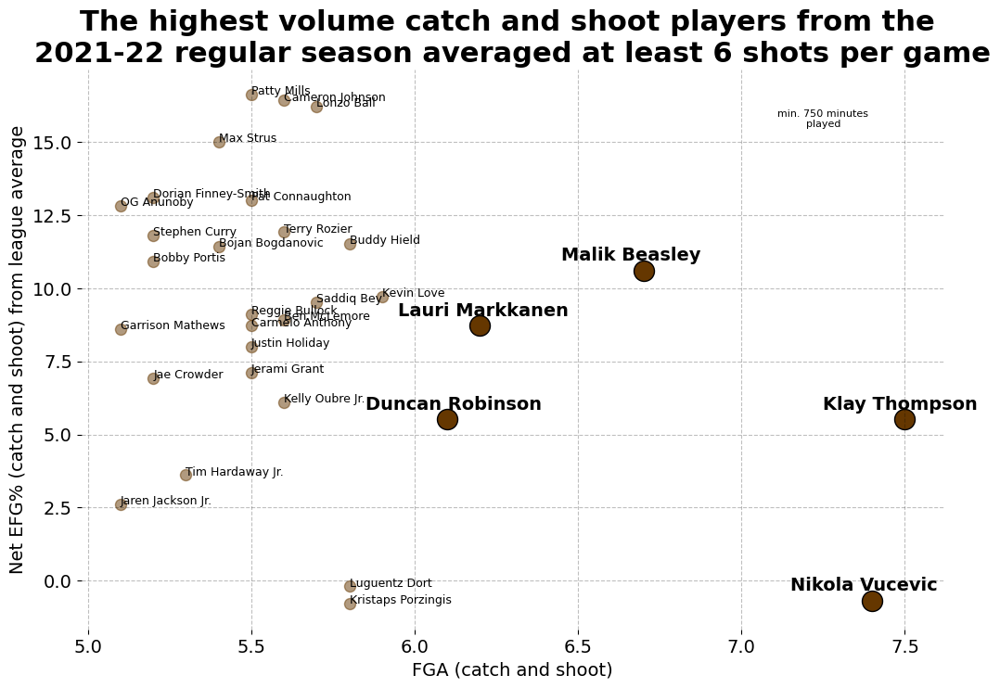

In [586]:
# create graph 90th percentile for FGA Catch and Shoot for 2021-22
df1 = catch21[(catch21['FGA (C & S)'] >= 5.1) & (catch21['FGA (C & S)'] < 6)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']]

df2 = catch21[catch21['FGA (C & S)'] >= 6][['FGA (C & S)', 'Net EFG% (C & S) from League Average']]

CreateScatter(df1, figsize=(12,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14,
              xticksize=14, ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14,
            title = 
'''The highest volume catch and shoot players from the 
2021-22 regular season averaged at least 6 shots per game''', titlefontsize=22, marker='o',
            s1=75, alpha1=.5, scattercolor='xkcd:brown',
            df2=df2, s2=250  
             )

for i in range(len(df2.index)):
    plt.text(
    df2.iloc[i, 0]-.25,
    df2.iloc[i, 1] + .35,
    list(df2.index)[i],
    fontsize=14, color='black', weight='bold')

plt.text(7.25, 15.5, '''min. 750 minutes
played''', ha='center', fontsize=8)

#plt.savefig('Highest volume catch and shoot players from 2021-22.pdf',bbox_inches='tight')

plt.show()

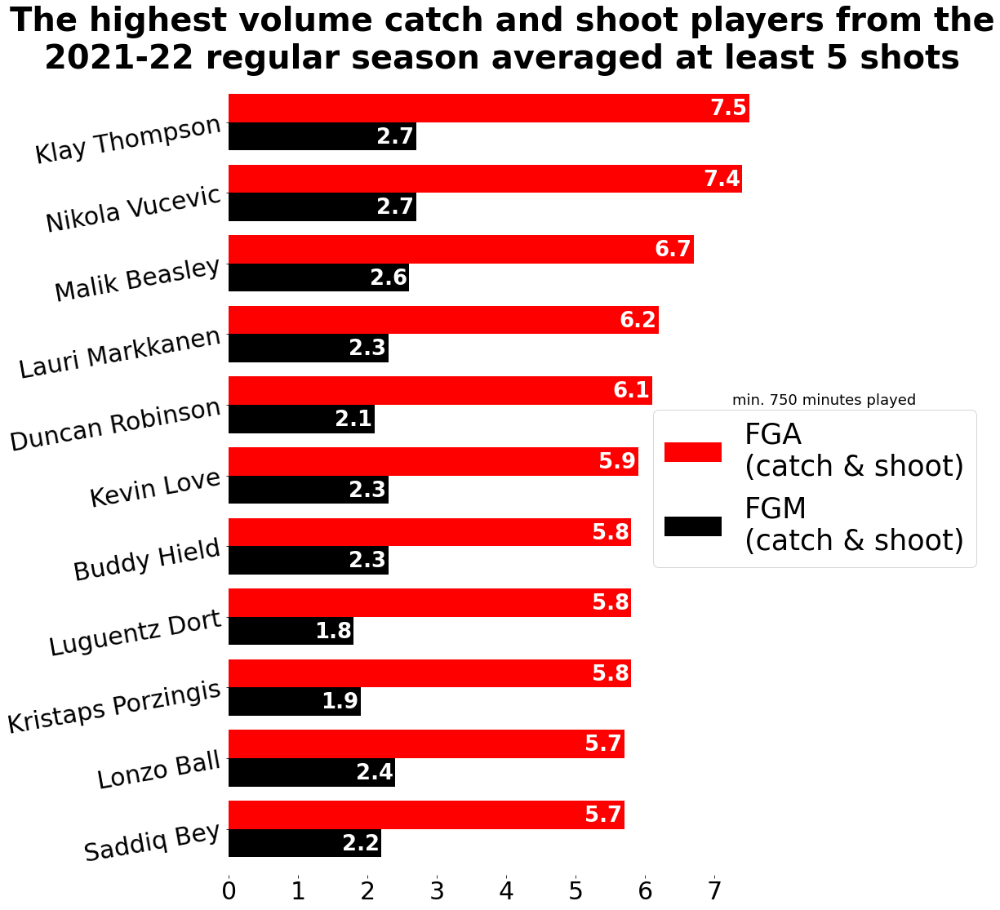

In [127]:
df = catch21[catch21['FGA (C & S)'] >= 5.7][['FGM (C & S)', 'FGA (C & S)']].sort_values('FGA (C & S)', ascending=False)

CreateBarH(df, figsize=(12,18), title=
'''The highest volume catch and shoot players from the
2021-22 regular season averaged at least 5 shots''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10,
          upperbarshiftup=.1, lowerbarshiftdown=.3, shiftupperbarleft=.3, shiftlowerbarleft=.3,
          textbarfontsize=26, textbarcolor='white', legend_labels= ['''FGM
(catch & shoot)''', '''FGA
(catch & shoot)'''], legend_order=[1,0], legend_pos=[.75, .6], legend_size=35, width=.8, color=['black', 'red'])

plt.text(7.25, 6, 'min. 750 minutes played', fontsize=18, color='black')

#plt.savefig('Highest volume catch and shoot players from 2021-22.pdf',bbox_inches='tight')
plt.show()

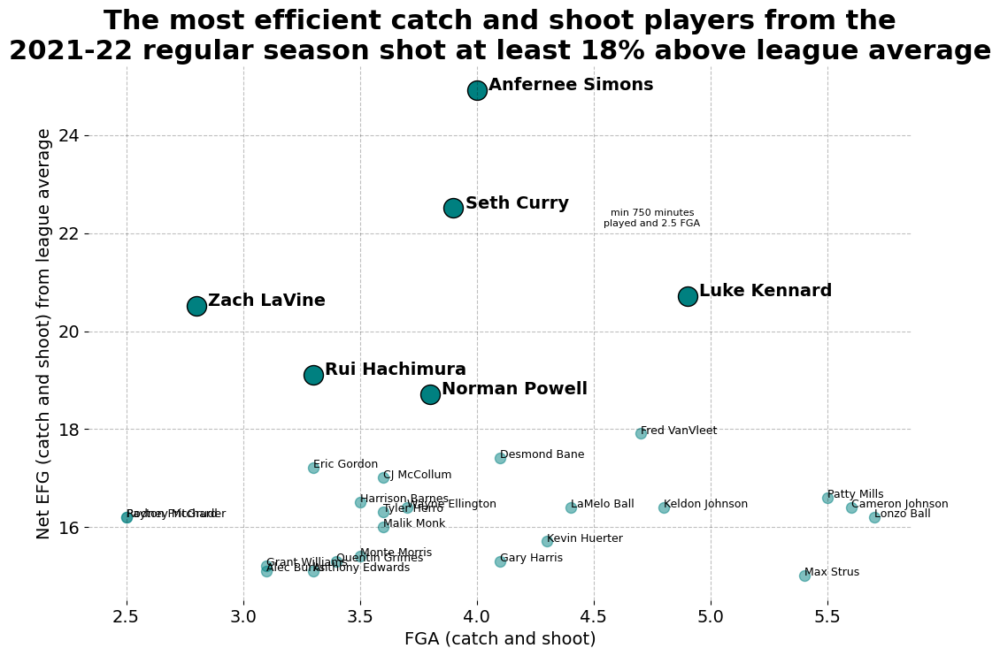

In [588]:
df1 = catch21[(catch21['Net EFG% (C & S) from League Average'] >= 15) & (catch21['Net EFG% (C & S) from League Average'] < 18) & (catch21['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']]
df2 = catch21[(catch21['Net EFG% (C & S) from League Average'] >= 18) & (catch21['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']]
CreateScatter(df1, s1=75, alpha1=.5, figsize=(12,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14,
             xticksize=14, ylabelsize=14, ylabel='Net EFG (catch and shoot) from league average', yticksize=14,
            title = 
'''The most efficient catch and shoot players from the
2021-22 regular season shot at least 18% above league average''', titlefontsize=22, marker='o', scattercolor='teal',
             df2=df2, s2=250)

for i in range(len(df2.index)):
    plt.text(
    df2.iloc[i,0]+.05,
    df2.iloc[i,1],
    list(df2.index)[i],
    fontsize=14, weight='bold'
    
    )
plt.text(4.75, 22.15, '''min 750 minutes
played and 2.5 FGA''', horizontalalignment='center', fontsize=8)

#plt.savefig('Most efficient catch-and-shoot shooters from 2021-22 NBA regular season.pdf',bbox_inches='tight')

plt.show()

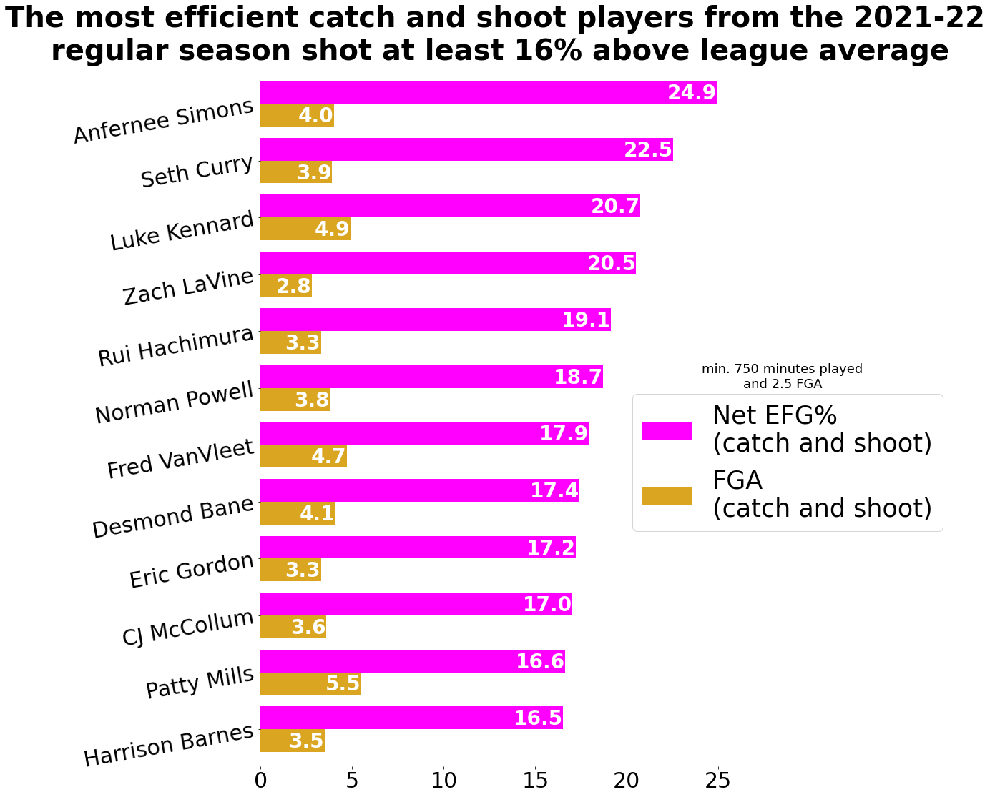

In [150]:
# most efficient shooters 2021-22 bar chart
df = catch21[(catch21['Net EFG% (C & S) from League Average'] >= 15) & (catch21['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']].sort_values('Net EFG% (C & S) from League Average', ascending=False).head(12)

CreateBarH(df, figsize=(12,18), title=
'''The most efficient catch and shoot players from the 2021-22 
regular season shot at least 16% above league average''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10,
          upperbarshiftup=.075, lowerbarshiftdown=.325, shiftupperbarleft=1.35, shiftlowerbarleft=1, textbarfontsize=28,
          textbarcolor='white', legend_labels=
            ['''FGA
(catch and shoot)''', '''Net EFG% 
(catch and shoot)'''], legend_order=[1,0], legend_pos=[.75,.55], legend_size=35, width=.8
           , color=['goldenrod', 'fuchsia'])

plt.text(28.5, 6, '''min. 750 minutes played
and 2.5 FGA''', fontsize=18, color='black', horizontalalignment='center')

#plt.savefig('Most efficient catch and shoot players from 2021-22.pdf',bbox_inches='tight')
plt.show()

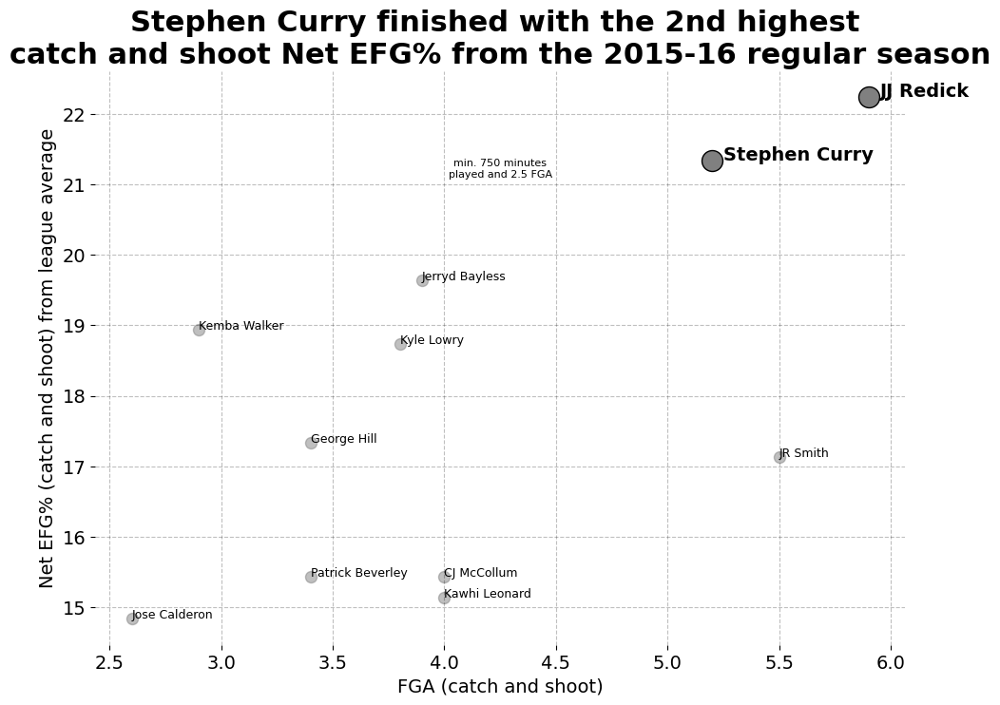

In [590]:
df1 = catch15[(catch15['Net EFG% (C & S) from League Average'] >= 14) & (catch15['Net EFG% (C & S) from League Average'] < 21) & (catch15['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']]

df2 = catch15[(catch15['Net EFG% (C & S) from League Average'] >= 21) & (catch15['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']]

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14, 
              xticksize=14, ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14,
              title = '''Stephen Curry finished with the 2nd highest 
catch and shoot Net EFG% from the 2015-16 regular season''', titlefontsize=22, marker='o', scattercolor='grey',
              df2=df2, s2=250
          
             
             )

for i in range(len(df2.index)):
    plt.text(
    df2.iloc[i,0]+.05,
    df2.iloc[i,1],
    list(df2.index)[i],
    fontsize=14, weight='bold'
    
    )

plt.text(4.25, 21.1, '''min. 750 minutes
played and 2.5 FGA''', horizontalalignment='center', fontsize=8)

#plt.savefig('Stephen Curry finished with the 2nd highest catch and shoot Net EFG% from 2015-16 regular season.pdf',bbox_inches='tight')
plt.show()

In [323]:
df1

,FGA (C & S),Net EFG% (C & S) from League Average
PLAYER,,
Nikola Vucevic '21,9.7,6.418939
Klay Thompson '17,9.4,14.929175
Klay Thompson '16,8.6,13.738661
Klay Thompson '18,8.5,15.714341
Klay Thompson '19,8.3,9.416211
Dirk Nowitzki '16,8.0,5.138661
Kristaps Porzingis '18,7.9,8.614341
Ryan Anderson '14,7.8,15.293319
Dirk Nowitzki '15,7.7,6.419624


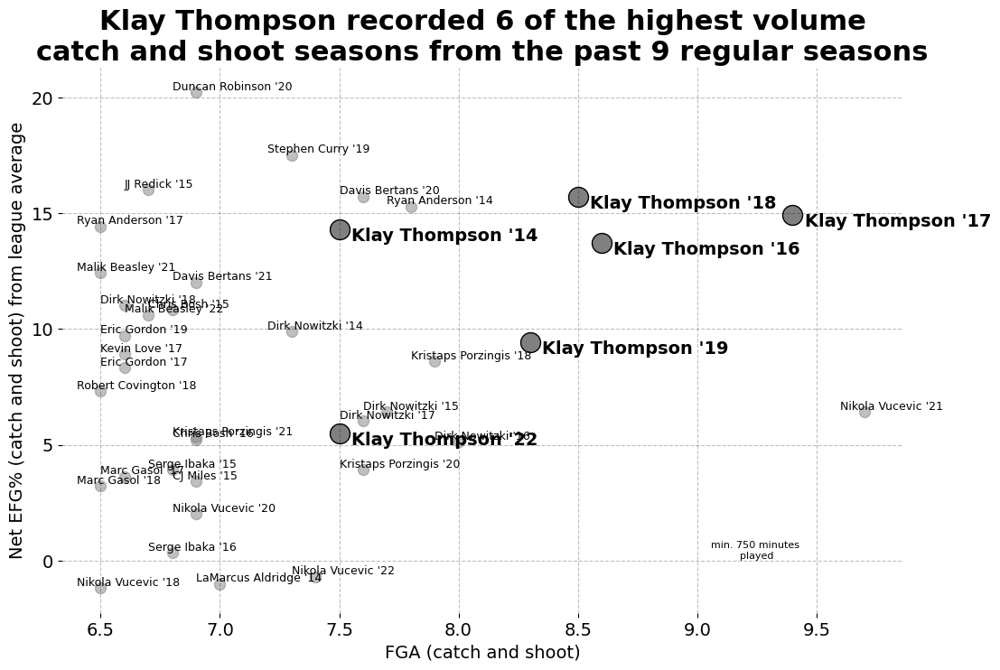

In [592]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['FGA (C & S)'] >= 6.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_catch = [lst[i] for i in range(len(lst))]
new_catch

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('FGA (C & S)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (list(df1.index)[i].startswith('Klay'))]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (list(df1.index)[i].startswith('Klay'))]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (list(df1.index)[i].startswith('Klay'))]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (catch and shoot)': fgas, 'Net EFG% (catch and shoot) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1=df1, s1=75, alpha1=.5, figsize=(12,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14,
             xticksize=14, ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14,
             title= '''Klay Thompson recorded 6 of the highest volume
catch and shoot seasons from the past 9 regular seasons''', titlefontsize=22, marker='o', scattercolor='grey'
             ,df2=df2, s2=250, y1=.1, x1=-.1)

for i in range(len(df2.index)):
    plt.text(df2.iloc[i,0]+.05, df2.iloc[i,1]-.5, list(df2.index)[i], fontsize=14, weight='bold')
plt.text(9.25, 0.1, '''min. 750 minutes 
played''', horizontalalignment='center', fontsize=8)
    
#plt.savefig('Highest volume catch and shoot seasons from the past 9 regular seasons.pdf',bbox_inches='tight')
plt.show()

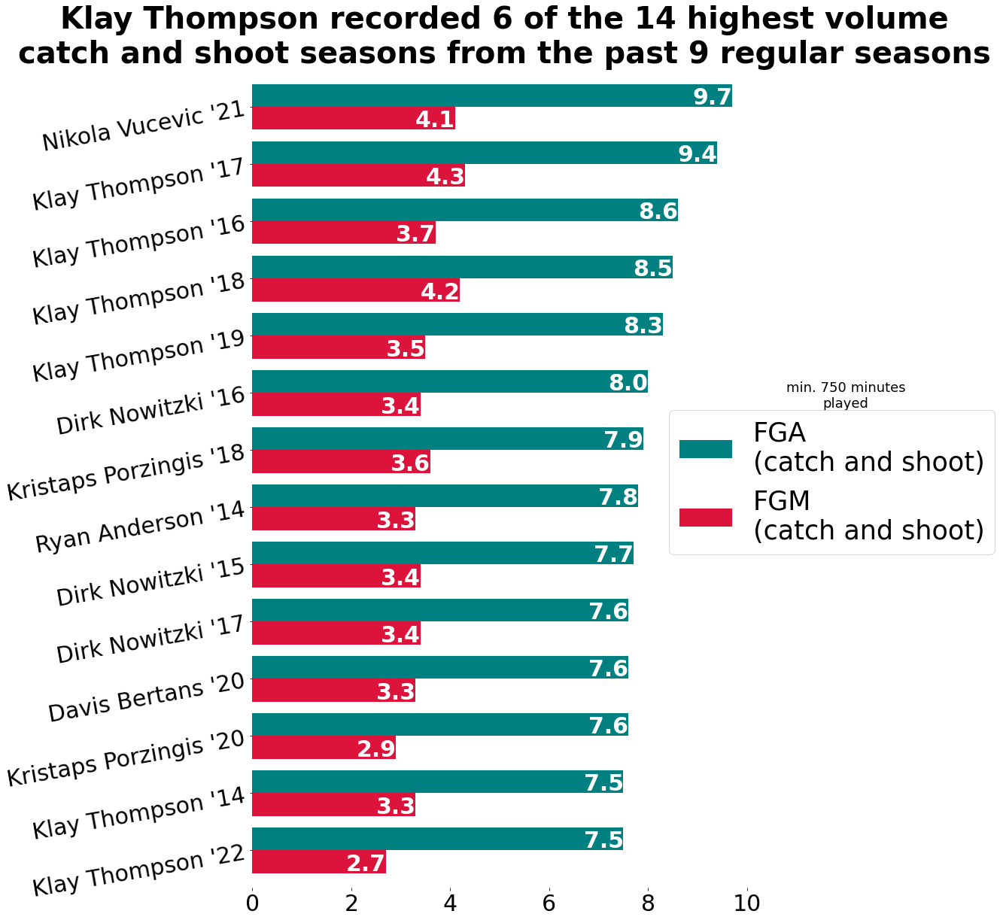

In [334]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['FGA (C & S)'] >= 6.5)][['FGM (C & S)', 'FGA (C & S)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_catch = [lst[i] for i in range(len(lst))]
new_catch

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('FGA (C & S)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1[(df1['FGA (C & S)']>=7.5)]

CreateBarH(df1, figsize=(12,20), title='''Klay Thompson recorded 6 of the 14 highest volume
catch and shoot seasons from the past 9 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30,
          ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.4, shiftlowerbarleft=.4,
          textbarfontsize=30, textbarcolor='white', legend_labels=['''FGM
(catch and shoot)''', '''FGA
(catch and shoot)'''], legend_order=[1,0], legend_pos=[.8,.6], legend_size=35, width=.8,
          color=['crimson', 'teal'])

plt.text(12, 7.75, '''min. 750 minutes
played''', fontsize=18, horizontalalignment='center')

#plt.savefig('bar highest volume catch-and-shoot shooters from the past 9 regular seasons.pdf',bbox_inches='tight')
plt.show()

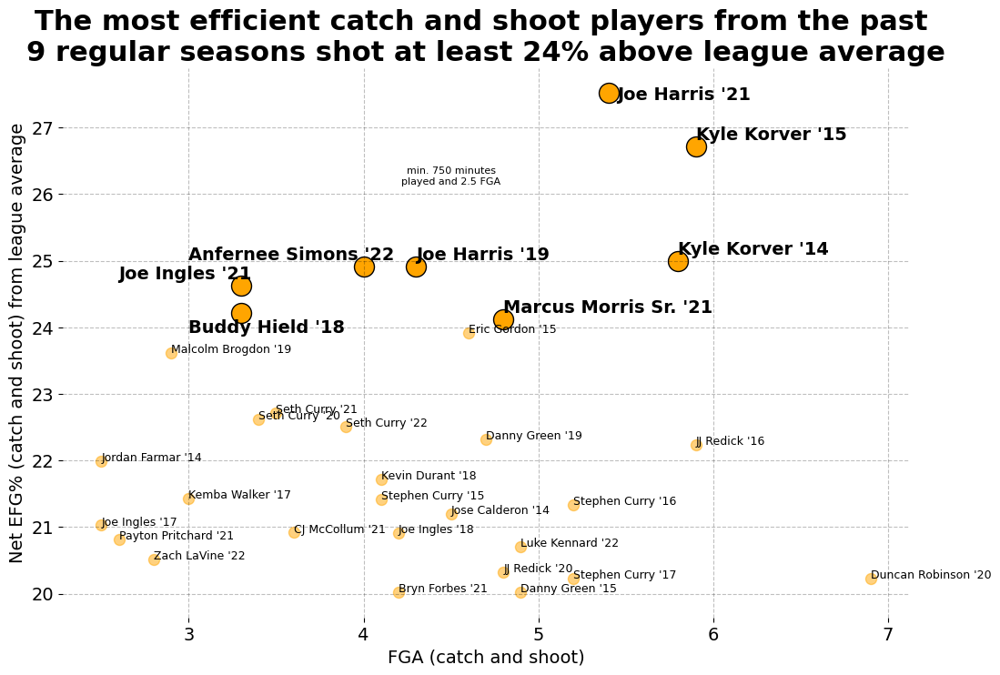

In [594]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['Net EFG% (C & S) from League Average'] >= 20) & (df['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_catch = [lst[i] for i in range(len(lst))]
new_catch

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('Net EFG% (C & S) from League Average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1]>=24)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1]>=24)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1]>=24)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (catch and shoot)': fgas, 'Net EFG% (catch and shoot) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(12,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14,df2=df2,
             xticksize=14, ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14,s2=250,
title='''The most efficient catch and shoot players from the past 
9 regular seasons shot at least 24% above league average''', titlefontsize=22, marker='o', scattercolor='orange'
)
plt.text(5.4+.05, 27.5189393939394-.1, 'Joe Harris \'21', fontsize=14, weight='bold')
plt.text(3.3-.7, 24.6189393939394+.1, 'Joe Ingles \'21', fontsize=14, weight='bold')
plt.text(4.8, 24.1189393939394+.1, 'Marcus Morris Sr. \'21', fontsize=14, weight='bold')
plt.text(5.9, 26.719624217119+.1, 'Kyle Korver \'15', fontsize=14, weight='bold')
plt.text(3.3-.3, 24.2143410852714-.3, 'Buddy Hield \'18', fontsize=14, weight='bold')
plt.text(4-1, 24.9108963093147+.1, 'Anfernee Simons \'22', fontsize=14, weight='bold')
plt.text(4.3, 24.9162109375+.1, 'Joe Harris \'19', fontsize=14, weight='bold')
plt.text(5.8, 24.9933189655172+.1, 'Kyle Korver \'14', fontsize=14, weight='bold')
plt.text(4.5, 26.15, '''min. 750 minutes
played and 2.5 FGA''', fontsize=8, horizontalalignment='center')
#plt.savefig('Most efficient catch-and-shoot shooters from past 9 regular seasons.pdf',bbox_inches='tight')
plt.show()

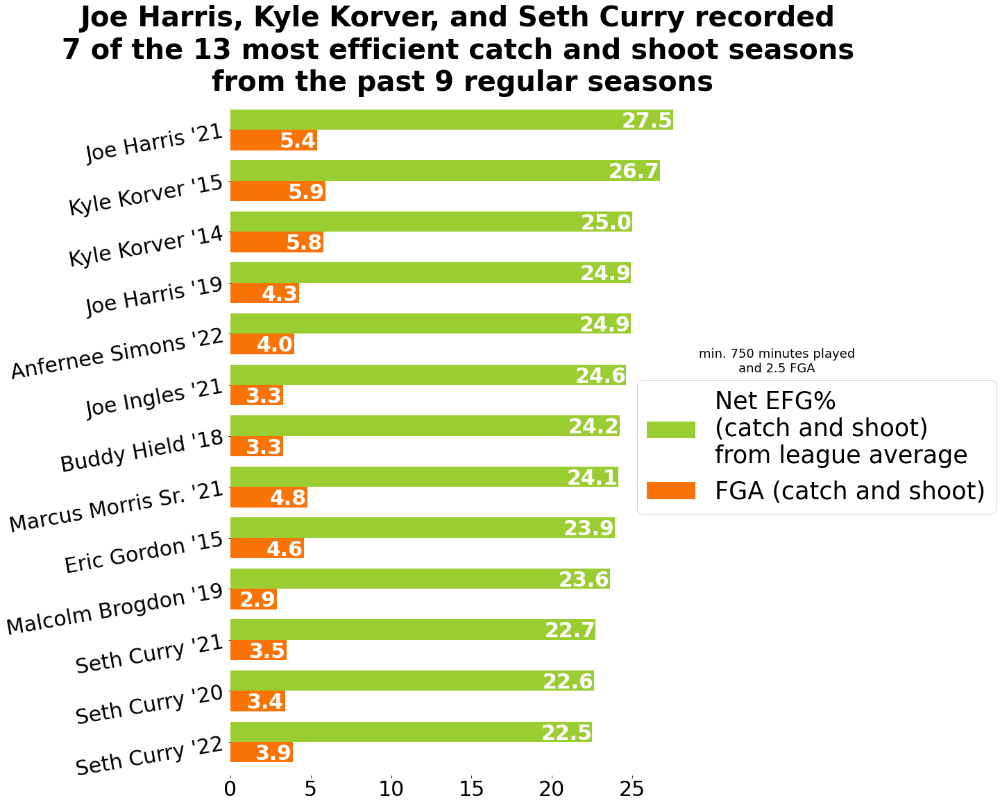

In [340]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['Net EFG% (C & S) from League Average'] >= 20) & (df['FGA (C & S)'] >= 2.5)][['FGA (C & S)', 'Net EFG% (C & S) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_catch = [lst[i] for i in range(len(lst))]
new_catch

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('Net EFG% (C & S) from League Average', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1[df1['Net EFG% (C & S) from League Average']>=22.5]

CreateBarH(df1, figsize=(12,18), title='''Joe Harris, Kyle Korver, and Seth Curry recorded 
7 of the 13 most efficient catch and shoot seasons 
from the past 9 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, upperbarshiftup=.05,
          lowerbarshiftdown=.35, shiftupperbarleft=1.6, shiftlowerbarleft=1.2, textbarfontsize=30, textbarcolor='white',
          legend_labels=['''FGA (catch and shoot)''', '''Net EFG%
(catch and shoot)
from league average'''], legend_order=[1,0], legend_pos=[.85, .6], legend_size=35, width=.8, 
           color=['xkcd:orange', 'yellowgreen'])

plt.text(34, 7.25, '''min. 750 minutes played
and 2.5 FGA''', fontsize=18, color='black', horizontalalignment='center')

#plt.savefig('Most efficient catch and shoot players from past 9 regular seasons.pdf',bbox_inches='tight')
plt.show()

In [309]:
# call pull up data
pullups21 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2021-22')
pullups21.set_index('PLAYER', inplace=True)
pullups20 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2020-21')
pullups20.set_index('PLAYER', inplace=True)
pullups19 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2019-20')
pullups19.set_index('PLAYER', inplace=True)
pullups18 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2018-19')
pullups18.set_index('PLAYER', inplace=True)
pullups17 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2017-18')
pullups17.set_index('PLAYER', inplace=True)
pullups16 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2016-17')
pullups16.set_index('PLAYER', inplace=True)
pullups15 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2015-16')
pullups15.set_index('PLAYER', inplace=True)
pullups14 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2014-15')
pullups14.set_index('PLAYER', inplace=True)
pullups13 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Pull Ups 2013-14')
pullups13.set_index('PLAYER', inplace=True)

In [310]:
allPULLS = [pullups21, pullups20, pullups19, pullups18, pullups17, pullups16, pullups15, pullups14,
           pullups13]

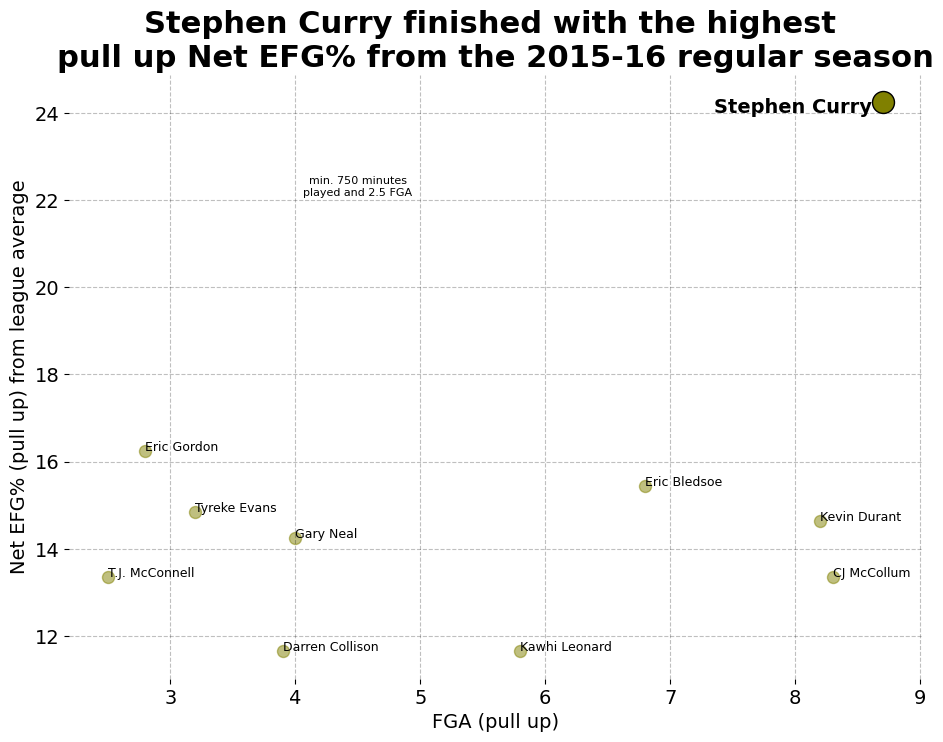

In [596]:
df1 = pullups15[(pullups15['Net EFG% (Pull Up) from League Average'] >= 11) & (pullups15['FGA (Pull Up)'] >= 2.5)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1]>=24)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1]>=24)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1]>=24)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (pull up)': fgas, 'Net EFG% (pull up) from league average':nets
})

df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
             ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
             '''Stephen Curry finished with the highest 
pull up Net EFG% from the 2015-16 regular season''', titlefontsize=22, marker='o', scattercolor='olive', df2=df2, s2=250)

plt.text(8.7-1.35, 24.248678-.25, 'Stephen Curry', fontsize=14, weight='bold')
plt.text(4.5, 22.1, '''min. 750 minutes
played and 2.5 FGA''', fontsize=8, horizontalalignment='center')

#plt.savefig('Stephen Curry finished with the highest pull up Net EFG% from 2015-16 regular season.pdf', bbox_inches='tight')
plt.show()

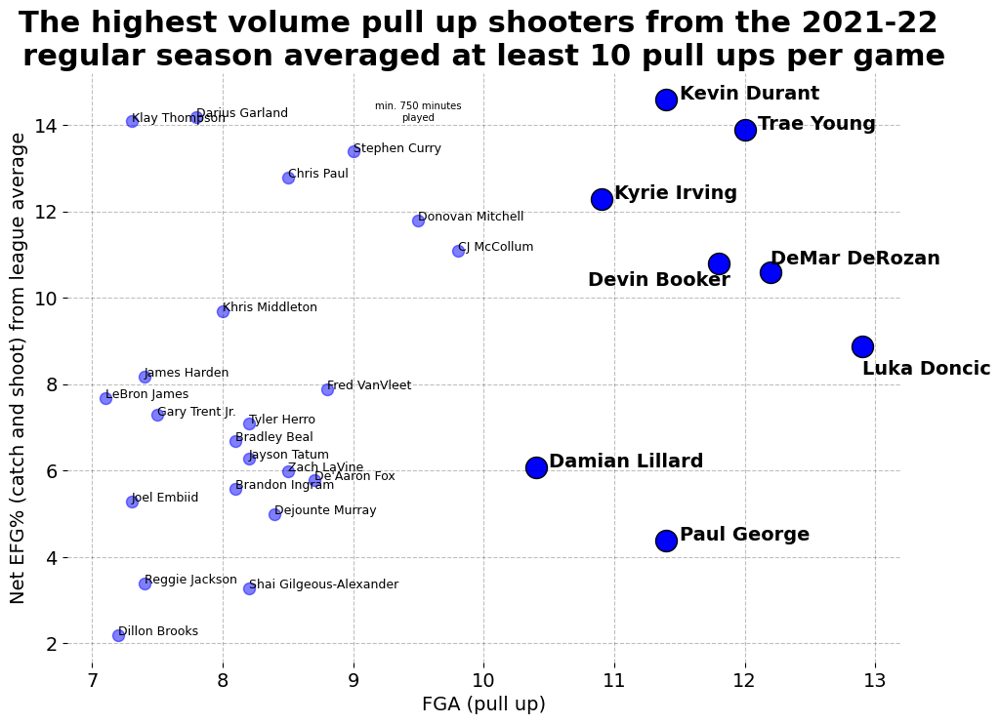

In [598]:
df1 = pullups21[pullups21['FGA (Pull Up)'] >= 7.1][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']].sort_values('FGA (Pull Up)', ascending=False)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0]>=10)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0]>=10)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0]>=10)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (pull up)': fgas, 'Net EFG% (pull up) from league average':nets
})

df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
             ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14, title = 
             '''The highest volume pull up shooters from the 2021-22 
regular season averaged at least 10 pull ups per game''', titlefontsize=22, marker='o', scattercolor='blue', df2=df2,
             s2=250)

plt.text(12.9, 8.8850180505416-.65, 'Luka Doncic', fontsize=14, weight='bold')
plt.text(12.2, 10.5850180505416+.2, 'DeMar DeRozan', fontsize=14, weight='bold')
plt.text(12.0+.1, 13.8850180505416, 'Trae Young', fontsize=14, weight='bold')
plt.text(11.8-1, 10.7850180505416-.5, 'Devin Booker', fontsize=14, weight='bold')
plt.text(11.4+.1, 14.5850180505416, 'Kevin Durant', fontsize=14, weight='bold')
plt.text(11.4+.1, 4.3850180505416, 'Paul George', fontsize=14, weight='bold')
plt.text(10.9+.1, 12.2850180505416, 'Kyrie Irving', fontsize=14, weight='bold')
plt.text(10.4+.1, 6.08501805054161, 'Damian Lillard', fontsize=14, weight='bold')
plt.text(9.5, 14.1, '''min. 750 minutes
played''', fontsize=7.25, horizontalalignment='center')

#plt.savefig('Highest volume pull-up shooters from 2021-22 regular season.pdf', bbox_inches='tight')
plt.show()

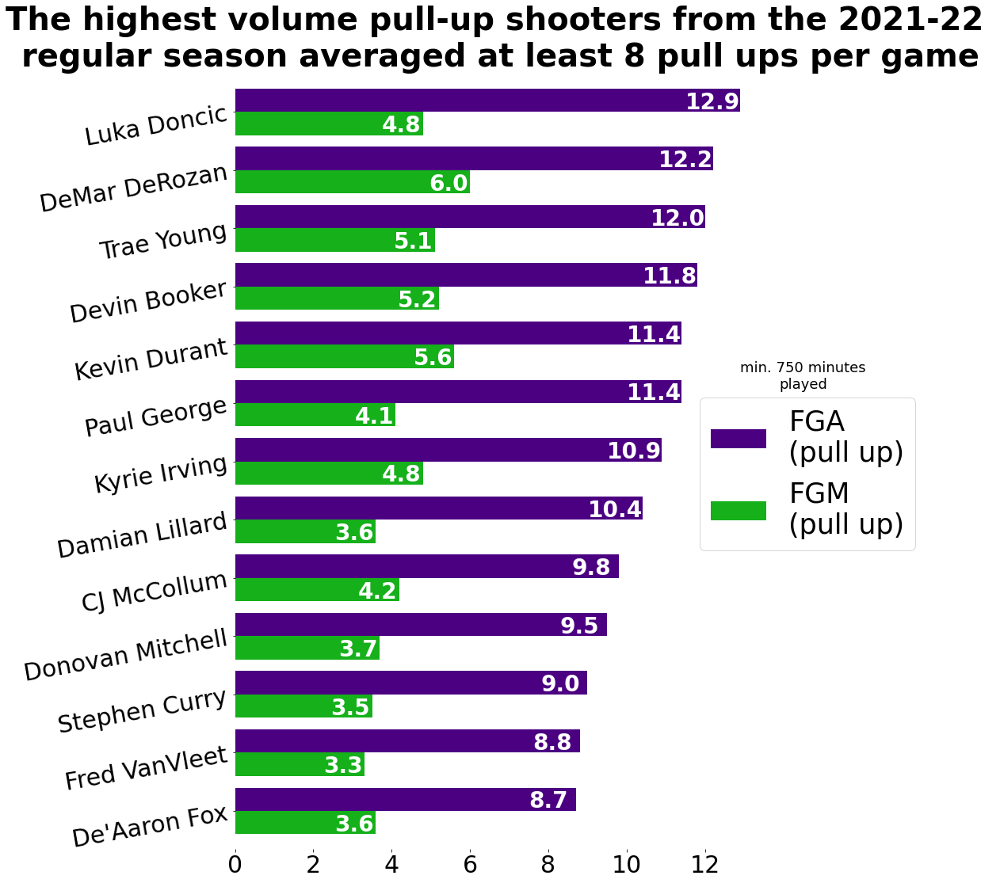

In [9]:
df1 = pullups21[pullups21['FGA (Pull Up)'] >= 7.1][['FGM (Pull Up)', 'FGA (Pull Up)']].sort_values('FGA (Pull Up)', ascending=False).head(13)
df1

CreateBarH(df1, figsize=(12,18), title = '''The highest volume pull-up shooters from the 2021-22 
regular season averaged at least 8 pull ups per game''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10,
          upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.7, shiftlowerbarleft=.55, textbarfontsize=28,
          textbarcolor='white', legend_labels=['''FGM
(pull up)''', '''FGA
(pull up)'''], legend_order=[1,0], legend_pos=[.85,.6], legend_size=35, width=.8, color=['xkcd:green', 'indigo'])

plt.text(14.5, 7.25, '''min. 750 minutes
played''', fontsize=18, horizontalalignment='center')

#plt.savefig('Highest volume pull up shooters from 2021-22.pdf', bbox_inches='tight')
plt.show()

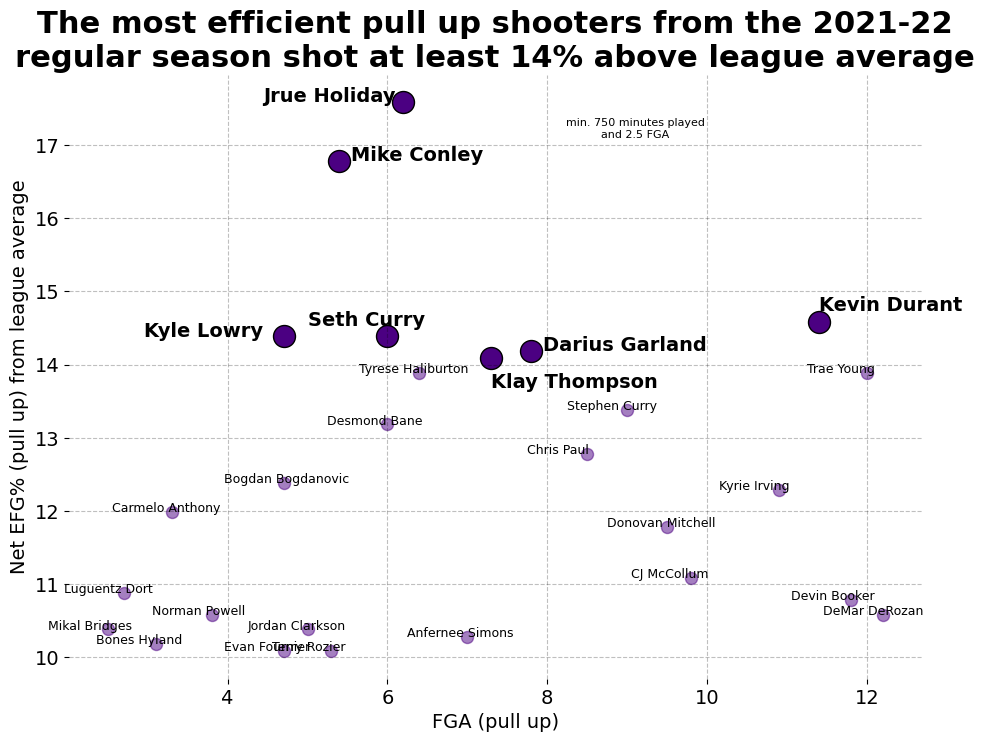

In [599]:
df1 = pullups21[(pullups21['Net EFG% (Pull Up) from League Average'] >= 10) & (pullups21['FGA (Pull Up)'] >= 2.5)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1]>=14)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1]>=14)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1]>=14)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (pull up)': fgas, 'Net EFG% (pull up) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
             ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''The most efficient pull up shooters from the 2021-22
regular season shot at least 14% above league average''', titlefontsize=22, marker='o', scattercolor='indigo', df2=df2,
             s2=250, x1=-.75)


plt.text(6.2-1.75, 17.5850180505416, 'Jrue Holiday', fontsize=14, weight='bold')
plt.text(5.4+.15, 16.7850180505416, 'Mike Conley', fontsize=14, weight='bold')
plt.text(11.4, 14.5850180505416+.15, 'Kevin Durant', fontsize=14, weight='bold')
plt.text(6.0-1, 14.3850180505416+.15, 'Seth Curry', fontsize=14, weight='bold')
plt.text(4.7-1.75, 14.3850180505416, 'Kyle Lowry', fontsize=14, weight='bold')
plt.text(7.8+.15, 14.1850180505416, 'Darius Garland', fontsize=14, weight='bold')
plt.text(7.3, 14.0850180505416-.4, 'Klay Thompson', fontsize=14, weight='bold')

plt.text(9.10, 17.1, '''min. 750 minutes played
and 2.5 FGA''', fontsize=8, horizontalalignment='center')
#plt.savefig('Most efficient pull up shooters for 2021-22.pdf', bbox_inches='tight')
plt.show()

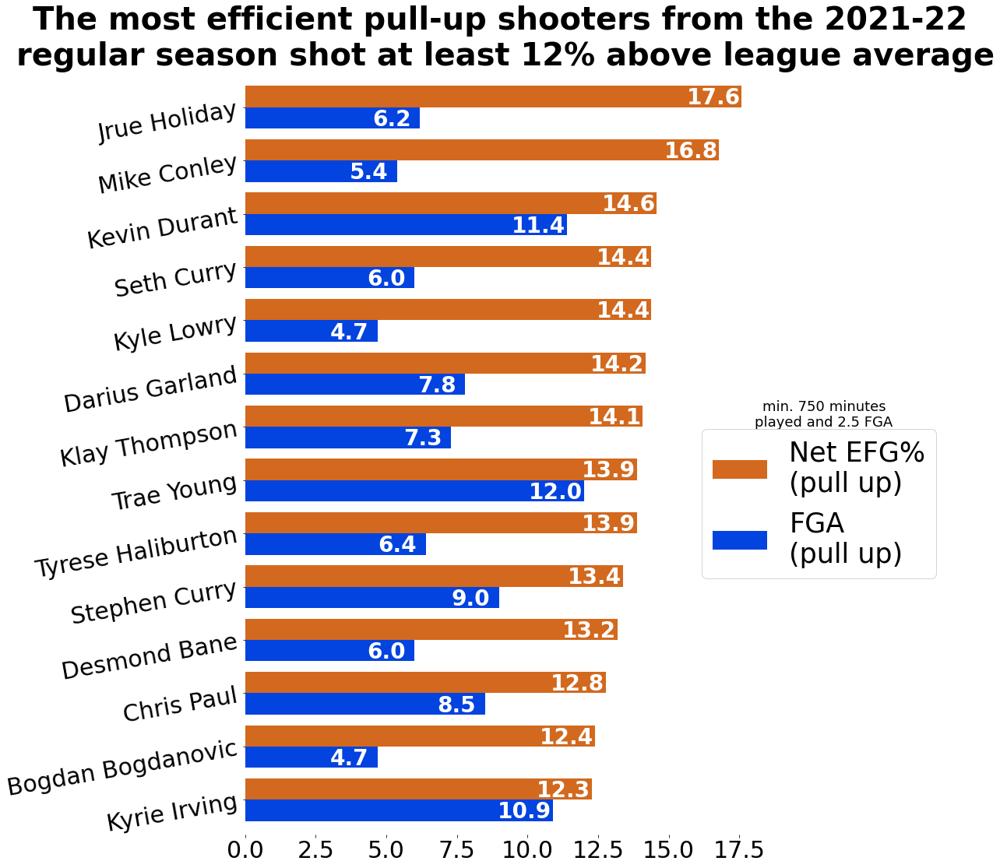

In [13]:
df1 = pullups21[(pullups21['Net EFG% (Pull Up) from League Average'] >= 12) & (pullups21['FGA (Pull Up)'] >= 2.5)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']]

CreateBarH(df1, figsize=(12,18), title='''The most efficient pull-up shooters from the 2021-22 
regular season shot at least 12% above league average''', titlefontsize=40, xticksize=30, yticksize=30,
          ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=1, shiftlowerbarleft=1,
          textbarfontsize=28, textbarcolor='white', legend_labels=['''FGA
(pull up)''', '''Net EFG%
(pull up)'''], legend_order=[1,0], legend_pos=[.85, .55], legend_size=35, width=.8, color=['xkcd:blue', 'chocolate'])

plt.text(20.5, 7, '''min. 750 minutes
played and 2.5 FGA''', fontsize=18, horizontalalignment='center')

#plt.savefig('Most efficient pull up shooters from 2021-22.pdf', bbox_inches='tight')
plt.show()

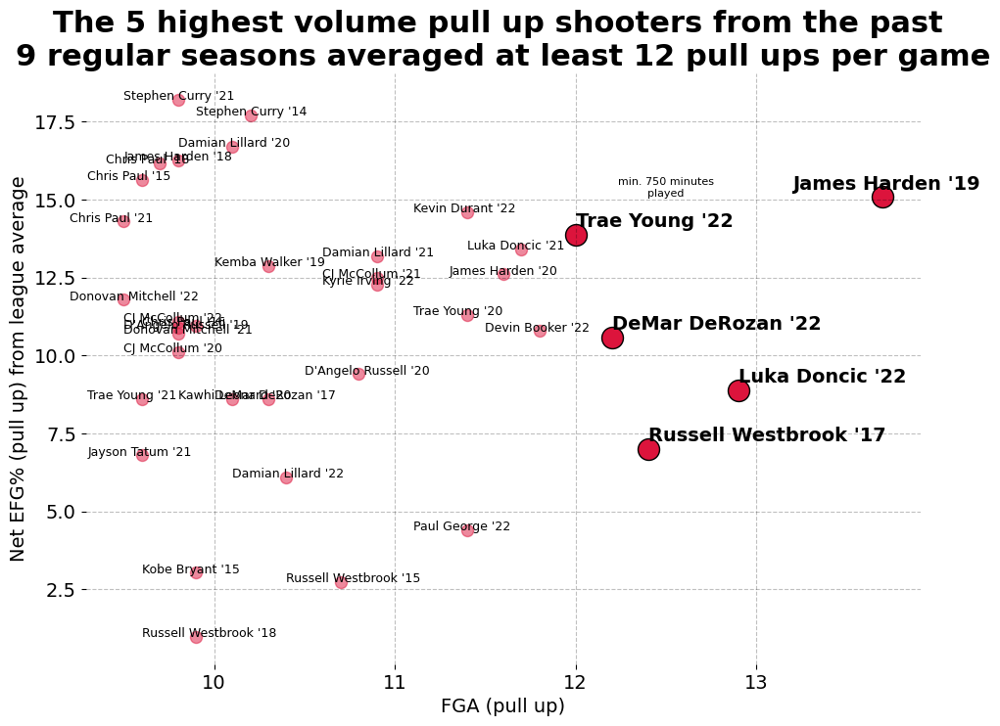

In [600]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['FGA (Pull Up)'] >= 9.5)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_pulls = [lst[i] for i in range(len(lst))]
new_pulls

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('FGA (Pull Up)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0]>=12)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0]>=12)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0]>=12)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (pull up)': fgas, 'Net EFG% (pull up) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
              ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''The 5 highest volume pull up shooters from the past 
9 regular seasons averaged at least 12 pull ups per game''', titlefontsize=22, marker='o', scattercolor='crimson', 
              df2=df2, s2=250, x1=-.3
             )

plt.text(13.7-.5, 15.079754601227+.25, "James Harden '19", fontsize=14, weight='bold')
plt.text(12.9, 8.8850180505416+.25, "Luka Doncic '22", fontsize=14, weight='bold')
plt.text(12.4, 7.0023758099352+.25, "Russell Westbrook '17", fontsize=14, weight='bold')
plt.text(12.2, 10.5850180505416+.25, "DeMar DeRozan '22", fontsize=14, weight='bold')
plt.text(12.0, 13.8850180505416+.25, "Trae Young '22", fontsize=14, weight='bold')
plt.text(12.5, 15.1, '''min. 750 minutes
played''', fontsize=8, horizontalalignment='center')
#plt.savefig('Highest volume pull-up shooters from past 9 regular seasons.pdf', bbox_inches='tight')
plt.show()

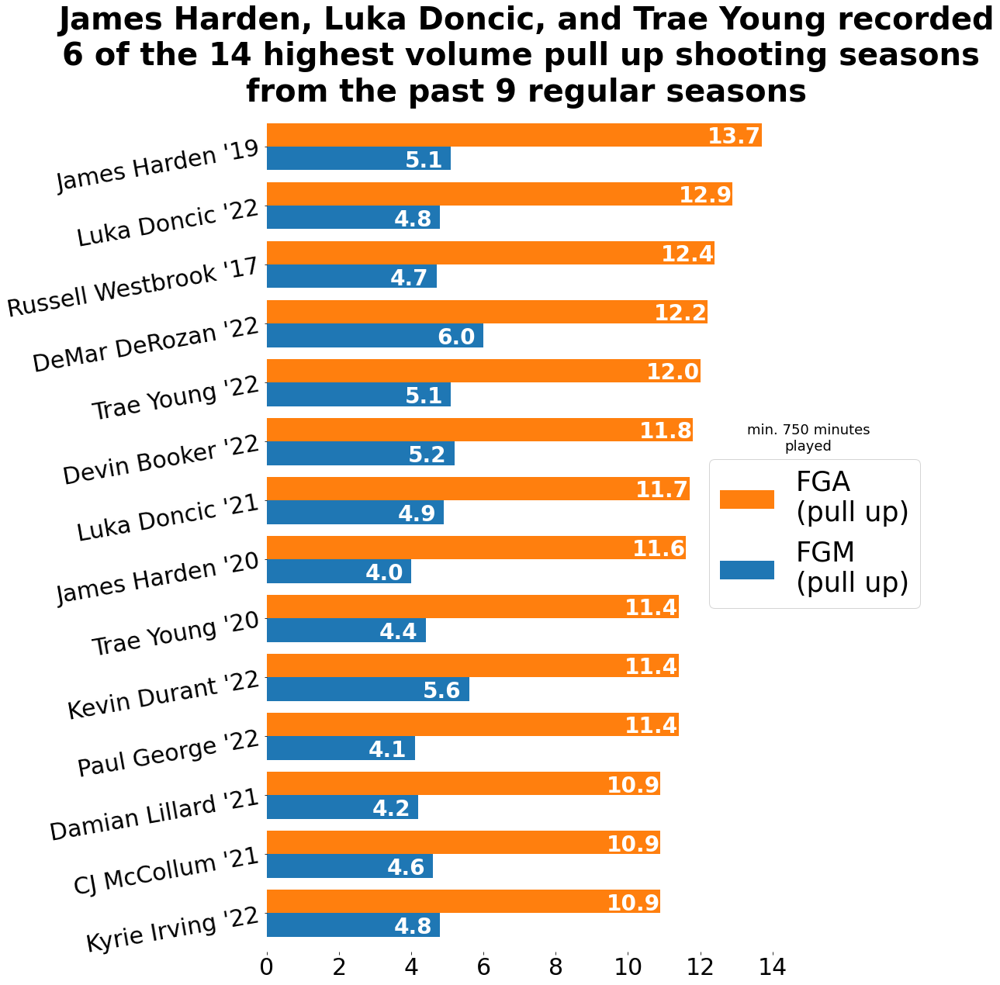

In [314]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['FGA (Pull Up)'] >= 9.5)][['FGM (Pull Up)', 'FGA (Pull Up)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_pulls = [lst[i] for i in range(len(lst))]
new_pulls

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('FGA (Pull Up)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(14)

CreateBarH(df1, figsize=(12,20), title = '''James Harden, Luka Doncic, and Trae Young recorded
6 of the 14 highest volume pull up shooting seasons 
from the past 9 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, upperbarshiftup=.05,
lowerbarshiftdown=.35, shiftupperbarleft=.75, shiftlowerbarleft=.75, textbarcolor='white', textbarfontsize=28,
legend_labels=['''FGM
(pull up)''', '''FGA
(pull up)'''], legend_order=[1,0], legend_pos=[.825,.6], legend_size=35, width=.8
           
          )

plt.text(15, 7.85, '''min. 750 minutes
played''', fontsize=18, horizontalalignment='center')

#plt.savefig('Highest volume pull up shooters from the past 9 regular seasons.pdf', bbox_inches='tight')
plt.show()

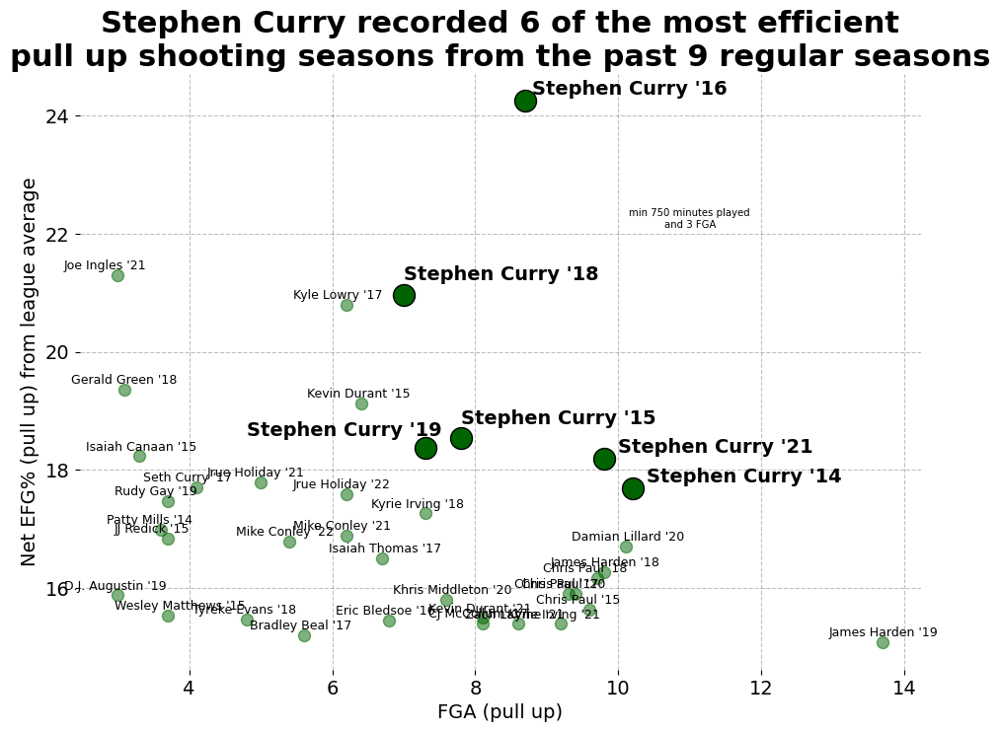

In [601]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['Net EFG% (Pull Up) from League Average'] >= 15) & (df['FGA (Pull Up)'] >= 3)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_pulls = [lst[i] for i in range(len(lst))]
new_pulls

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('Net EFG% (Pull Up) from League Average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (list(df1.index)[i]).startswith('Stephen')]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (list(df1.index)[i]).startswith('Stephen')]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (list(df1.index)[i]).startswith('Stephen')]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (pull up)': fgas, 'Net EFG% (pull up) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
             ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''Stephen Curry recorded 6 of the most efficient
pull up shooting seasons from the past 9 regular seasons''', titlefontsize=22, marker='o',
             scattercolor='darkgreen', df2=df2, s2=250, x1=-.75,y1=.1)

plt.text(9.8+.2, 18.1952941176471+.1, 'Stephen Curry \'21', fontsize=14, weight='bold')
plt.text(7.3-2.5, 18.379754601227+.2, 'Stephen Curry \'19', fontsize=14, weight='bold')
plt.text(7, 20.9652525252525+.25, 'Stephen Curry \'18', fontsize=14, weight='bold')
plt.text(8.7+.1, 24.2486784140969+.1, 'Stephen Curry \'16', fontsize=14, weight='bold')
plt.text(7.8, 18.533547008547+.25, 'Stephen Curry \'15', fontsize=14, weight='bold')
plt.text(10.2+.2, 17.6910112359551+.1, 'Stephen Curry \'14', fontsize=14, weight='bold')

plt.text(11, 22.1, '''min 750 minutes played
and 3 FGA''', fontsize=7.25, horizontalalignment='center')
#plt.savefig('Most efficient pull up shooters from last 9 NBA regular seasons.pdf', bbox_inches='tight')

plt.show()

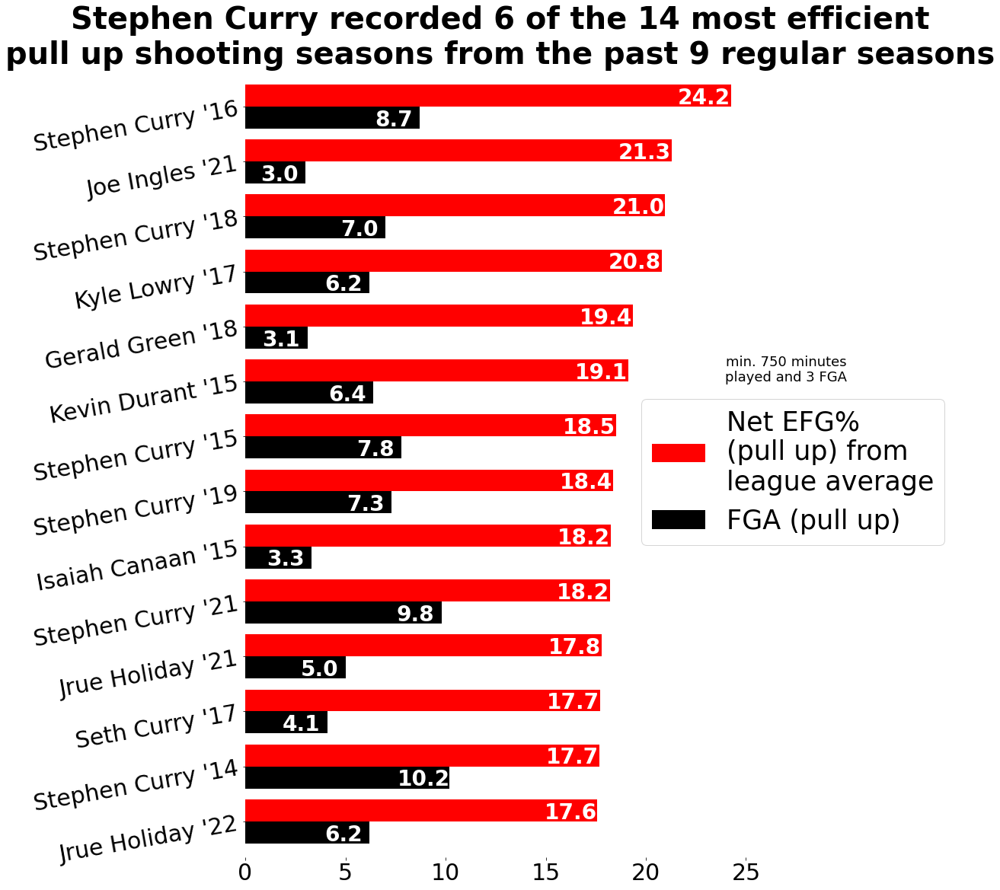

In [316]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['Net EFG% (Pull Up) from League Average'] >= 15) & (df['FGA (Pull Up)'] >= 3)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_pulls = [lst[i] for i in range(len(lst))]
new_pulls

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('Net EFG% (Pull Up) from League Average', ascending=False)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(14)

CreateBarH(df1, figsize=(12,19), title='''Stephen Curry recorded 6 of the 14 most efficient
pull up shooting seasons from the past 9 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30, 
           ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=1.35, shiftlowerbarleft=1.3, 
           textbarfontsize=28, textbarcolor='white', legend_labels=['''FGA (pull up)''', '''Net EFG%
(pull up) from
league average'''], legend_order=[1,0], legend_pos = [.75,.6], legend_size=35, width=.8, color=['black', 'red']
          
          )

plt.text(27, 8, '''min. 750 minutes
played and 3 FGA''', fontsize=18, horizontalalignment='center')

#plt.savefig('bar most efficient pull up shooters past 9 reg.pdf', bbox_inches='tight')

plt.show()

In [296]:
# call drives data
Drives21 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2021-22')
Drives21.set_index('PLAYER', inplace=True)
Drives20 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2020-21')
Drives20.set_index('PLAYER', inplace=True)
Drives19 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2019-20')
Drives19.set_index('PLAYER', inplace=True)
Drives18 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2018-19')
Drives18.set_index('PLAYER', inplace=True)
Drives17 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2017-18')
Drives17.set_index('PLAYER', inplace=True)
Drives16 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2016-17')
Drives16.set_index('PLAYER', inplace=True)
Drives15 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2015-16')
Drives15.set_index('PLAYER', inplace=True)
Drives14 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2014-15')
Drives14.set_index('PLAYER', inplace=True)
Drives13 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Drives 2013-14')
Drives13.set_index('PLAYER', inplace=True)

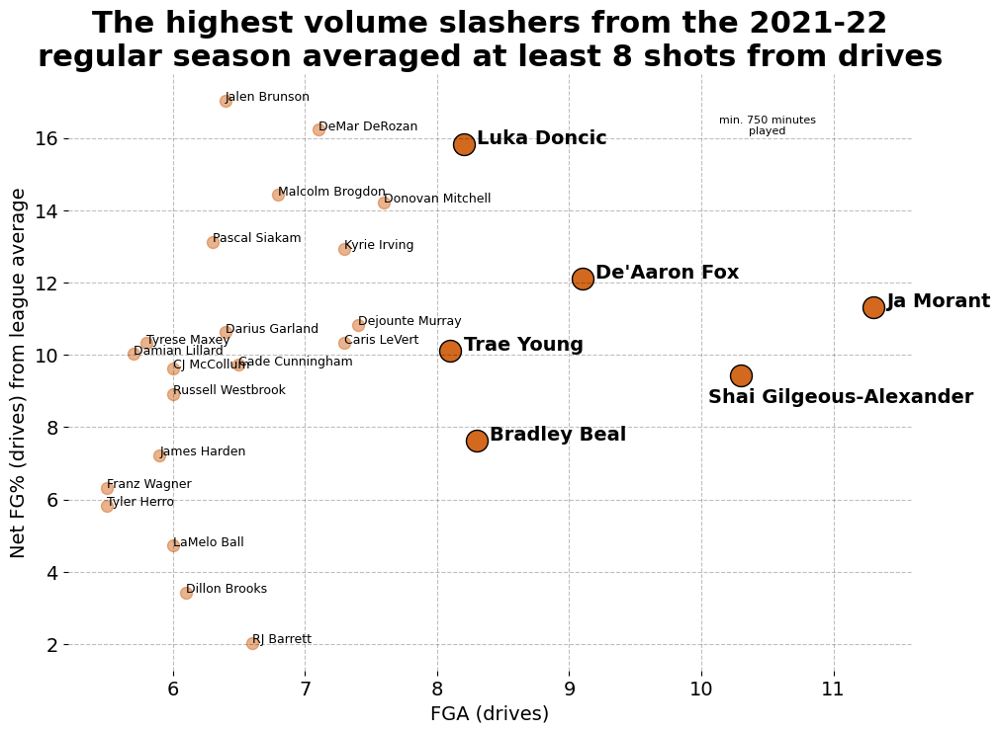

In [603]:
df1 = Drives21[Drives21['FGA (Drives)'] >= 5.5][['FGA (Drives)', 'Net FG% (Drives) from League Average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0]>=8)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0]>=8)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0]>=8)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
             ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The highest volume slashers from the 2021-22
regular season averaged at least 8 shots from drives''', titlefontsize=22, marker='o', scattercolor='chocolate',
             df2=df2, s2=250)

plt.text(8.2+.1, 15.823305785124, 'Luka Doncic', fontsize=14, weight='bold')
plt.text(9.1+.1, 12.123305785124, "De'Aaron Fox", fontsize=14, weight='bold')
plt.text(11.3+.1, 11.323305785124, 'Ja Morant', fontsize=14, weight='bold')
plt.text(8.1+.1, 10.123305785124, 'Trae Young', fontsize=14, weight='bold')
plt.text(10.3-.25, 9.423305785124-.75, 'Shai Gilgeous-Alexander', fontsize=14, weight='bold')
plt.text(8.3+.1, 7.623305785124, 'Bradley Beal', fontsize=14, weight='bold')
plt.text(10.5, 16.1, '''min. 750 minutes
played''', ha='center', fontsize=8)

#plt.savefig('Highest volume slashers from 2021-22 regular season.pdf', bbox_inches='tight')
plt.show()

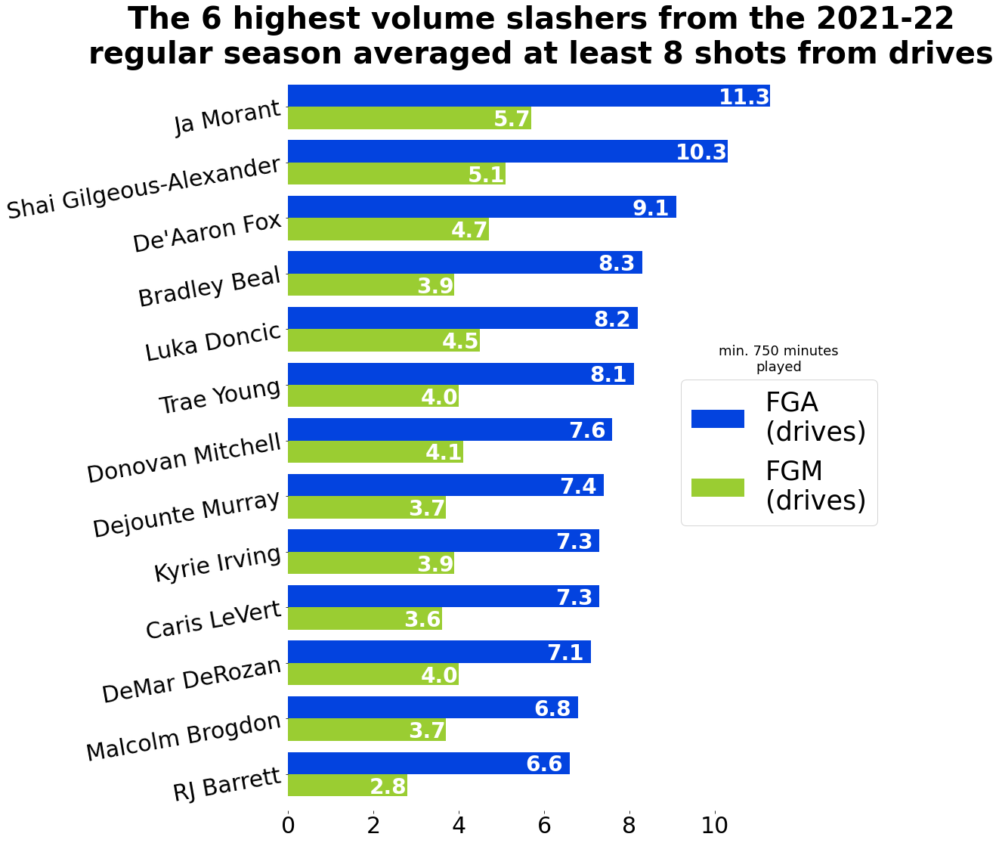

In [314]:
df1 = Drives21[Drives21['FGA (Drives)'] >= 5.5][['FGM (Drives)', 'FGA (Drives)']].sort_values('FGA (Drives)', ascending=False)

df1 = df1.head(13)

CreateBarH(df=df1, figsize=(12,18), title = '''The 6 highest volume slashers from the 2021-22
regular season averaged at least 8 shots from drives''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10,
          upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.6, shiftlowerbarleft=.45, textbarfontsize=28,
          textbarcolor='white', legend_labels=['''FGM
(drives)''', '''FGA
(drives)'''], legend_order=[1,0], legend_pos=[.75, .6], legend_size=35, width=.8, color=['yellowgreen', 'xkcd:blue'])

plt.text(11.5, 7.25, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume slashers 2021-22.pdf', bbox_inches='tight')
plt.show()

In [159]:
np.percentile(Drives21[['Net FG% (Drives) from League Average']], 60)

9.823305785124

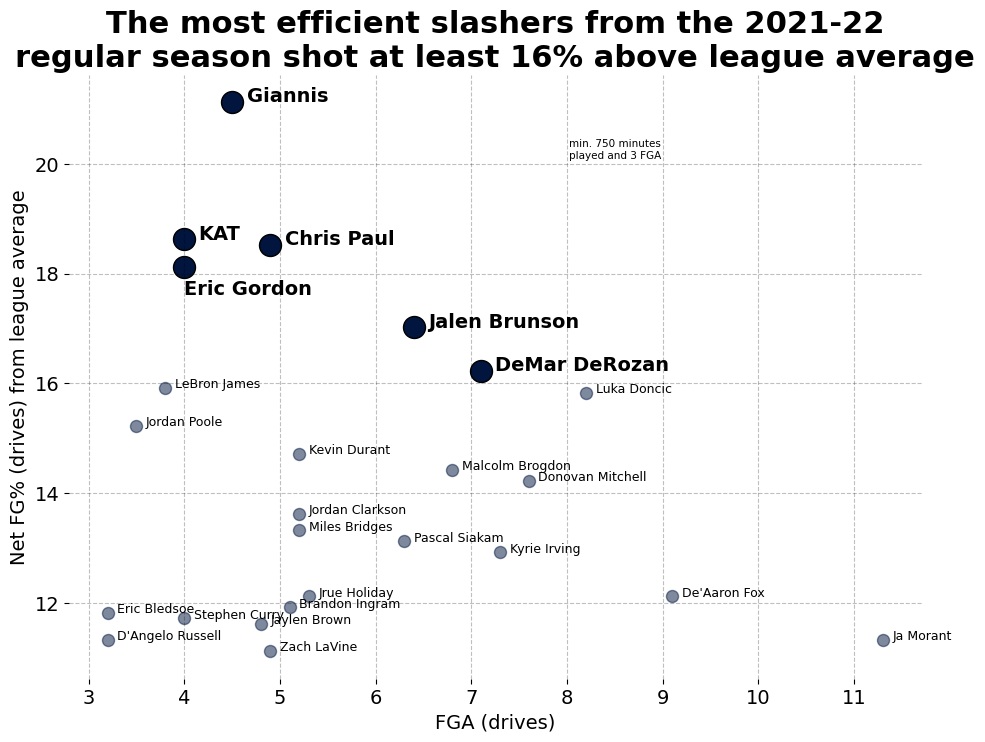

In [604]:
df1 = Drives21[(Drives21['Net FG% (Drives) from League Average'] >= 11) & (Drives21['FGA (Drives)'] >= 3)][['FGA (Drives)', 'Net FG% (Drives) from League Average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1]>=16)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1]>=16)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1]>=16)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
             ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The most efficient slashers from the 2021-22
regular season shot at least 16% above league average''', titlefontsize=22, marker='o', scattercolor='xkcd:navy', df2=df2, s2=250, x1=.1)

plt.text(4.5+.15, 21.123306, 'Giannis', fontsize=14, weight='bold')
plt.text(4+.15, 18.623306, 'KAT', fontsize=14, weight='bold')
plt.text(4.9+.15, 18.523306, 'Chris Paul', fontsize=14, weight='bold')
plt.text(4, 18.123306-.5, 'Eric Gordon', fontsize=14, weight='bold')
plt.text(6.4+.15, 17.023306, 'Jalen Brunson', fontsize=14, weight='bold')
plt.text(7.1+.15, 16.223306, 'DeMar DeRozan', fontsize=14, weight='bold')
plt.text(8.5, 20.1, '''min. 750 minutes
played and 3 FGA''', ha='center', fontsize=7.5)
#plt.savefig('scat most efficient slashers from 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

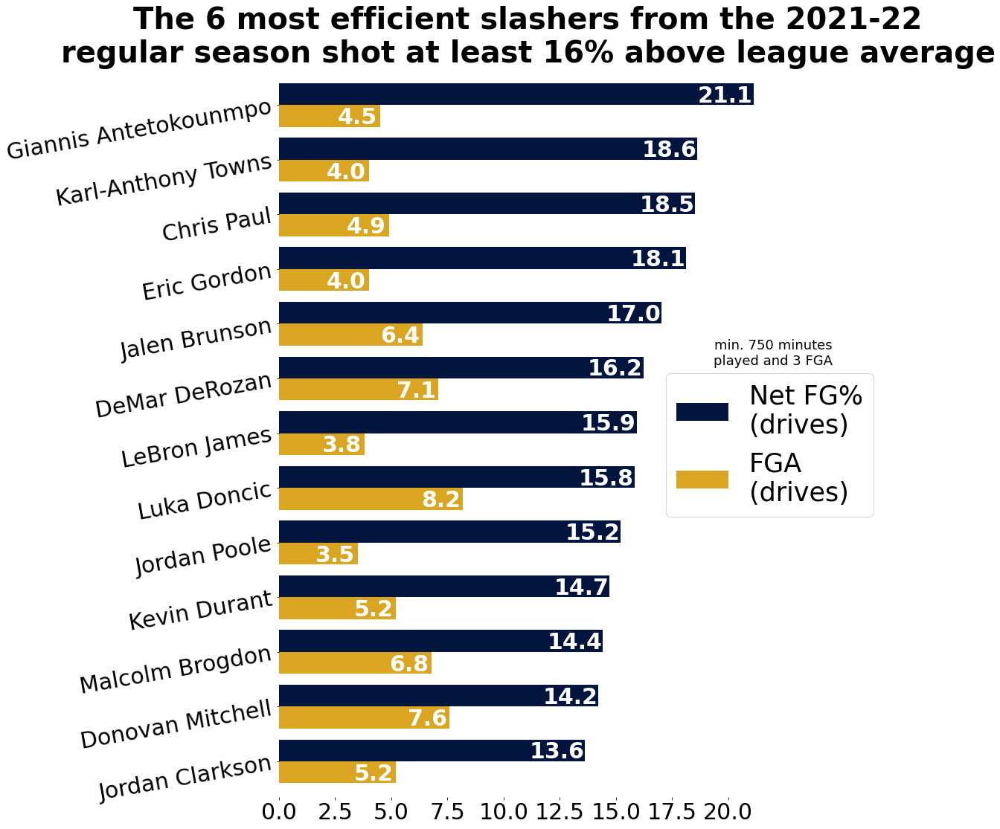

In [332]:
df1 = Drives21[(Drives21['Net FG% (Drives) from League Average'] >= 11) & (Drives21['FGA (Drives)'] >= 3)][['FGA (Drives)', 'Net FG% (Drives) from League Average']]
df1 = df1.head(13)

CreateBarH(df1, figsize=(12,18), title='''The 6 most efficient slashers from the 2021-22
regular season shot at least 16% above league average''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10,
          upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=1.25, shiftlowerbarleft=1, textbarfontsize=30,
           textbarcolor='white', legend_labels=['''FGA
(drives)''',
'''Net FG%
(drives)'''], legend_order=[1,0], legend_pos=[.75, .6], legend_size=35, width=.8, color=['goldenrod', 'xkcd:navy']
          
          )
plt.text(22, 7.25, '''min. 750 minutes
played and 3 FGA''', ha='center', fontsize=18)
#plt.savefig('bar most efficient slashers 2021-22.pdf', bbox_inches='tight')
plt.show()

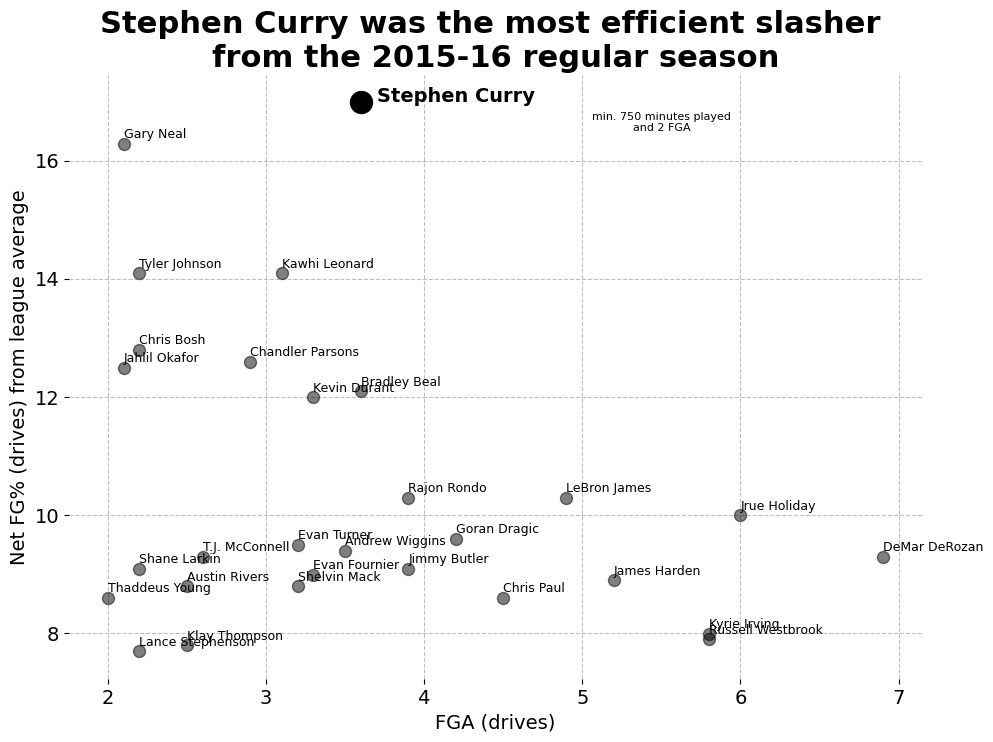

In [605]:
df1 = Drives15[(Drives15['Net FG% (Drives) from League Average'] >= 7.515966) & (Drives15['FGA (Drives)'] >= 2)][['FGA (Drives)','Net FG% (Drives) from League Average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1]>=16.5)]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1]>=16.5)]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1]>=16.5)]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
             ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''Stephen Curry was the most efficient slasher 
from the 2015-16 regular season''', titlefontsize=22, marker='o', scattercolor='black', df2=df2, s2=250, y1=.1)

plt.text(3.6+.1, 16.990966, 'Stephen Curry', fontsize=14, weight='bold')

plt.text(5.5,16.5, '''min. 750 minutes played
and 2 FGA''', fontsize=8, horizontalalignment='center')
#plt.savefig('Stephen Curry was the most efficient slasher from the 2015-16 regular season.pdf', bbox_inches='tight')
plt.show()

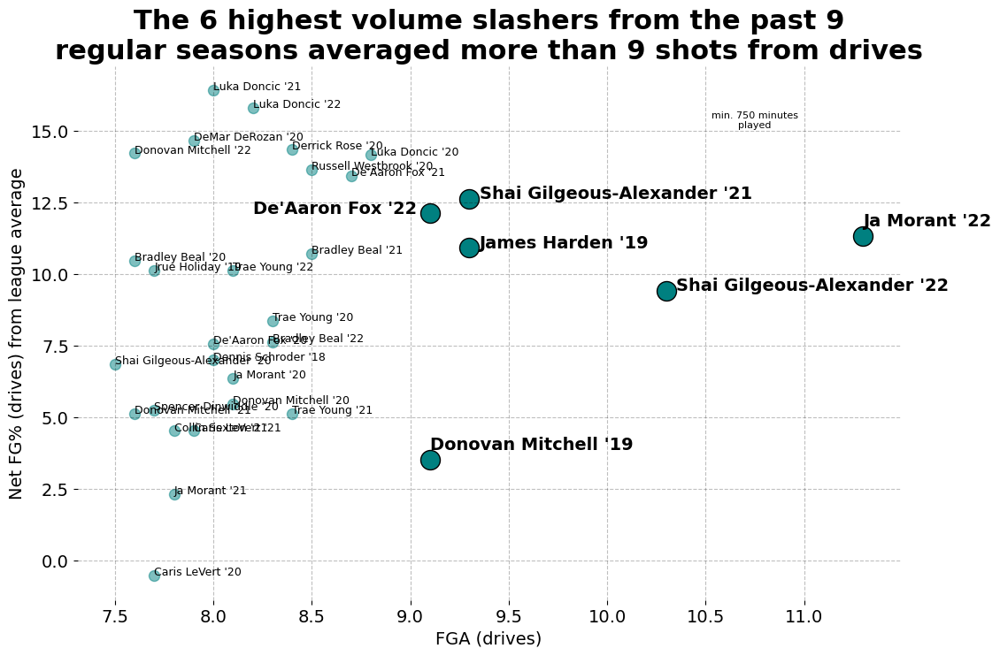

In [606]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['FGA (Drives)'] >= 7.5)][['FGA (Drives)', 'Net FG% (Drives) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_drives = [lst[i] for i in range(len(lst))]
new_drives

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('FGA (Drives)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=9]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=9]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=9]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(12,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
             ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The 6 highest volume slashers from the past 9
regular seasons averaged more than 9 shots from drives''', titlefontsize=22, marker='o', scattercolor='teal', df2=df2, s2=250)

plt.text(11.3, 11.323305785124+.35, "Ja Morant '22", fontsize=14, weight='bold')
plt.text(10.3+.05, 9.423305785124, "Shai Gilgeous-Alexander '22", fontsize=14, weight='bold')
plt.text(9.3+.05, 12.6242592592593, "Shai Gilgeous-Alexander '21", fontsize=14, weight='bold')
plt.text(9.3+.05, 10.9184905660377, "James Harden '19", fontsize=14, weight='bold')
plt.text(9.1, 3.5184905660377+.35, "Donovan Mitchell '19", fontsize=14, weight='bold')
plt.text(9.1-.9, 12.123305785124, "De'Aaron Fox '22", fontsize=14, weight='bold')

plt.text(10.75, 15+.1, '''min. 750 minutes
played''', fontsize=8, horizontalalignment='center')
#plt.savefig('Highest volume slashers from past 9 regular seasons.pdf', bbox_inches='tight')
plt.show()

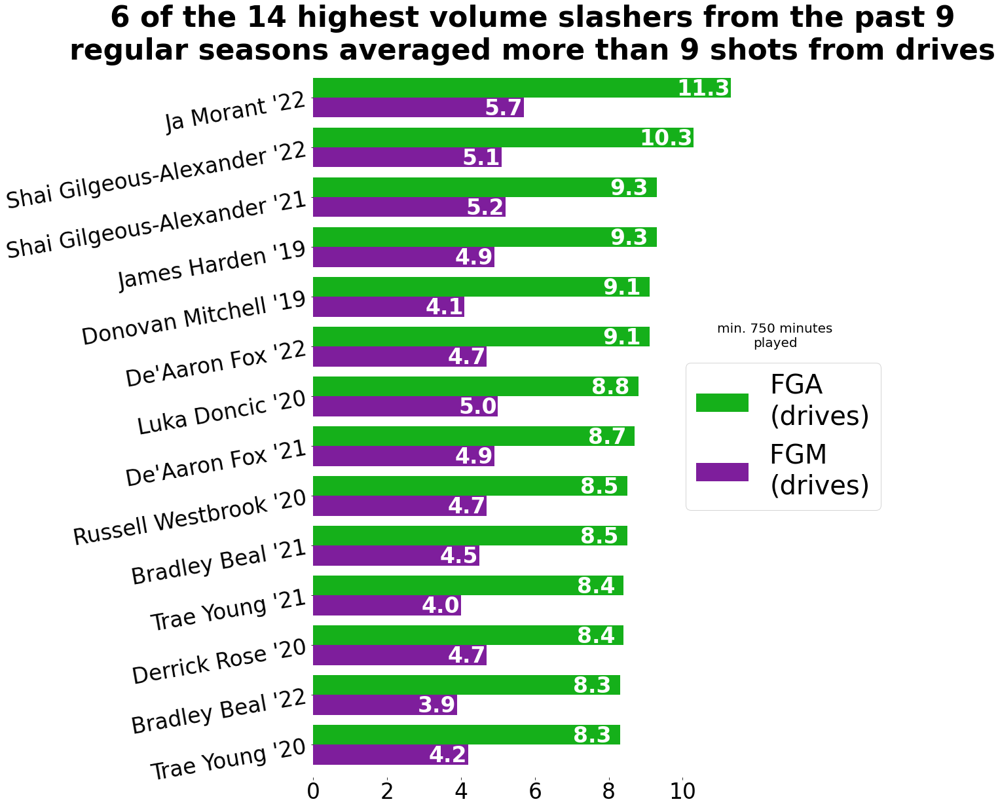

In [302]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['FGA (Drives)'] >= 7.5)][['FGM (Drives)', 'FGA (Drives)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_drives = [lst[i] for i in range(len(lst))]
new_drives

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('FGA (Drives)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(14)

CreateBarH(df1, figsize=(12,20), title = '''6 of the 14 highest volume slashers from the past 9
regular seasons averaged more than 9 shots from drives''', titlefontsize=44, xticksize=33, yticksize=33,
          ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.75, shiftlowerbarleft=.55,
          textbarfontsize=33, textbarcolor='white', legend_labels=['''FGM 
(drives)''', '''FGA
(drives)'''], legend_order=[1,0], legend_pos=[.82, .6], legend_size=40, width=.8, color=['xkcd:purple', 'xkcd:green'])

plt.text(12.5, 8, '''min. 750 minutes
played''', ha='center', fontsize=20)

#plt.savefig('bar highest volume slashers past 9.pdf', bbox_inches='tight')
plt.show()

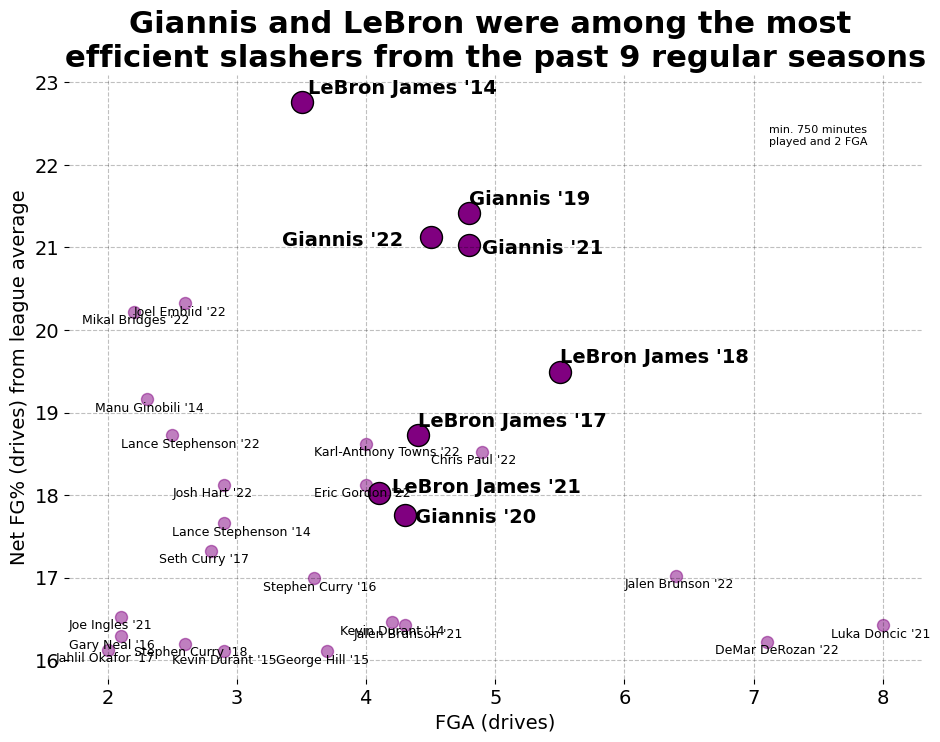

In [607]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['Net FG% (Drives) from League Average'] >= 16) & (df['FGA (Drives)'] >= 2)][['FGA (Drives)', 'Net FG% (Drives) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_drives = [lst[i] for i in range(len(lst))]
new_drives

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('Net FG% (Drives) from League Average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (list(df1.index)[i]).startswith(('LeBron', 'Giannis'))]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (list(df1.index)[i]).startswith(('LeBron', 'Giannis'))]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (list(df1.index)[i]).startswith(('LeBron', 'Giannis'))]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
             ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''Giannis and LeBron were among the most 
efficient slashers from the past 9 regular seasons''', titlefontsize=22, marker='o', scattercolor='purple', 
              df2=df2, s2=250, x1=-.4, y1=-.15
             )

plt.text(4.5-1.15, 21.123305785124-.1, 'Giannis \'22', fontsize=14, weight='bold')
plt.text(4.8+.1, 21.0242592592593-.1, 'Giannis \'21', fontsize=14, weight='bold')
plt.text(4.1+.1, 18.0242592592593, 'LeBron James \'21', fontsize=14, weight='bold')
plt.text(4.3+.075, 17.7604914933837-.1, 'Giannis \'20', fontsize=14, weight='bold')
plt.text(4.8, 21.4184905660377+.1, 'Giannis \'19', fontsize=14, weight='bold')
plt.text(5.5, 19.4970370370371+.1, 'LeBron James \'18', fontsize=14, weight='bold')
plt.text(4.4, 18.7277777777778+.1, 'LeBron James \'17', fontsize=14, weight='bold')
plt.text(3.5+.05, 22.7607883817428+.1, 'LeBron James \'14', fontsize=14, weight='bold')

plt.text(7.5, 22.25, '''min. 750 minutes
played and 2 FGA''', ha='center', fontsize=8)
#plt.savefig('scat most efficient slashers past 9.pdf', bbox_inches='tight')
plt.show()

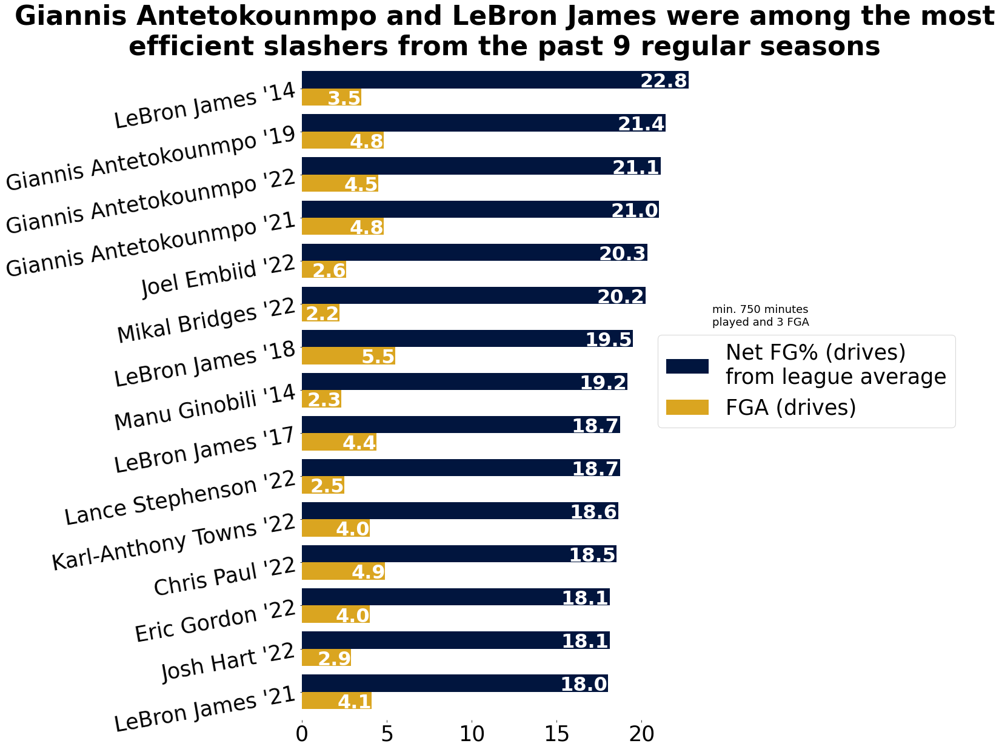

In [308]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['Net FG% (Drives) from League Average'] >= 16) & (df['FGA (Drives)'] >= 2)][['FGA (Drives)', 'Net FG% (Drives) from League Average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_drives = [lst[i] for i in range(len(lst))]
new_drives

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('Net FG% (Drives) from League Average', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)
df1

CreateBarH(df1, figsize=(12,20), title='''Giannis Antetokounmpo and LeBron James were among the most
efficient slashers from the past 9 regular seasons''', titlefontsize=44, xticksize=35, yticksize=35, ytickrotate=10,
          upperbarshiftup=.025, lowerbarshiftdown=.375, shiftupperbarleft=1.45, shiftlowerbarleft=1, textbarfontsize=32,
           textbarcolor='white', legend_labels=['''FGA (drives)''',
'''Net FG% (drives)
from league average'''], legend_order=[1,0], legend_pos=[.85, .6], legend_size=35, width=.8, color=['goldenrod', 'xkcd:navy']
          
          
          )

plt.text(27, 8.5, '''min. 750 minutes
played and 3 FGA''', ha='center', fontsize=18)
#plt.savefig('bar most efficient slashers past 9.pdf', bbox_inches='tight')
plt.show()

In [6]:
# call restricted area stats
restricted21 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2021-22')
restricted21.set_index('PLAYER', inplace=True)

restricted20 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2020-21')
restricted20.set_index('PLAYER', inplace=True)

restricted19 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2019-20')
restricted19.set_index('PLAYER', inplace=True)

restricted18 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2018-19')
restricted18.set_index('PLAYER', inplace=True)

restricted17 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2017-18')
restricted17.set_index('PLAYER', inplace=True)

restricted16 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2016-17')
restricted16.set_index('PLAYER', inplace=True)

restricted15 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2015-16')
restricted15.set_index('PLAYER', inplace=True)

restricted14 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2014-15')
restricted14.set_index('PLAYER', inplace=True)

restricted13 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2013-14')
restricted13.set_index('PLAYER', inplace=True)

restricted12 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2012-13')
restricted12.set_index('PLAYER', inplace=True)

restricted11 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2011-12')
restricted11.set_index('PLAYER', inplace=True)

restricted10 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2010-11')
restricted10.set_index('PLAYER', inplace=True)

restricted09 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2009-10')
restricted09.set_index('PLAYER', inplace=True)

restricted08 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2008-09')
restricted08.set_index('PLAYER', inplace=True)

restricted07 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2007-08')
restricted07.set_index('PLAYER', inplace=True)

restricted06 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2006-07')
restricted06.set_index('PLAYER', inplace=True)

restricted05 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2005-06')
restricted05.set_index('PLAYER', inplace=True)

restricted04 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2004-05')
restricted04.set_index('PLAYER', inplace=True)

restricted03 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2003-04')
restricted03.set_index('PLAYER', inplace=True)

restricted02 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2002-03')
restricted02.set_index('PLAYER', inplace=True)

restricted01 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2001-02')
restricted01.set_index('PLAYER', inplace=True)

restricted00 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 2000-01')
restricted00.set_index('PLAYER', inplace=True)

restricted99 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 1999-00')
restricted99.set_index('PLAYER', inplace=True)

restricted98 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 1998-99')
restricted98.set_index('PLAYER', inplace=True)

restricted97 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Restricted Area 1997-98')
restricted97.set_index('PLAYER', inplace=True)

In [278]:
allRESTRICTED = [restricted21, restricted20, restricted19, restricted18, restricted17, restricted16, restricted15,
                restricted14, restricted13, restricted12, restricted11, restricted10, restricted09, restricted08,
                restricted07, restricted06, restricted05, restricted04, restricted03, restricted02,
                restricted01, restricted00, restricted99, restricted98, restricted97]

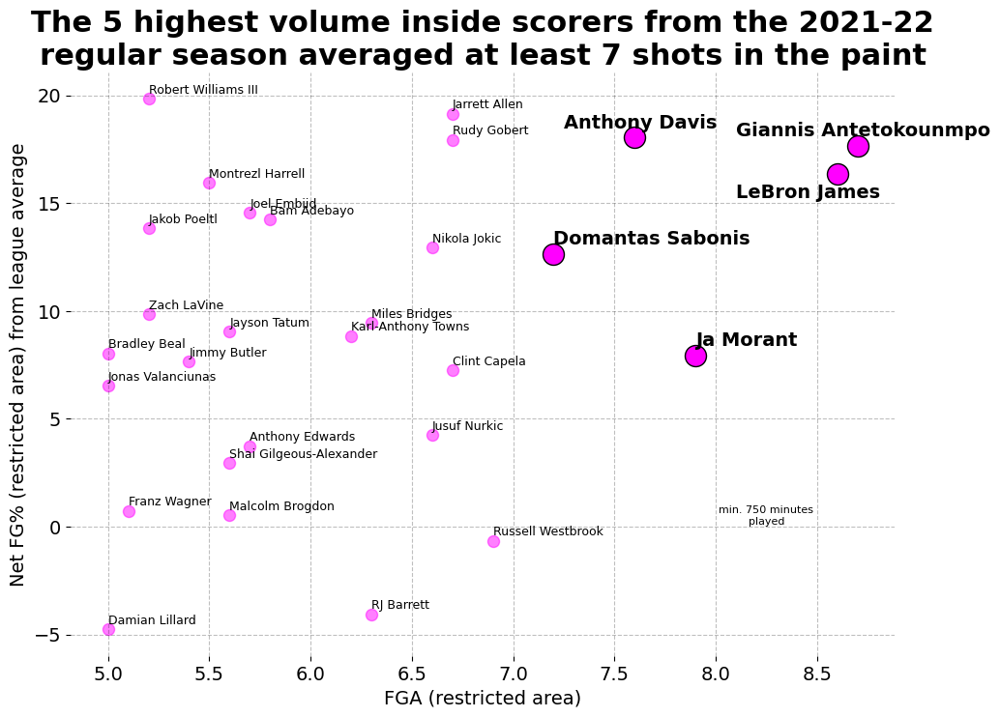

In [608]:
df1 = restricted21[restricted21['FGA (Restricted Area)']>=5][['FGA (Restricted Area)', 'Net FG% (Restricted Area)']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=7]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=7]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=7]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1=df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (restricted area)', xlabelsize=14, 
             xticksize=14, ylabel='Net FG% (restricted area) from league average', yticksize=14, 
title = '''The 5 highest volume inside scorers from the 2021-22
regular season averaged at least 7 shots in the paint''', titlefontsize=22, marker='o', scattercolor='fuchsia', ylabelsize=14, df2=df2, s2=250,y1=.25
             )


plt.text(7.6-.35, 18.043449+.45, 'Anthony Davis', fontsize=14, weight='bold')
plt.text(8.7-.6, 17.643449+.45, 'Giannis Antetokounmpo', fontsize=14, weight='bold')
plt.text(8.6-.5, 16.343449-1.1, 'LeBron James', fontsize=14, weight='bold')
plt.text(7.2, 12.643449+.45, 'Domantas Sabonis', fontsize=14, weight='bold')
plt.text(7.9, 7.94344900000001+.45, 'Ja Morant', fontsize=14, weight='bold')
plt.text(8.25, 0.1, '''min. 750 minutes
played''', ha='center', fontsize=8)

#plt.savefig('scat highest volume inside scorers from 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

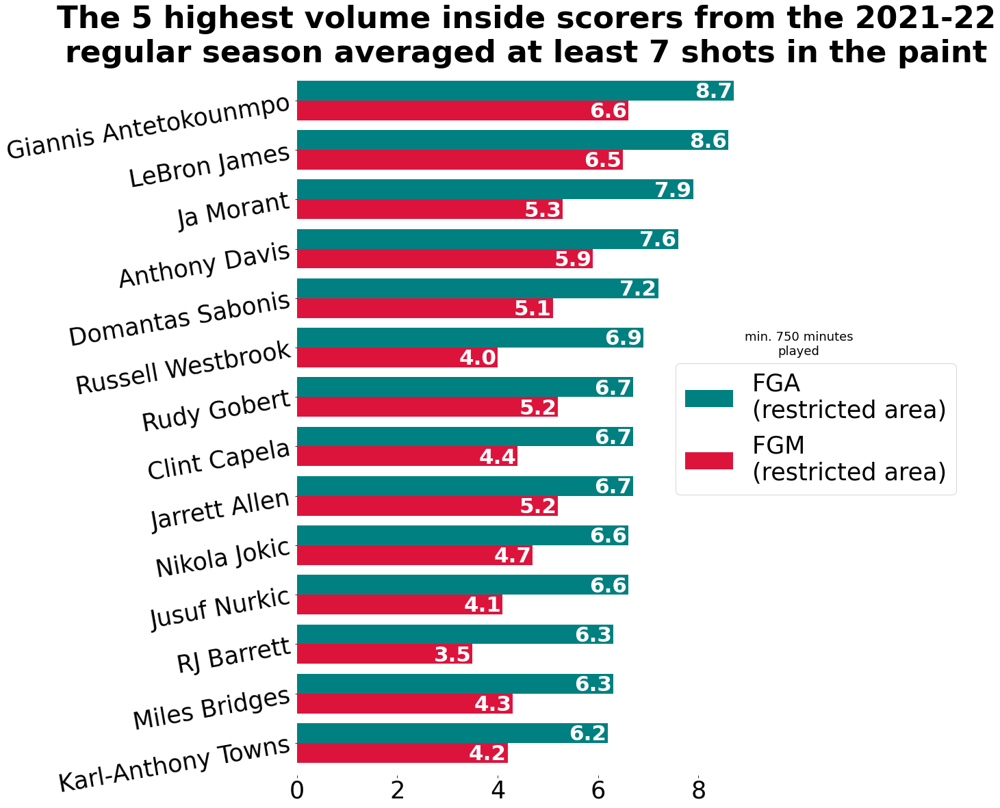

In [8]:
df1 = restricted21[restricted21['FGA (Restricted Area)']>=5][['FGM (Restricted Area)', 'FGA (Restricted Area)']].sort_values('FGA (Restricted Area)', ascending=False)
df1 = df1.head(14)

CreateBarH(df1, figsize=(12,19), title = '''The 5 highest volume inside scorers from the 2021-22
regular season averaged at least 7 shots in the paint''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10,
upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.4, shiftlowerbarleft=.4, textbarfontsize=31,
           textbarcolor='white', legend_labels=
['''FGM 
(restricted area)''', '''FGA
(restricted area)'''], legend_order = [1,0], legend_pos=[.80, .6], legend_size = 35, width=.8,
color=['crimson', 'teal']

)

plt.text(10, 7.85, '''min. 750 minutes
played''', ha='center', fontsize=18)

plt.savefig('bar highest volume inside scorers from 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

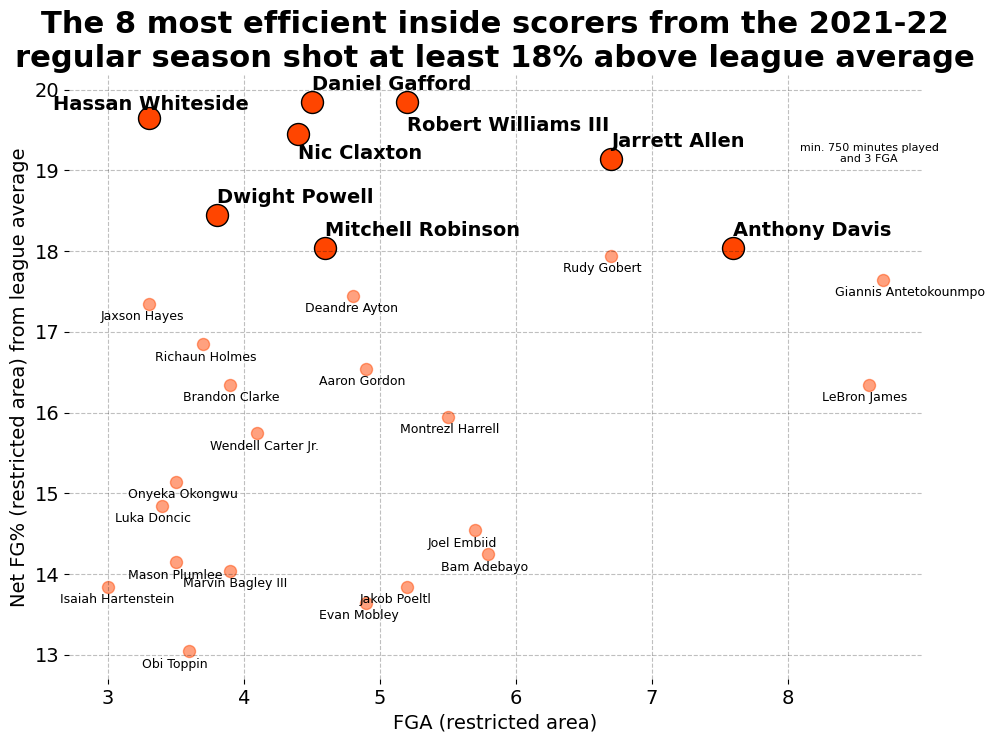

In [609]:
df1 = restricted21[(restricted21['Net FG% (Restricted Area)']>=13) & (restricted21['FGA (Restricted Area)']>=3)][['FGA (Restricted Area)', 'Net FG% (Restricted Area)']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1])>=18]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1])>=18]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1])>=18]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1=df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (restricted area)', xlabelsize=14,
              xticksize=14, ylabel='Net FG% (restricted area) from league average', ylabelsize=14, yticksize=14,
              title='''The 8 most efficient inside scorers from the 2021-22
regular season shot at least 18% above league average''', titlefontsize=22, marker='o', scattercolor='orangered', df2=df2, s2=250
              ,y1=-.2, x1=-.35
             
             )

plt.text(4.5, 19.843449+.15, 'Daniel Gafford', fontsize=14, weight='bold')
plt.text(5.2, 19.843449-.35, 'Robert Williams III', fontsize=14, weight='bold')
plt.text(3.3-.7, 19.643449+.1, 'Hassan Whiteside', fontsize=14, weight='bold')
plt.text(4.4, 19.443449-.3, 'Nic Claxton', fontsize=14, weight='bold')
plt.text(6.7, 19.143449+.15, 'Jarrett Allen', fontsize=14, weight='bold')
plt.text(3.8, 18.443449+.15, 'Dwight Powell', fontsize=14, weight='bold')
plt.text(7.6, 18.043449+.15, 'Anthony Davis', fontsize=14, weight='bold')
plt.text(4.6, 18.043449+.15, 'Mitchell Robinson', fontsize=14, weight='bold')

plt.text(8.6,19.1, '''min. 750 minutes played
and 3 FGA''', ha='center', fontsize=8)
#plt.savefig('scat most efficient paint scorers from 2021-22 NBA regular seasonfrom 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

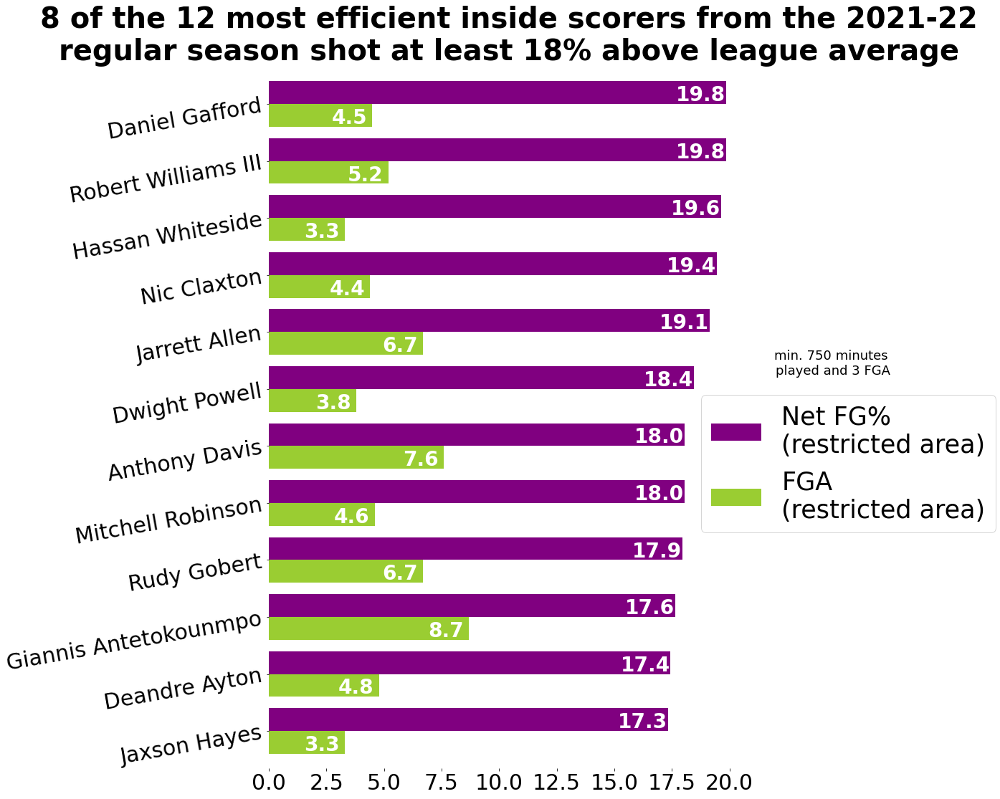

In [49]:
df1 = restricted21[(restricted21['Net FG% (Restricted Area)']>=13) & (restricted21['FGA (Restricted Area)']>=3)][['FGA (Restricted Area)', 'Net FG% (Restricted Area)']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1])>=18]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1])>=18]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1])>=18]

df1 = df1.head(12)

CreateBarH(df1, figsize=(12,18), title='''8 of the 12 most efficient inside scorers from the 2021-22
regular season shot at least 18% above league average''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10,
          upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=1.1, shiftlowerbarleft=1, textbarfontsize=28,
           textbarcolor='white', legend_labels=['''FGA
(restricted area)''', '''Net FG%
(restricted area)'''], legend_order=[1,0], legend_pos=[.875, .55], legend_size=35, width=.8, color=['yellowgreen',
                                                                                                 'purple']
           )
plt.text(24.5, 6.25, '''min. 750 minutes 
played and 3 FGA''', fontsize=18, horizontalalignment='center')

#plt.savefig(' bar most efficient inside scorers from 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

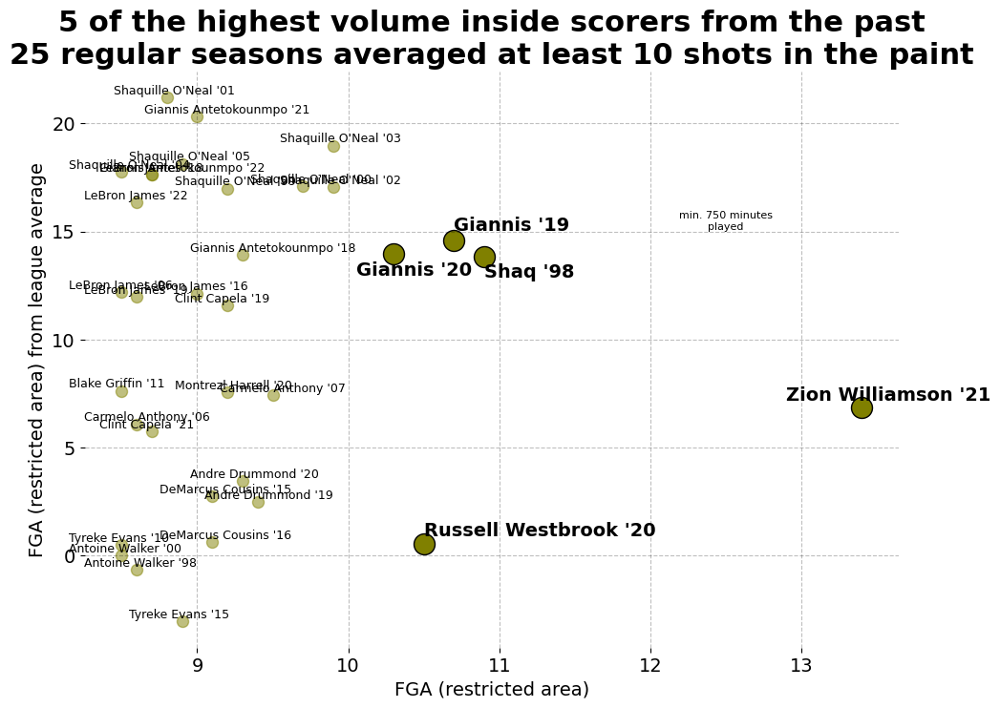

In [610]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['FGA (Restricted Area)'] >= 8.5)][['FGA (Restricted Area)', 'Net FG% (Restricted Area)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('FGA (Restricted Area)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=10]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=10]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=10]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100,xlabel='FGA (restricted area)', xlabelsize=14, xticksize=14
              , ylabel='FGA (restricted area) from league average', ylabelsize=14, yticksize=14, title= 
'''5 of the highest volume inside scorers from the past
25 regular seasons averaged at least 10 shots in the paint''',
titlefontsize=22, marker='o', scattercolor='olive' , df2=df2, s2=250, x1=-.35, y1=.15
              
             )

plt.text(13.4-.5, 6.83537+.35, "Zion Williamson '21", fontsize=14, weight='bold')
plt.text(10.9, 13.854442-1, "Shaq '98", fontsize=14, weight='bold')
plt.text(10.7, 14.586174+.45, "Giannis '19", fontsize=14, weight='bold')
plt.text(10.5, 0.554167+.35, "Russell Westbrook '20", fontsize=14, weight='bold')
plt.text(10.3-.25, 13.954167-1, "Giannis '20", fontsize=14, weight='bold')
plt.text(12.5, 15.1, '''min. 750 minutes
played''', ha='center', fontsize=8)
#plt.savefig('scat Highest volume inside scorers from past 25 regular seasons.pdf', bbox_inches='tight')
plt.show()

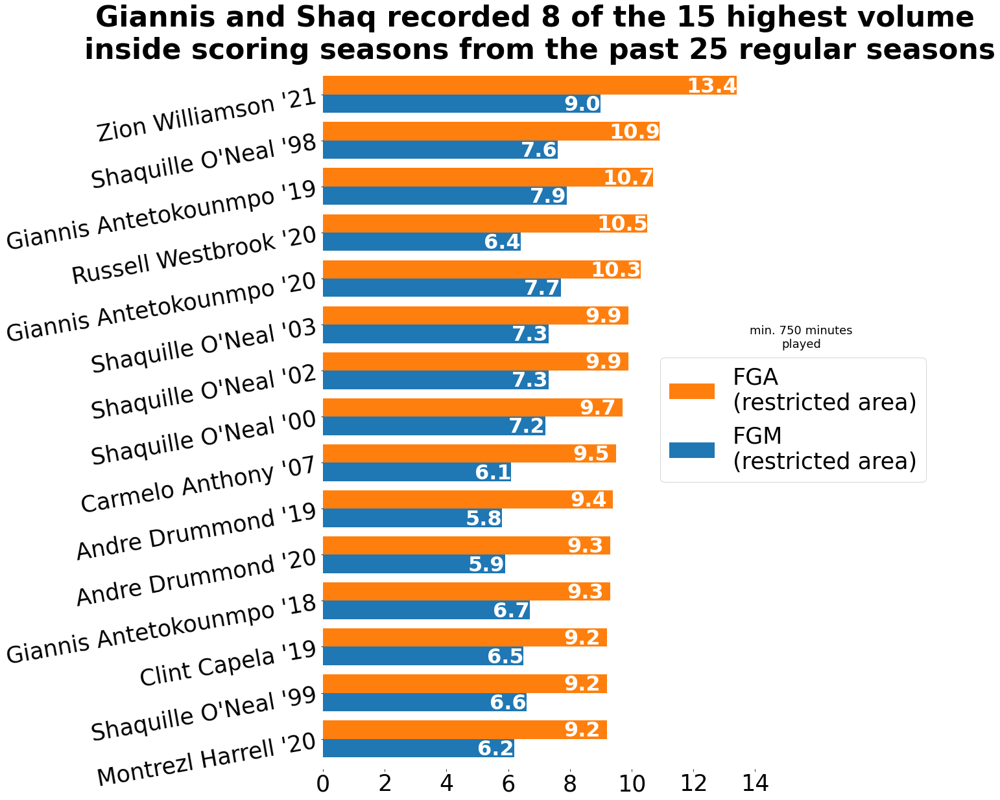

In [293]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['FGA (Restricted Area)'] >= 8.5)][['FGM (Restricted Area)', 'FGA (Restricted Area)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('FGA (Restricted Area)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), title = 
'''Giannis and Shaq recorded 8 of the 15 highest volume 
inside scoring seasons from the past 25 regular seasons''', titlefontsize=44, xticksize=35, yticksize=35, ytickrotate=10,
           upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.8, shiftlowerbarleft=.6, textbarfontsize=32,
           textbarcolor='white', legend_labels=['''FGM
(restricted area)''', '''FGA
(restricted area)'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, width=.8

)

plt.text(15.5, 8.5, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume inside scorers from past 25 regular seasons.pdf', bbox_inches='tight')
plt.show()

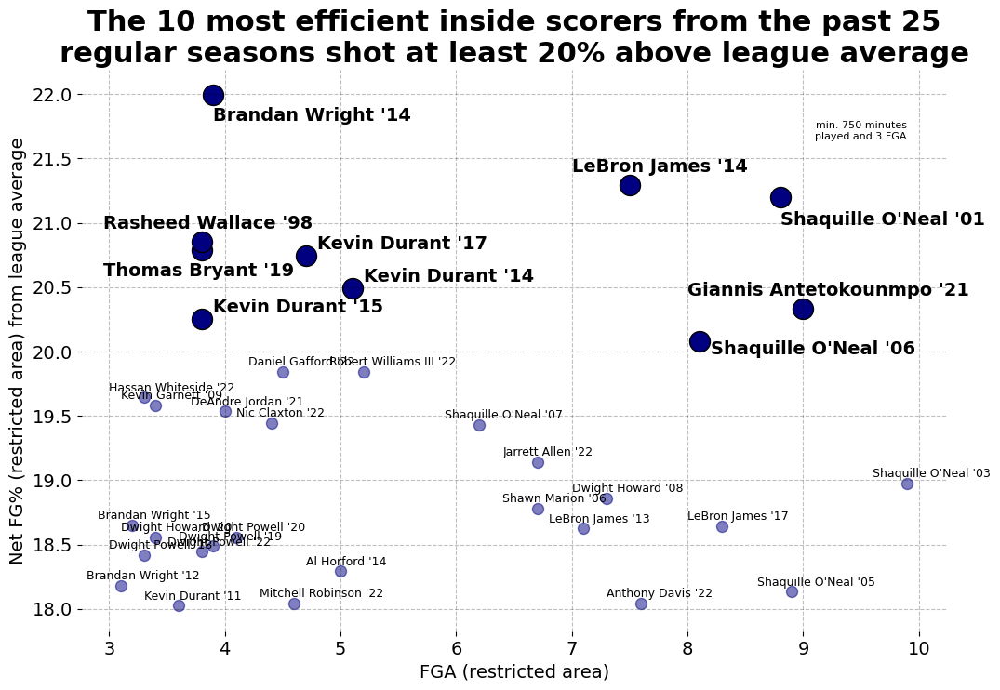

In [611]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['Net FG% (Restricted Area)'] >= 18) & (df['FGA (Restricted Area)'] >= 3)][['FGA (Restricted Area)', 'Net FG% (Restricted Area)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('FGA (Restricted Area)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1])>=20]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1])>=20]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1])>=20]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(12,8), dpi=100, xlabel='FGA (restricted area)', xlabelsize=14,
              xticksize=14, ylabel='Net FG% (restricted area) from league average', ylabelsize=14,
              yticksize=14, title=
'''The 10 most efficient inside scorers from the past 25
regular seasons shot at least 20% above league average''', titlefontsize=22, marker='o', scattercolor='navy',
df2=df2, s2=250, y1=.05, x1=-.3

)
plt.text(3.9, 21.992531-.2, 'Brandan Wright \'14', fontsize=14, weight='bold')
plt.text(7.5-.5, 21.292531+.1, 'LeBron James \'14', fontsize=14, weight='bold')
plt.text(5.1+.1, 20.492531+.05, 'Kevin Durant \'14', fontsize=14, weight='bold')
plt.text(3.8-.85, 20.854442+.1, 'Rasheed Wallace \'98', fontsize=14, weight='bold')
plt.text(9-1, 20.33537+.1, 'Giannis Antetokounmpo \'21', fontsize=14, weight='bold')
plt.text(3.8+.1, 20.251626+.05, 'Kevin Durant \'15', fontsize=14, weight='bold')
plt.text(4.7+.1, 20.743711+.05, 'Kevin Durant \'17', fontsize=14, weight='bold')
plt.text(3.8-.85, 20.786174-.2, 'Thomas Bryant \'19', fontsize=14, weight='bold')
plt.text(8.1+.1, 20.080131-.1, 'Shaquille O\'Neal \'06', fontsize=14, weight='bold')
plt.text(8.8, 21.202268-.22, 'Shaquille O\'Neal \'01', fontsize=14, weight='bold')
plt.text(9.5, 21.65, '''min. 750 minutes
played and 3 FGA''', fontsize=8, ha='center')
#plt.savefig('scat most efficient inside scorers from past 25 regular seasons.pdf', bbox_inches='tight')
plt.show()

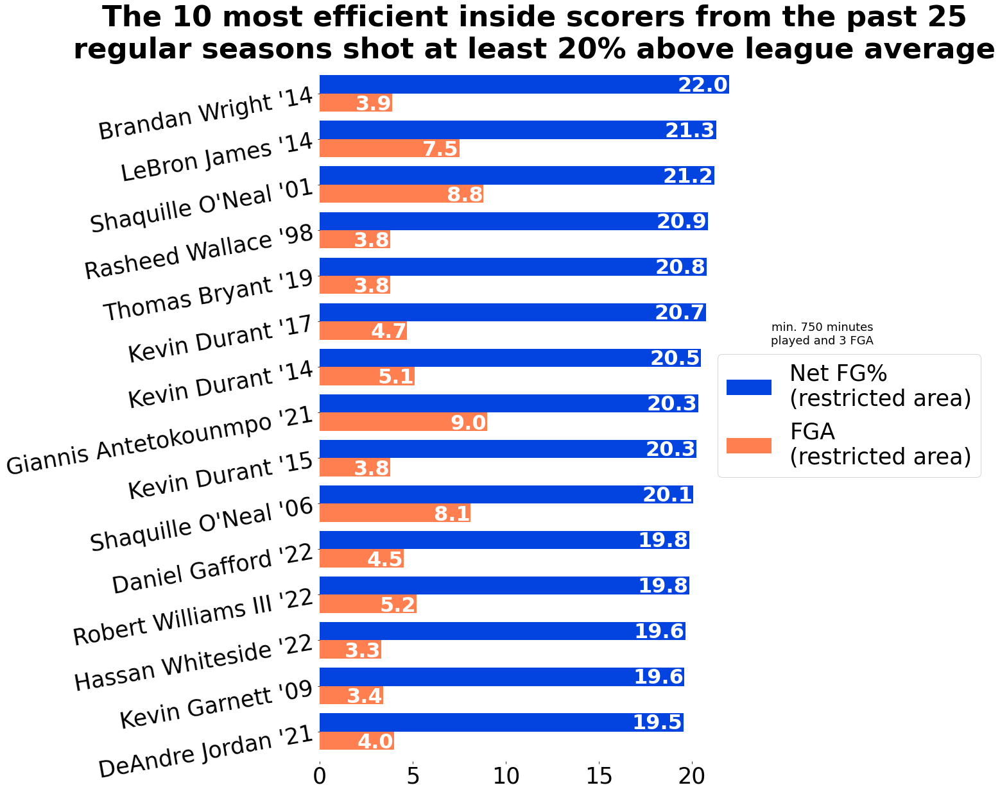

In [295]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['Net FG% (Restricted Area)'] >= 18) & (df['FGA (Restricted Area)'] >= 3)][['FGA (Restricted Area)', 'Net FG% (Restricted Area)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('Net FG% (Restricted Area)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), title=
'''The 10 most efficient inside scorers from the past 25
regular seasons shot at least 20% above league average''', titlefontsize=45, xticksize=35, yticksize=35, 
    ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.365,
     shiftupperbarleft=1.4, shiftlowerbarleft=1, textbarfontsize=32, textbarcolor='white', legend_labels = 
[
'''FGA
(restricted area)''','''Net FG%
(restricted area)'''
], legend_order=[1,0], legend_pos = [.9, .6], legend_size=35, width=.8, color = ['coral','xkcd:blue']
          
          )

plt.text(27, 8.5, '''min. 750 minutes
played and 3 FGA''', fontsize=18, ha='center')
#plt.savefig('bar most efficient inside scorers past 25.pdf', bbox_inches='tight')
plt.show()

In [9]:
defense21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2021-22')
defense21.set_index('PLAYER', inplace=True)
defense21['MP'] = defense21['GP'] * defense21['MIN']

defense20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2020-21')
defense20.set_index('PLAYER', inplace=True)
defense20['MP'] = defense20['GP'] * defense20['MIN']

defense19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2019-20')
defense19.set_index('PLAYER', inplace=True)
defense19['MP'] = defense19['GP'] * defense19['MIN']

defense18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2018-19')
defense18.set_index('PLAYER', inplace=True)
defense18['MP'] = defense18['GP'] * defense18['MIN']

defense17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2017-18')
defense17.set_index('PLAYER', inplace=True)
defense17['MP'] = defense17['GP'] * defense17['MIN']

defense16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2016-17')
defense16.set_index('PLAYER', inplace=True)
defense16['MP'] = defense16['GP'] * defense16['MIN']

defense15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2015-16')
defense15.set_index('PLAYER', inplace=True)
defense15['MP'] = defense15['GP'] * defense15['MIN']

defense14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2014-15')
defense14.set_index('PLAYER', inplace=True)
defense14['MP'] = defense14['GP'] * defense14['MIN']

defense13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='DEFENSE 2013-14')
defense13.set_index('PLAYER', inplace=True)
defense13['MP'] = defense13['GP'] * defense13['MIN']


In [11]:
allDEFENSES = [defense21, defense20, defense19, defense18, defense17, defense16, defense15,
              defense14, defense13]

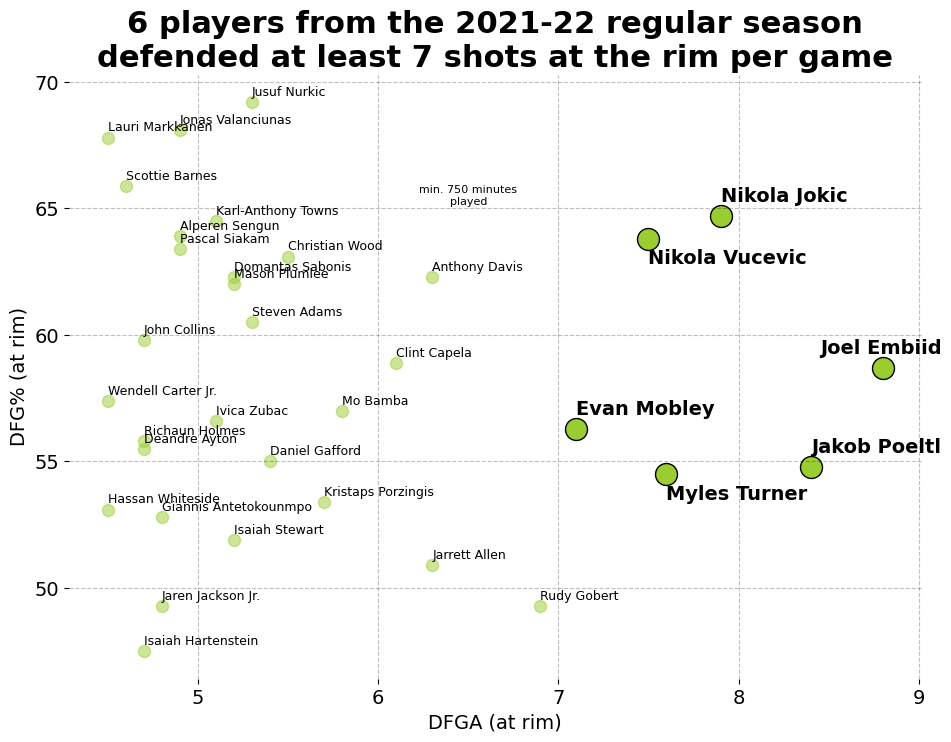

In [612]:
df1 = defense21[(defense21['DFGA']>= 4.5) & (defense21['MP'] >= 750)][['DFGA', 'DFG%']].sort_values('DFGA', ascending=False)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=7]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=7]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=7]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel=('DFGA (at rim)'), xlabelsize=14, xticksize=14,
              ylabel='DFG% (at rim)', ylabelsize=14, yticksize=14, title = 
'''6 players from the 2021-22 regular season
defended at least 7 shots at the rim per game''', titlefontsize=22, marker='o', scattercolor='yellowgreen',
df2=df2, s2=250, y1=.25             )

plt.text(8.8-.35, 58.7+.55, 'Joel Embiid', fontsize=14, weight='bold')
plt.text(8.4, 54.8+.55, 'Jakob Poeltl', fontsize=14, weight='bold')
plt.text(7.9, 64.7+.55, 'Nikola Jokic', fontsize=14, weight='bold')
plt.text(7.6, 54.5-1, 'Myles Turner', fontsize=14, weight='bold')
plt.text(7.5, 63.8-1, 'Nikola Vucevic', fontsize=14, weight='bold')
plt.text(7.1, 56.3+.55, 'Evan Mobley', fontsize=14, weight='bold')
plt.text(6.5, 65.15, '''min. 750 minutes
played''', ha='center', fontsize=8)
#plt.savefig('scat highest volume rim protectors from 2021-22 regular season.pdf', bbox_inches='tight')
plt.show()

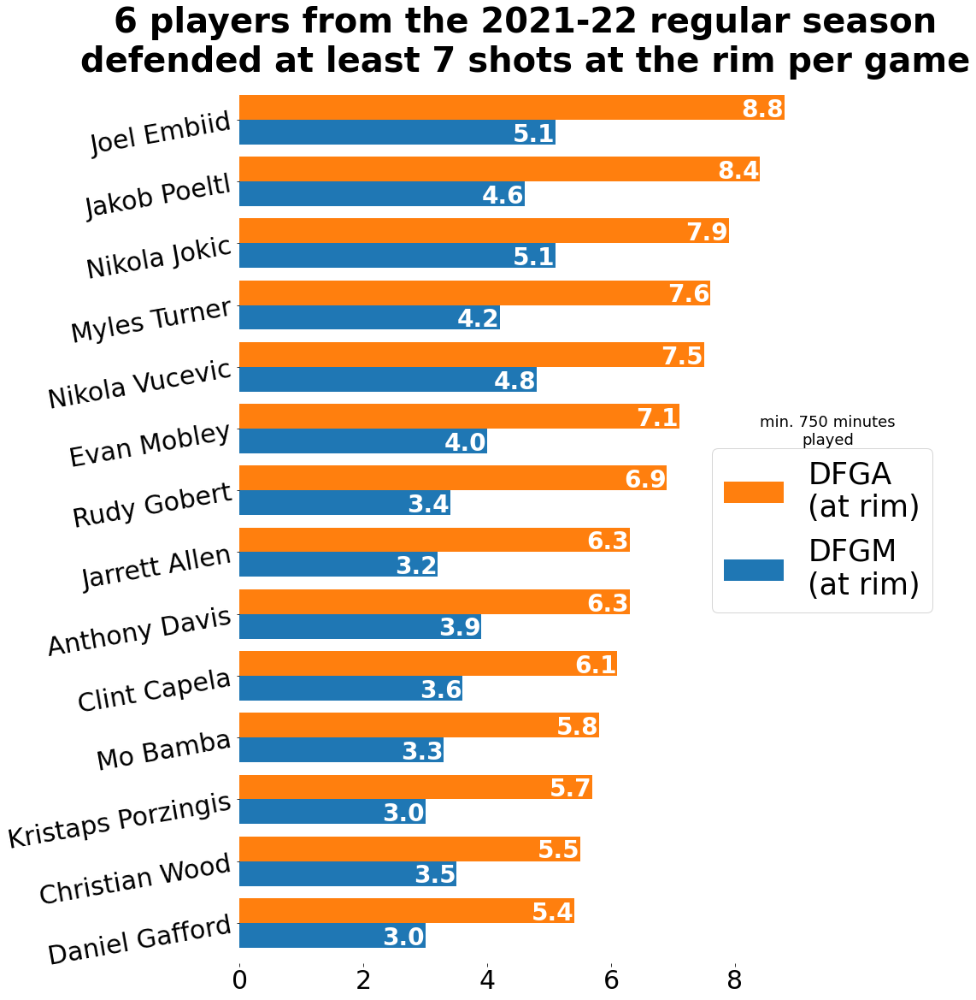

In [187]:
df1 = defense21[(defense21['DFGA']>= 4.5) & (defense21['MP'] >= 750)][['DFGM', 'DFGA']].sort_values('DFGA', ascending=False)
df1 = df1.head(14)
CreateBarH(df1, figsize=(12,19), title=
'''6 players from the 2021-22 regular season
defended at least 7 shots at the rim per game''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.35,
          shiftupperbarleft=.35, shiftlowerbarleft=.35, textbarfontsize=28, textbarcolor='white', legend_labels=[
'''DFGM
(at rim)''', '''DFGA
(at rim)'''], legend_order=[1,0], legend_pos=[.8, .6], legend_size=35, width=.8
          
          )

plt.text(9.5, 7.75, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume rim protectors from 2021-22 regular season.pdf', bbox_inches='tight')
plt.show()

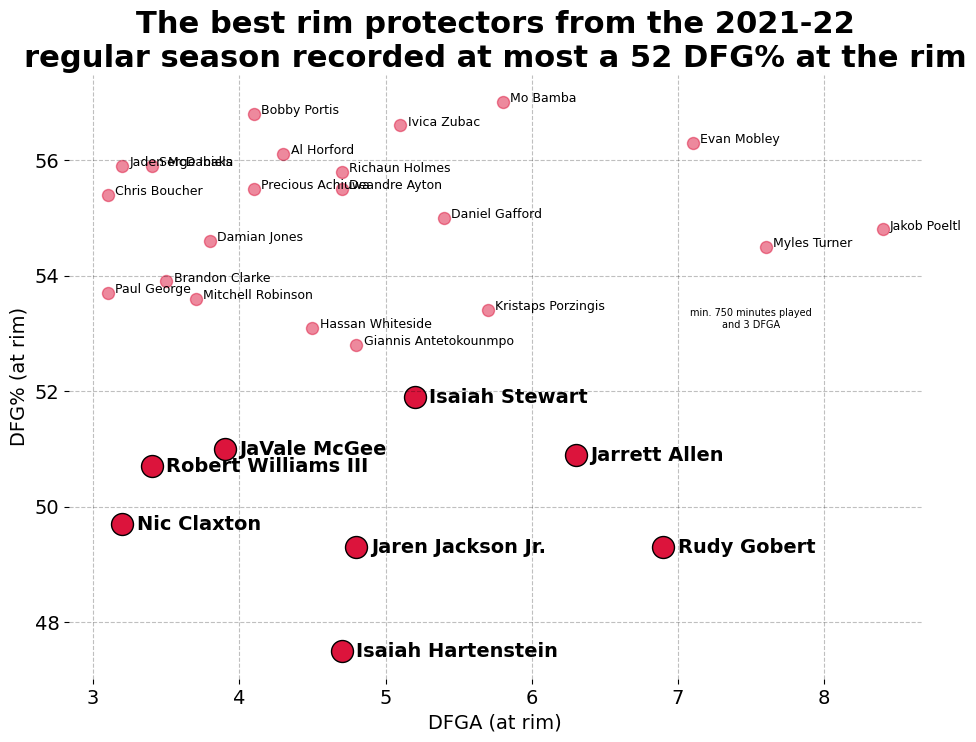

In [613]:
df1 = defense21[(defense21['DFGA']>= 3) & (defense21['MP'] >= 750) & (defense21['DFG%'] <= 57)][['DFGA', 'DFG%']].sort_values('DFG%', ascending=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1])<52]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1])<52]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1])<52]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'FGA (drives)': fgas, 'Net FG% (drives) from league average':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', xlabelsize=14, xticksize=14,
              ylabel='DFG% (at rim)', ylabelsize=14, yticksize=14, title = 
'''The best rim protectors from the 2021-22
regular season recorded at most a 52 DFG% at the rim''', titlefontsize=22, marker='o', scattercolor='crimson', df2=df2, s2=250, x1=.05
             
             
             )

for i in range(len(df2.index)):
    plt.text(df2.iloc[i,0]+.1, df2.iloc[i,1]-.1, list(df2.index)[i], fontsize=14, weight='bold')
    
plt.text(7.5, 53.1, '''min. 750 minutes played
and 3 DFGA''', fontsize=7, horizontalalignment='center')
#plt.savefig('scat best rim protectors from 2021-22 regular season.pdf', bbox_inches='tight')
plt.show()

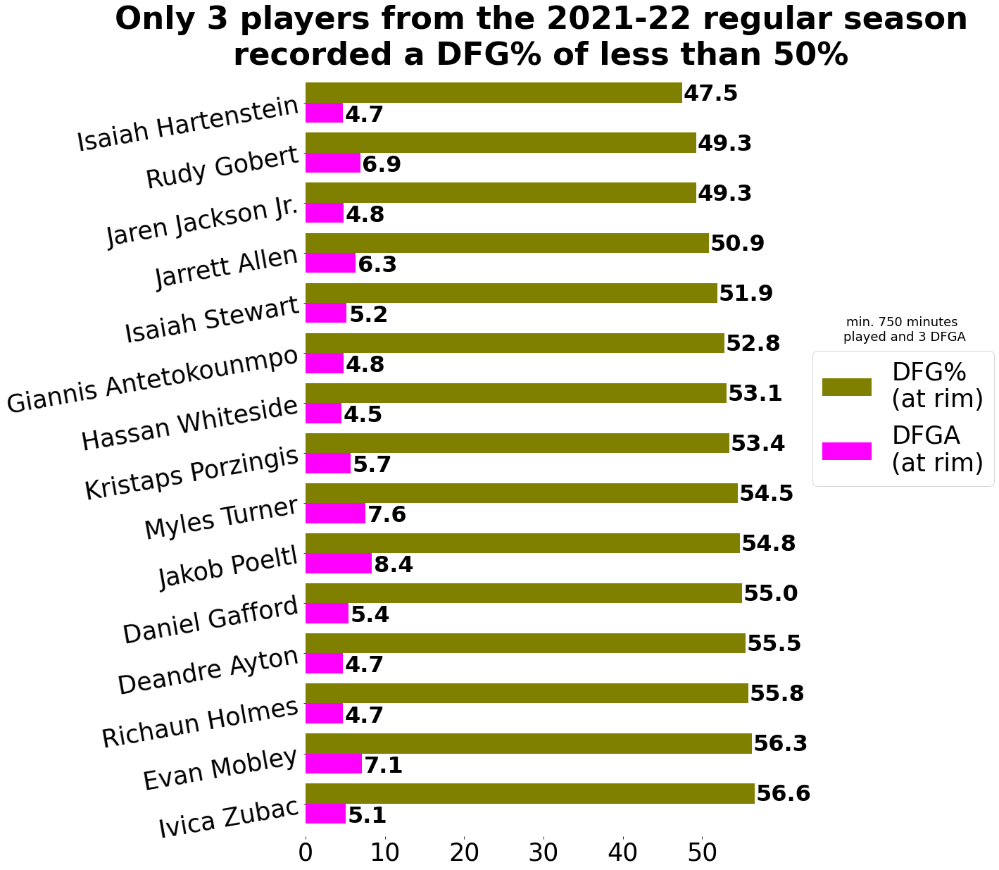

In [228]:
df1 = defense21[(defense21['DFGA']>= 4.5) & (defense21['MP'] >= 750)][['DFGA','DFG%']].sort_values('DFG%', ascending=True)
df1 = df1.head(15)
CreateBarH(df1, figsize=(12,20), title=
'''Only 3 players from the 2021-22 regular season
recorded a DFG% of less than 50%''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10, upperbarshiftup=.05
           , lowerbarshiftdown=.375, shiftupperbarleft=-3.65, shiftlowerbarleft=-2.75, textbarfontsize=32, 
           textbarcolor='black', legend_labels=['''DFGA
(at rim)''', '''DFG%
(at rim)'''], legend_order=[1,0], legend_pos=[1.05, .65], legend_size=35, width=.8, color=['magenta', 'olive'])

plt.text(75.5, 9.25, '''min. 750 minutes 
played and 3 DFGA''', fontsize=18, horizontalalignment='center')

#plt.savefig('bar most effective rim protectors from 2021-22 regular season.pdf', bbox_inches='tight')
plt.show()

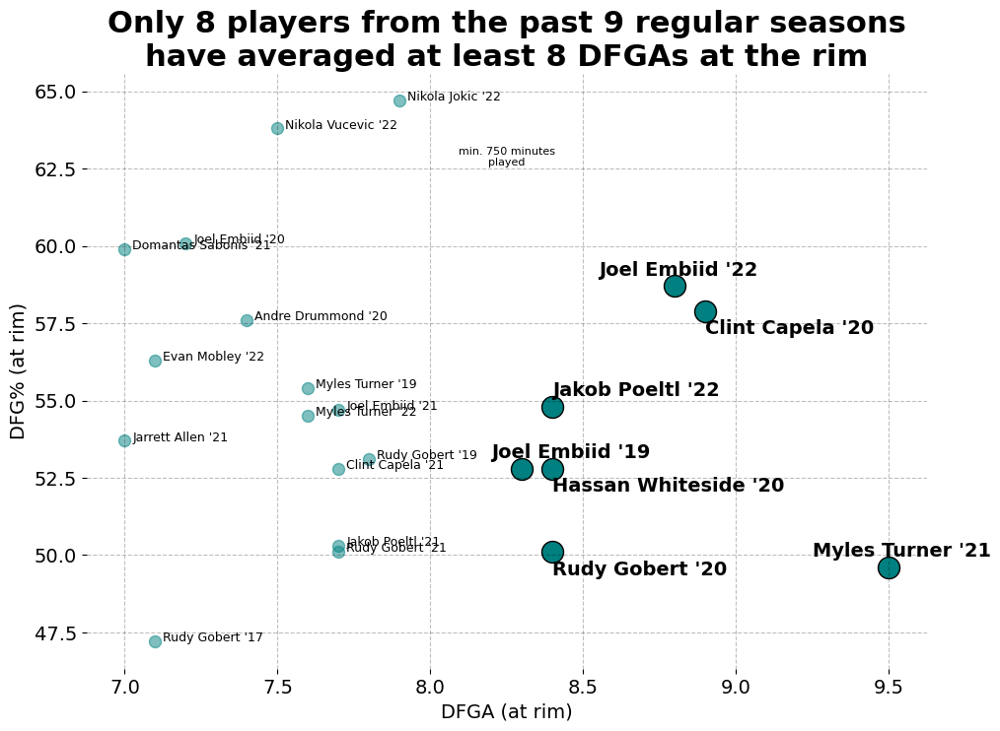

In [614]:
x = 22
lst = []
for df in allDEFENSES:
    variable = df[(df['DFGA'] >= 7) & (df['MP'] >= 750)][['DFGA', 'DFG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('DFGA', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=8]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=8]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=8]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'DFGA (at rim)': fgas, 'DFG% (at rim)':nets
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', xlabelsize=14,
             xticksize=14, ylabel='DFG% (at rim)', ylabelsize=14, yticksize=14, title=
'''Only 8 players from the past 9 regular seasons
have averaged at least 8 DFGAs at the rim''',
              titlefontsize=22, marker='o', scattercolor='teal', df2=df2, s2=250, x1=.025
             
             )

plt.text(9.5-.25, 49.6+.35, "Myles Turner '21", fontsize=14, weight='bold')
plt.text(8.9, 57.9-.75, "Clint Capela '20", fontsize=14, weight='bold')
plt.text(8.8-.25, 58.7+.35, "Joel Embiid '22", fontsize=14, weight='bold')
plt.text(8.4, 54.8+.35, "Jakob Poeltl '22", fontsize=14, weight='bold')
plt.text(8.4, 52.8-.75, "Hassan Whiteside '20", fontsize=14, weight='bold')
plt.text(8.4, 50.1-.75, "Rudy Gobert '20", fontsize=14, weight='bold')
plt.text(8.3-.1, 52.8+.35, "Joel Embiid '19", fontsize=14, weight='bold')

plt.text(8.25, 62.6, '''min. 750 minutes
played''',fontsize=8, ha='center')

#plt.savefig('scat highest volume rim protectors from past 9 regular seasons.pdf',  bbox_inches='tight')
plt.show()

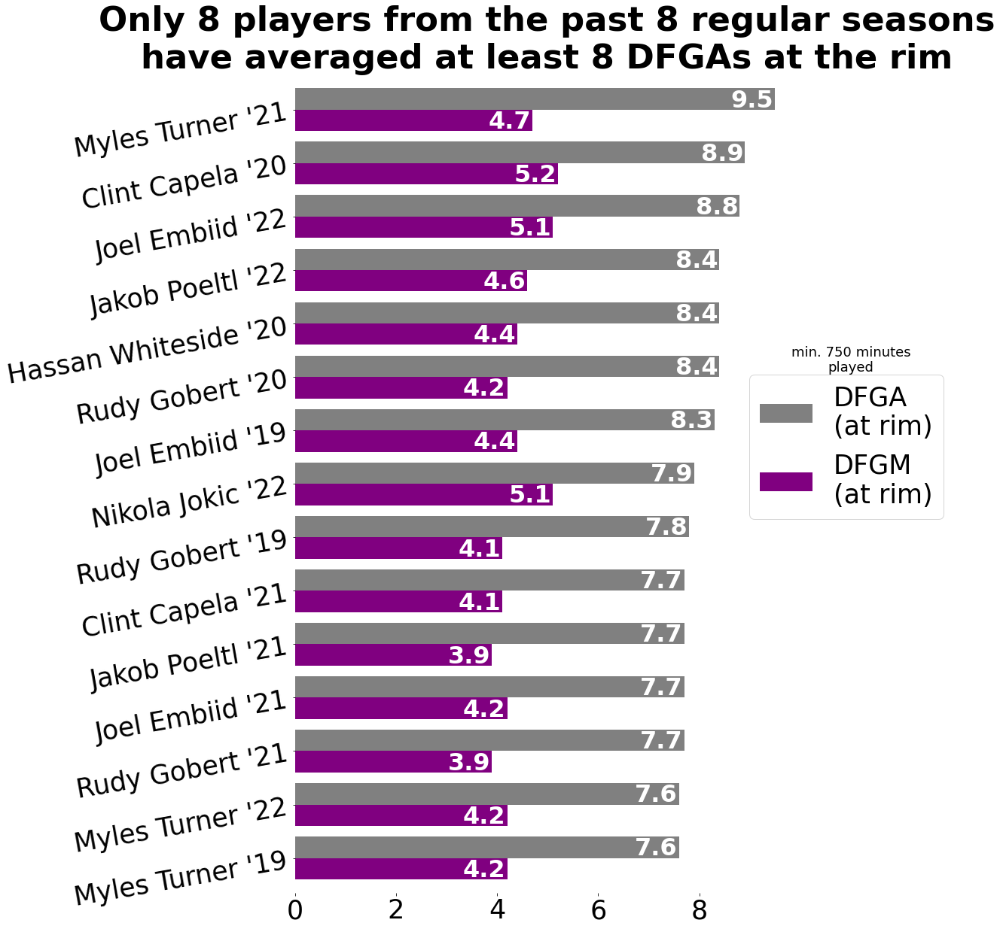

In [274]:
x = 22
lst = []
for df in allDEFENSES:
    variable = df[(df['DFGA'] >= 7) & (df['MP'] >= 750)][['DFGM', 'DFGA']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('DFGA', ascending=False)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), title = 
'''Only 8 players from the past 8 regular seasons
have averaged at least 8 DFGAs at the rim''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10,
upperbarshiftup=.05, lowerbarshiftdown=.35, shiftupperbarleft=.45, shiftlowerbarleft=.45, textbarfontsize=32,           
          textbarcolor='white', legend_labels=['''DFGM
(at rim)''', '''DFGA
(at rim)'''], legend_order=[1,0], legend_pos=[.875,.65], legend_size=35, width=.8, color=['purple', 'grey']
          
          )       
plt.text(11, 9.1, '''min. 750 minutes
played''', ha='center', fontsize=18)          

#plt.savefig('bar highest volume rim protectors from past 9 regular seasons.pdf',  bbox_inches='tight')
plt.show()

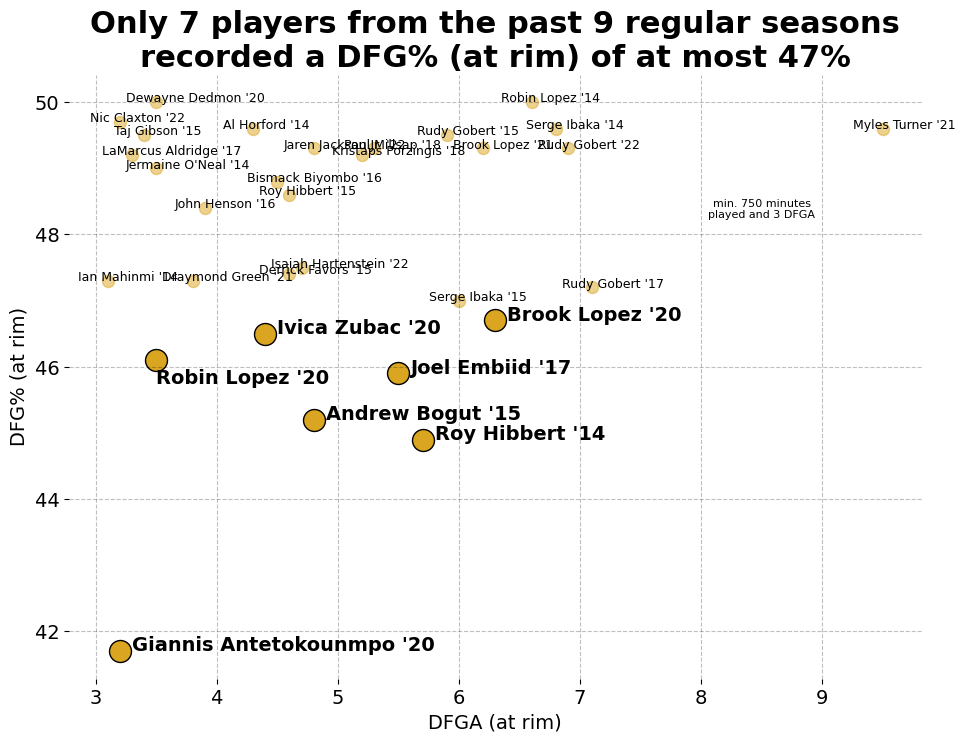

In [615]:
x = 22
lst = []
for df in allDEFENSES:
    variable = df[(df['DFG%'] <= 50) & (df['DFGA'] >= 3) & (df['MP'] >= 750)][['DFGA', 'DFG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('DFG%', ascending=True)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,1])<47]
fgas = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,1])<47]
nets = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,1])<47]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'DFGA (at rim)': fgas, 'DFG% (at rim)':nets
})
df2.set_index('PLAYER', inplace=True)
CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', xlabelsize=14, xticksize=14,
              ylabel='DFG% (at rim)', ylabelsize=14, yticksize=14, title = 
'''Only 7 players from the past 9 regular seasons
recorded a DFG% (at rim) of at most 47%''', titlefontsize=22, scattercolor='goldenrod', marker='o', df2=df2, s2=250,
             x1=-.25
             
             )

plt.text(3.2+.1, 41.7, "Giannis Antetokounmpo '20", fontsize=14, weight='bold')
plt.text(5.7+.1, 44.9, "Roy Hibbert '14", fontsize=14, weight='bold')
plt.text(4.8+.1, 45.2, "Andrew Bogut '15", fontsize=14, weight='bold')
plt.text(5.5+.1, 45.9, "Joel Embiid '17", fontsize=14, weight='bold')
plt.text(3.5, 46.1-.35, "Robin Lopez '20", fontsize=14, weight='bold')
plt.text(4.4+.1, 46.5, "Ivica Zubac '20", fontsize=14, weight='bold')
plt.text(6.3+.1, 46.7, "Brook Lopez '20", fontsize=14, weight='bold')
plt.text(8.5, 48.25, '''min. 750 minutes
played and 3 DFGA''', fontsize=8, horizontalalignment='center')

#plt.savefig('scat best rim protectors from past 9 regular seasons.pdf',  bbox_inches='tight')
plt.show()

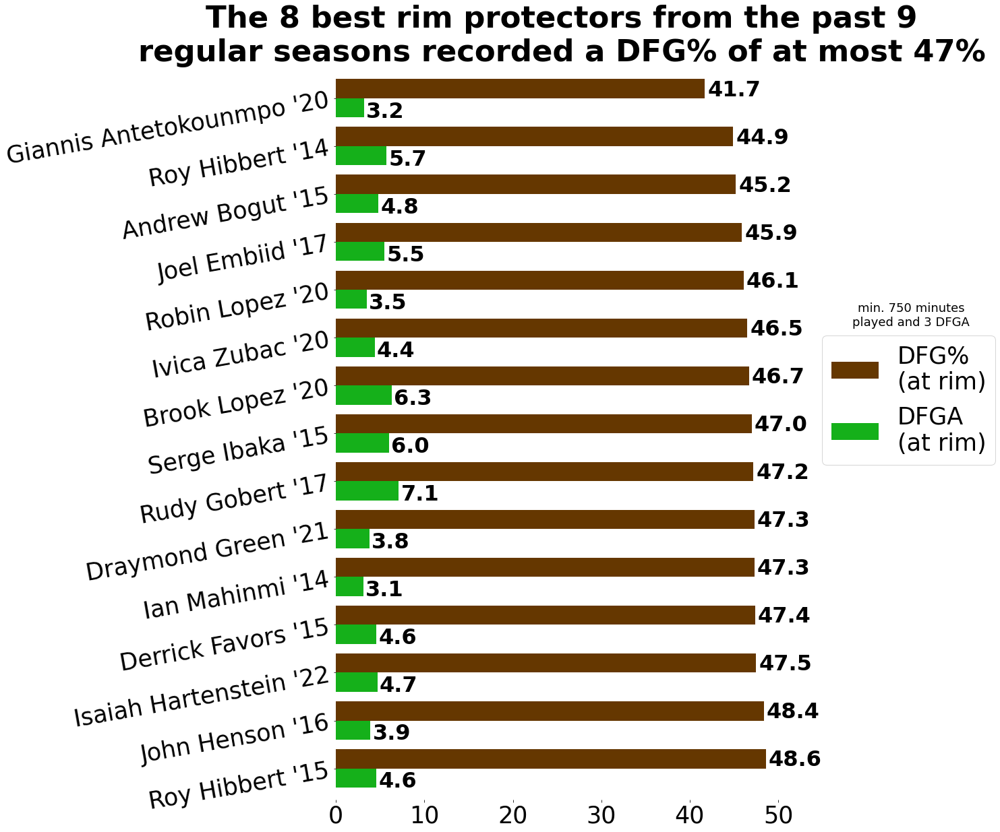

In [12]:
x = 22
lst = []
for df in allDEFENSES:
    variable = df[(df['DFG%'] <= 50) & (df['DFGA'] >= 3) & (df['MP'] >= 750)][['DFGA', 'DFG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_defenses = [lst[i] for i in range(len(lst))]
new_defenses

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defenses)
df1 = new.sort_values('DFG%', ascending=True)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12, 20), title=
'''The 8 best rim protectors from the past 9
regular seasons recorded a DFG% of at most 47%''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10,
          upperbarshiftup=.05, lowerbarshiftdown=.4, shiftupperbarleft=-3.3, shiftlowerbarleft=-2.4,
          textbarfontsize=32, textbarcolor='black', legend_labels=
['''DFGA
(at rim)''', '''DFG%
(at rim)'''], legend_order=[1,0], legend_pos=[1.05,.65], legend_size=35, width=.8, color=['xkcd:green', 'xkcd:brown']
          )

plt.text(65, 9.25, '''min. 750 minutes
played and 3 DFGA''', ha='center', fontsize=18)

#plt.savefig('bar best rim protectors past 9 reg.pdf', bbox_inches='tight')

plt.show()

In [117]:
# call LEBRON data
lebron21 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2021-22')
lebron21.set_index('PLAYER', inplace=True)

lebron20 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2020-21')
lebron20.set_index('PLAYER', inplace=True)

lebron19 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2019-20')
lebron19.set_index('PLAYER', inplace=True)

lebron18 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2018-19')
lebron18.set_index('PLAYER', inplace=True)

lebron17 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2017-18')
lebron17.set_index('PLAYER', inplace=True)

lebron16 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2016-17')
lebron16.set_index('PLAYER', inplace=True)

lebron15 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2015-16')
lebron15.set_index('PLAYER', inplace=True)

lebron14 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2014-15')
lebron14.set_index('PLAYER', inplace=True)

lebron13 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2013-14')
lebron13.set_index('PLAYER', inplace=True)

lebron12 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2012-13')
lebron12.set_index('PLAYER', inplace=True)

lebron11 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2011-12')
lebron11.set_index('PLAYER', inplace=True)

lebron10 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2010-11')
lebron10.set_index('PLAYER', inplace=True)

lebron09 = pd.read_excel('nbaRegularSeason_PlayersStats.xlsx', sheet_name='LEBRON 2009-10')
lebron09.set_index('PLAYER', inplace=True)

In [184]:
allLEBRONS = [lebron21, lebron20, lebron19, lebron18, lebron17, lebron16, lebron15, lebron14, lebron13,
lebron12, lebron11, lebron10, lebron09]

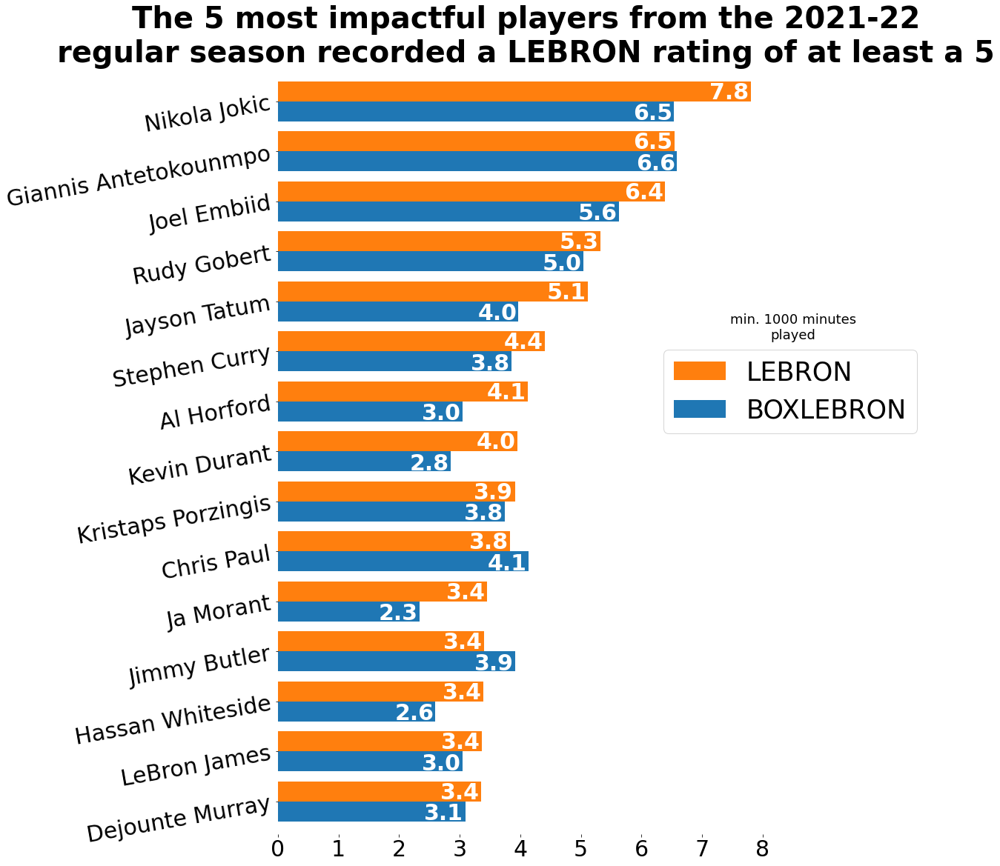

In [259]:
df1 = lebron21[(lebron21['MINUTES']>=1000) & (lebron21['LEBRON']>=2.6)][['BOXLEBRON','LEBRON']].sort_values('LEBRON', ascending=False)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,19), title=
'''The 5 most impactful players from the 2021-22
regular season recorded a LEBRON rating of at least a 5''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, 
           upperbarshiftup=.05, lowerbarshiftdown=.37,
           shiftupperbarleft=.35, shiftlowerbarleft=.35, textbarfontsize=30, textbarcolor='white', legend_labels = 
['''BOXLEBRON''', '''LEBRON'''], legend_order=[1,0], legend_pos=[.75,.65], legend_size=35, width=.8
           
          )

plt.text(8.5, 9.25, '''min. 1000 minutes
played''', ha='center', fontsize=18)
#plt.savefig('Top players LEBRON advanced metric from 2021-22 NBA regular season.pdf', bbox_inches = 'tight')
plt.show()

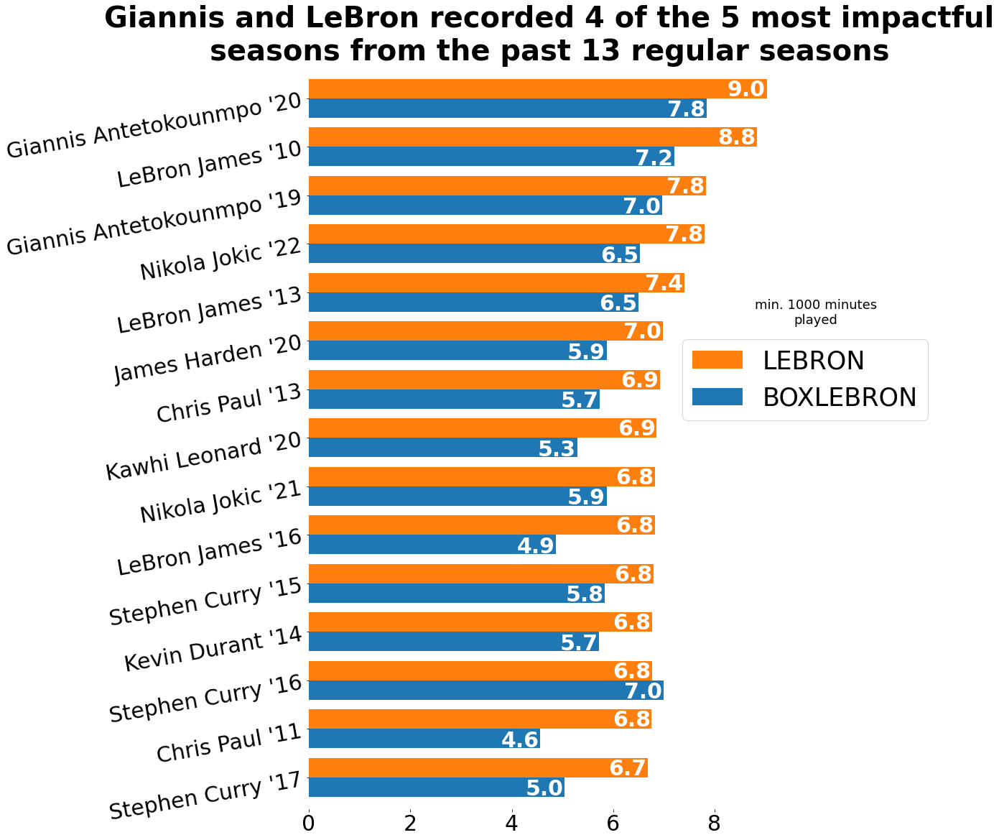

In [263]:
x = 22
lst = []
for df in allLEBRONS:
    variable = df[(df['LEBRON'] >= 6.5) & (df['MINUTES'] >= 1000)][['BOXLEBRON', 'LEBRON']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_brons = [lst[i] for i in range(len(lst))]
new_brons

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_brons)
df1 = new.sort_values('LEBRON', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,19), title=
'''Giannis and LeBron recorded 4 of the 5 most impactful
seasons from the past 13 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, 
           upperbarshiftup=.05, lowerbarshiftdown=.37,shiftupperbarleft=.4, shiftlowerbarleft=.4, 
           textbarfontsize=30, textbarcolor='white', legend_labels = 
['''BOXLEBRON''', '''LEBRON'''], legend_order=[1,0], legend_pos=[.75,.65], legend_size=35, width=.8
           
          )
plt.text(10, 9.35, '''min. 1000 minutes
played''', ha='center', fontsize=18)
#plt.savefig('Top players LEBRON advanced metric from past 13.pdf', bbox_inches = 'tight')
plt.show()

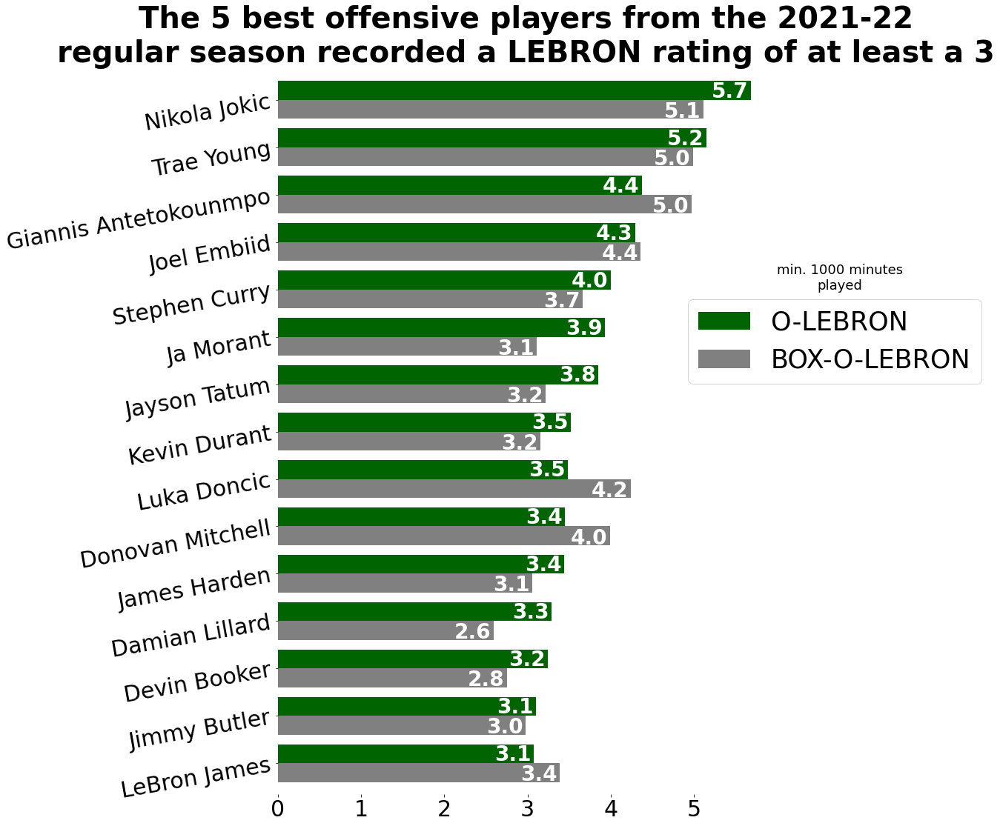

In [249]:
df1 = lebron21[(lebron21['MINUTES']>=1000) & (lebron21['O-LEBRON']>=1.988)][['BOXOLEBRON','O-LEBRON']].sort_values('O-LEBRON', ascending=False)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title = 
'''The 5 best offensive players from the 2021-22
regular season recorded a LEBRON rating of at least a 3''', titlefontsize=40, xticksize=30, yticksize=30, 
           ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.375,
           shiftupperbarleft=.25, shiftlowerbarleft=.25, textbarfontsize=28, textbarcolor='white', legend_labels= 
['''BOX-O-LEBRON''', '''O-LEBRON'''], legend_order=[1,0], legend_pos=[.8,.7], legend_size=35, width=.8, color=
['grey', 'darkgreen']
          
          
          )
plt.text(6.75, 10, '''min. 1000 minutes
played''', ha='center', fontsize=18)

#plt.savefig('Best offensive players O-LEBRON advanced metric from 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

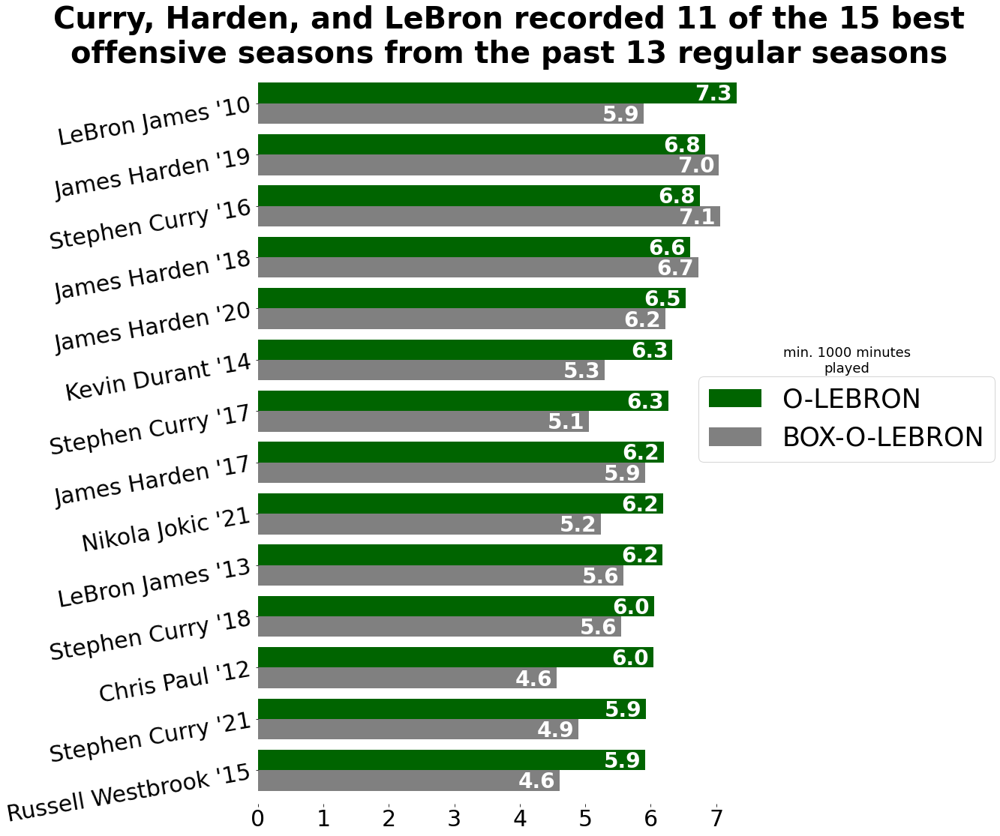

In [203]:
x = 22
lst = []
for df in allLEBRONS:
    variable = df[(df['O-LEBRON'] >= 5.9) & (df['MINUTES'] >= 1000)][['BOXOLEBRON', 'O-LEBRON']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_brons = [lst[i] for i in range(len(lst))]
new_brons

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_brons)
df1 = new.sort_values('O-LEBRON', ascending=False)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title=
'''Curry, Harden, and LeBron recorded 11 of the 15 best
offensive seasons from the past 13 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30, 
           ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.35,
           shiftupperbarleft=.35, shiftlowerbarleft=.35, textbarcolor='white', textbarfontsize=28, legend_labels= 
['''BOX-O-LEBRON''', '''O-LEBRON'''], legend_order=[1,0], legend_pos=[.85,.6], legend_size=35, width=.8,
           color=['grey', 'darkgreen']
          
          
          )
plt.text(9, 7.75, '''min. 1000 minutes
played''', ha='center', fontsize=18)
#plt.savefig('Best offensive players O-LEBRON advanced metric from past 13 NBA regular seasons.pdf', bbox_inches='tight')
plt.show()

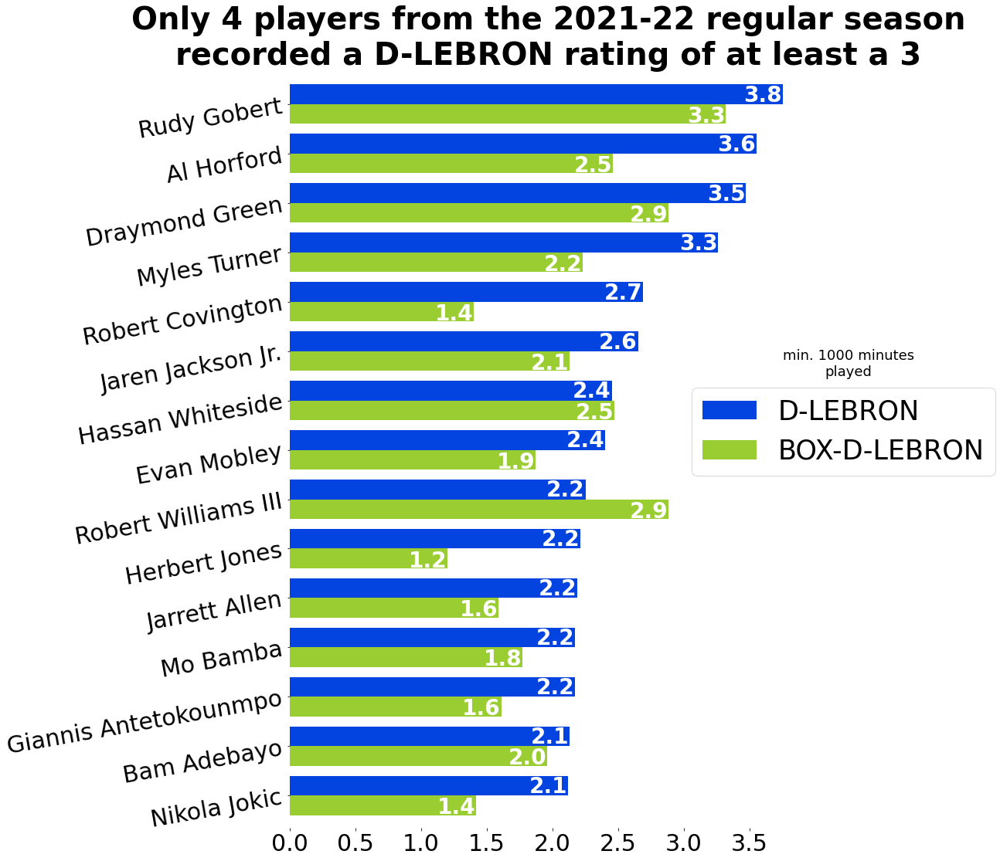

In [242]:
df1 = lebron21[(lebron21['MINUTES']>=1000) & (lebron21['D-LEBRON']>=1.5)][['BOXDLEBRON', 'D-LEBRON']].sort_values('D-LEBRON', ascending=False)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title = 
'''Only 4 players from the 2021-22 regular season
recorded a D-LEBRON rating of at least a 3''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, 
           upperbarshiftup=.05, lowerbarshiftdown=.375,
           shiftupperbarleft=.15, shiftlowerbarleft=.15, textbarfontsize=28, textbarcolor='white', legend_labels= 
['''BOX-D-LEBRON''', '''D-LEBRON'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, width=.8,
           color=['yellowgreen', 'xkcd:blue']
          
          
          )
plt.text(4.25, 8.5, '''min. 1000 minutes
played''', ha='center', fontsize=18)
#plt.savefig('D-LEBRON advanced metric from 2021-22 NBA regular season.pdf', bbox_inches='tight')
plt.show()

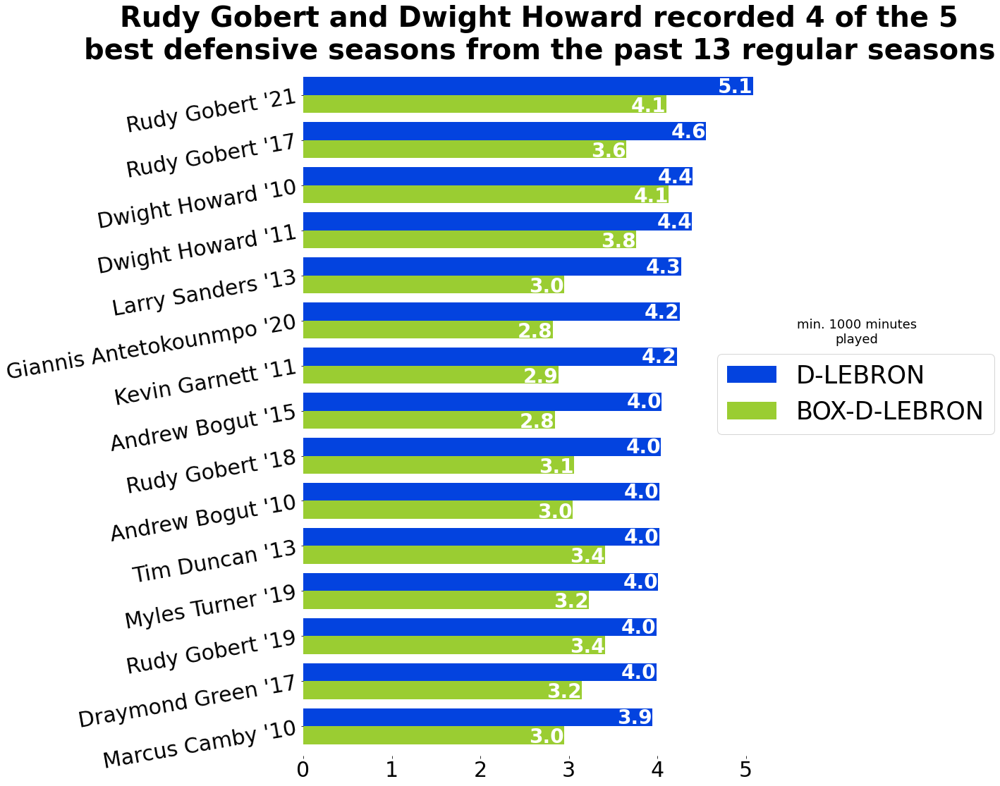

In [241]:
x = 22
lst = []
for df in allLEBRONS:
    variable = df[(df['D-LEBRON'] >= 3) & (df['MINUTES'] >= 1000)][['BOXDLEBRON', 'D-LEBRON']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_brons = [lst[i] for i in range(len(lst))]
new_brons

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_brons)
df1 = new.sort_values('D-LEBRON', ascending=False)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title=
'''Rudy Gobert and Dwight Howard recorded 4 of the 5
best defensive seasons from the past 13 regular seasons''', titlefontsize=40, xticksize=30, yticksize=30, 
           ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.375,
           shiftupperbarleft=.2, shiftlowerbarleft=.2, textbarcolor='white', textbarfontsize=28, legend_labels= 
['''BOX-D-LEBRON''', '''D-LEBRON'''], legend_order=[1,0], legend_pos=[.85,.6], legend_size=35, width=.8,
           color=['yellowgreen', 'xkcd:blue']
          
          
          )
plt.text(6.25, 8.5, '''min. 1000 minutes
played''', ha='center', fontsize=18)
#plt.savefig('Best defensive players D-LEBRON advanced metric from past 13 NBA regular seasons.pdf', bbox_inches='tight')
plt.show()

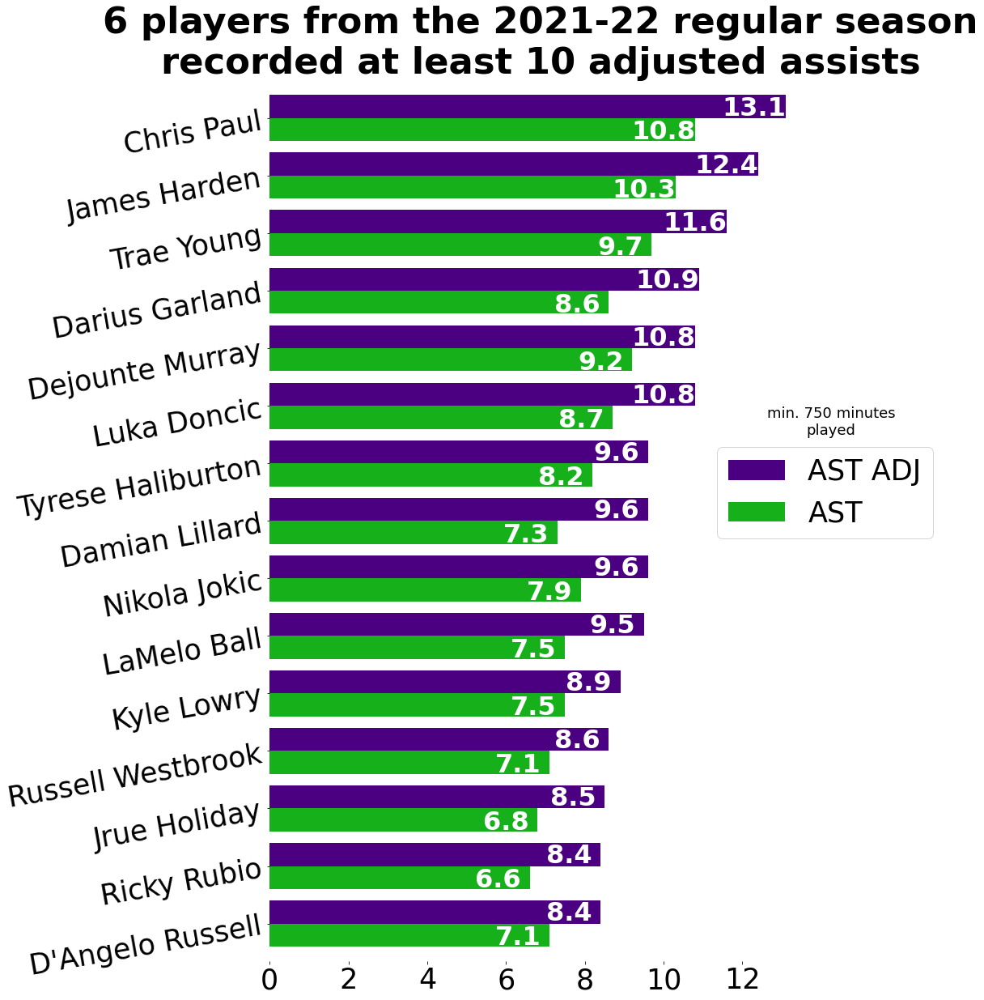

In [374]:
df1 = df_players_passing21[(df_players_passing21['AST ADJ'] >= 8) & (df_players_passing21['MP'] >= 750)][['AST', 'AST ADJ']].sort_values('AST ADJ', ascending=False)

df1 = df1.head(15)
CreateBarH(df1, figsize=(12,20), title = 
'''6 players from the 2021-22 regular season
recorded at least 10 adjusted assists''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10, 
           upperbarshiftup=.05, lowerbarshiftdown=.37,
          shiftupperbarleft=.8, shiftlowerbarleft=.8, textbarfontsize=32, textbarcolor='white', legend_labels= 
['''AST''', '''AST ADJ'''], legend_order=[1,0], legend_pos=[.8, .6], legend_size=35, width=.8, color=['xkcd:green', 'indigo']
           
          )
plt.text(14.25, 8.5, '''min. 750 minutes
played''', ha='center', fontsize=18)
#plt.savefig('AST ADJ 2021-22.pdf', bbox_inches='tight')
plt.show()

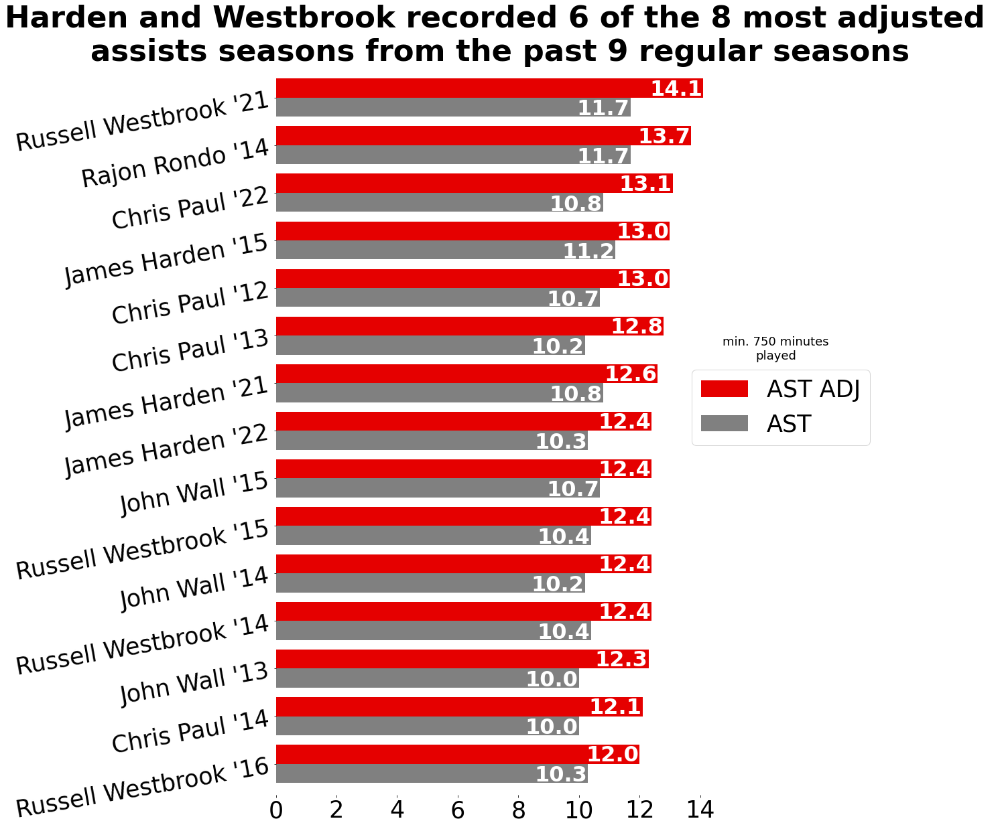

In [457]:
x = 22
lst = []
for df in allPASSING:
    variable = df[(df['AST ADJ'] >= 12) & (df['MP'] >= 750)][['AST', 'AST ADJ']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)
    x -= 1
    lst.append(variable)

new_passing = [lst[i] for i in range(len(lst))]
new_passing

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_passing)
df1 = new.sort_values('AST ADJ', ascending=False)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10, upperbarshiftup=.05,
          lowerbarshiftdown=.37, shiftupperbarleft=.9, shiftlowerbarleft=.9, textbarfontsize=32, textbarcolor='white',
           legend_labels= ['AST', 'AST ADJ'], title = 
'''Harden and Westbrook recorded 6 of the 8 most adjusted 
assists seasons from the past 9 regular seasons''', legend_order=[1,0], legend_pos=[.9,.6], legend_size=35, 
           width=.8, color=['grey', 'xkcd:red']
          
          
          )
plt.text(16.5, 8.5, '''min. 750 minutes
played''', ha='center', fontsize=18)
#plt.savefig('AST ADJ past 9.pdf', bbox_inches='tight')
plt.show()

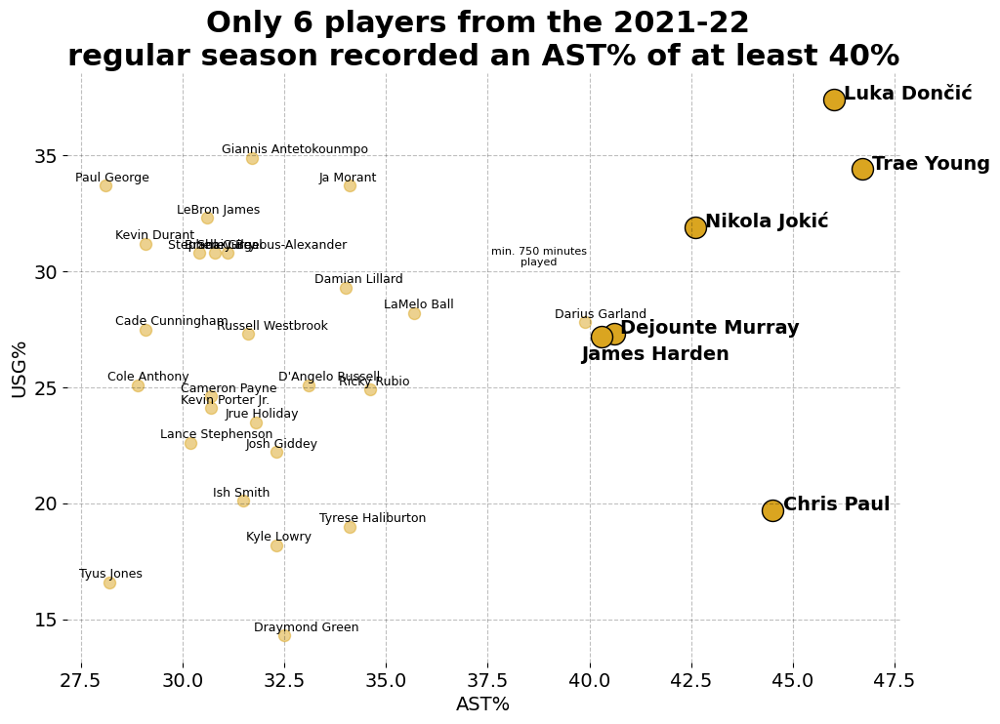

In [485]:
df1 = df_players_advanced21[(df_players_advanced21['AST%']>=28) & (df_players_advanced21['MP']>=750)].sort_values('AST%', ascending=False)[['AST%', 'USG%']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=40]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=40]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=40]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'AST%': x, 'USG':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='AST%', ylabel='USG%', ylabelsize=14, yticksize=14,
              title=
'''Only 6 players from the 2021-22 
regular season recorded an AST% of at least 40%''', titlefontsize=22, marker='o', scattercolor='goldenrod', 
              xlabelsize=14, xticksize=14, df2=df2, s2=250,
        y1=.2,x1=-.75     
             
             )
plt.text(46.7+.25, 34.4, 'Trae Young', fontsize=14, weight='bold')
plt.text(46.0+.25, 37.4, 'Luka Dončić', fontsize=14, weight='bold')
plt.text(44.5+.25, 19.7, 'Chris Paul', fontsize=14, weight='bold')
plt.text(42.6+.25, 31.9, 'Nikola Jokić', fontsize=14, weight='bold')
plt.text(40.6+.15, 27.3, 'Dejounte Murray', fontsize=14, weight='bold')
plt.text(40.3-.5, 27.2-1, 'James Harden', fontsize=14, weight='bold')
plt.text(38.75, 30.25, '''min. 750 minutes
played''', ha='center', fontsize=8)

#plt.savefig('scat AST% 2021-22.pdf', bbox_inches='tight')
plt.show()

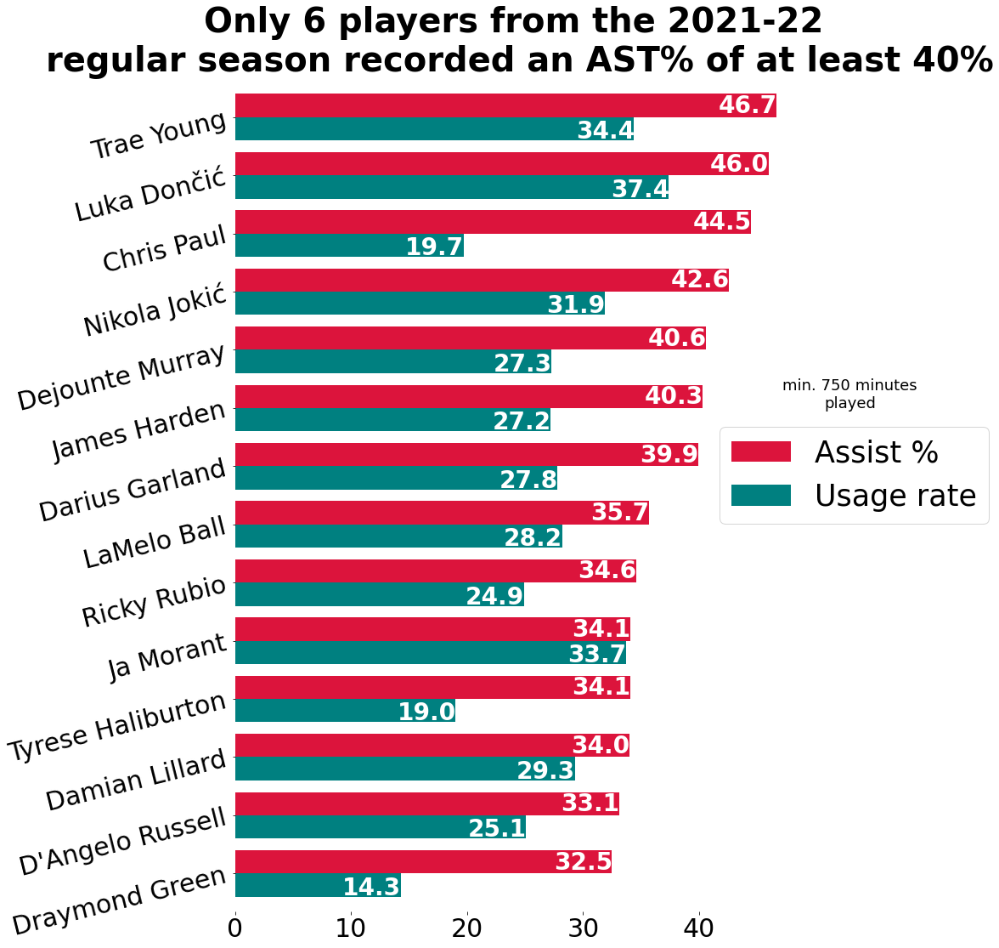

In [486]:
df = df_players_advanced21[(df_players_advanced21['AST%']>=28) & (df_players_advanced21['MP']>=750)][['USG%', 'AST%']].sort_values('AST%', ascending=False)
df = df.head(14)
CreateBarH(df, figsize=(12,18), title= 
'''Only 6 players from the 2021-22 
regular season recorded an AST% of at least 40%''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=14, upperbarshiftup=.07, lowerbarshiftdown=.37,
          shiftupperbarleft=2.5, shiftlowerbarleft=2.5, textbarfontsize=28, textbarcolor='white', legend_labels= 
['Usage rate', 'Assist %'], legend_order=[1,0], legend_pos=[.825, .6], legend_size=35, width=.8, color =
['teal', 'crimson']          
          
          )

plt.text(53, 8, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar AST% 2021-22.pdf', bbox_inches='tight')
plt.show()

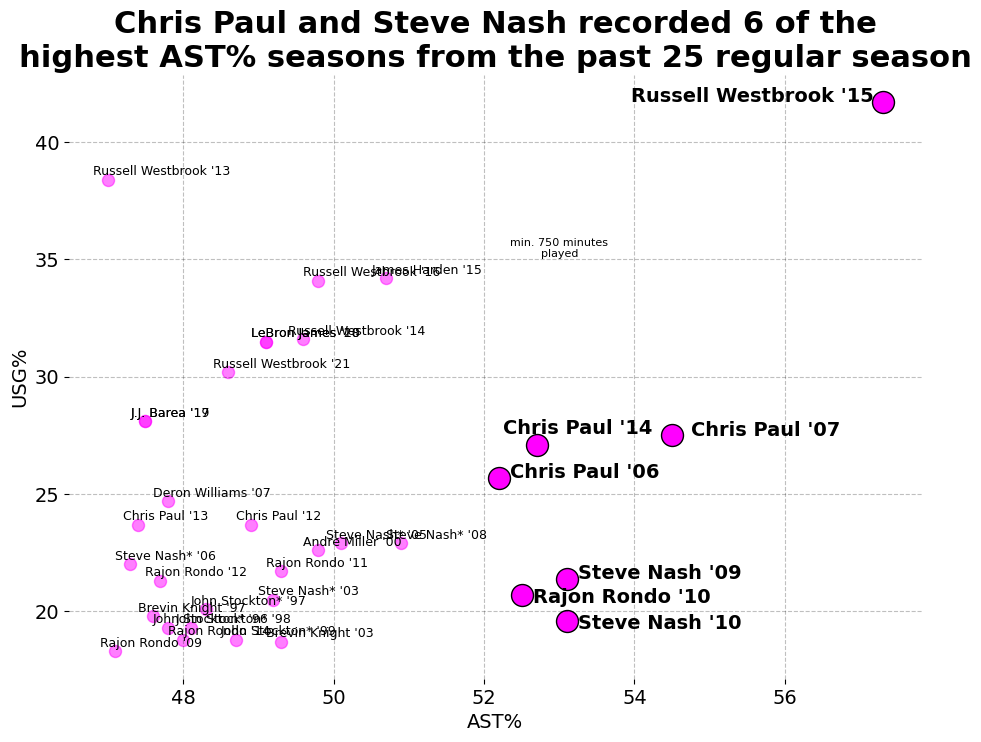

In [522]:
x = 2022
lst = []
for df in allADVANCED:
    variable = df[(df['AST%'] >= 47) & (df['MP'] >= 750)][['AST%', 'USG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_advanced = [lst[i] for i in range(len(lst))]
new_advanced

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_advanced)
df1 = new.sort_values('AST%', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if (df1.iloc[i,0])>=52]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if (df1.iloc[i,0])>=52]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if (df1.iloc[i,0])>=52]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    'PLAYER': names, 'AST%': x, 'USG':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='AST%', xlabelsize=14, xticksize=14,
             ylabel='USG%', ylabelsize=14, yticksize=14, title = 
'''Chris Paul and Steve Nash recorded 6 of the
highest AST% seasons from the past 25 regular season''', titlefontsize=22, marker='o', scattercolor='fuchsia', df2=df2, s2=250,y1=.2,x1=-.2
             )

plt.text(57.3-3.35, 41.7, "Russell Westbrook '15", fontsize=14, weight='bold')
plt.text(54.5+.25, 27.5, "Chris Paul '07", fontsize=14, weight='bold')
plt.text(53.1+.15, 21.4, "Steve Nash '09", fontsize=14, weight='bold')
plt.text(53.1+.15, 19.6-.35, "Steve Nash '10", fontsize=14, weight='bold')
plt.text(52.7-.45, 27.1+.45, "Chris Paul '14", fontsize=14, weight='bold')
plt.text(52.5+.15, 20.7-.35, "Rajon Rondo '10", fontsize=14, weight='bold')
plt.text(52.2+.15, 25.7, "Chris Paul '06", fontsize=14, weight='bold')
plt.text(53, 35.1, '''min. 750 minutes
played''', ha='center', fontsize=8)
#plt.savefig('scat AST% past 25 years.pdf', bbox_inches='tight')
plt.show()

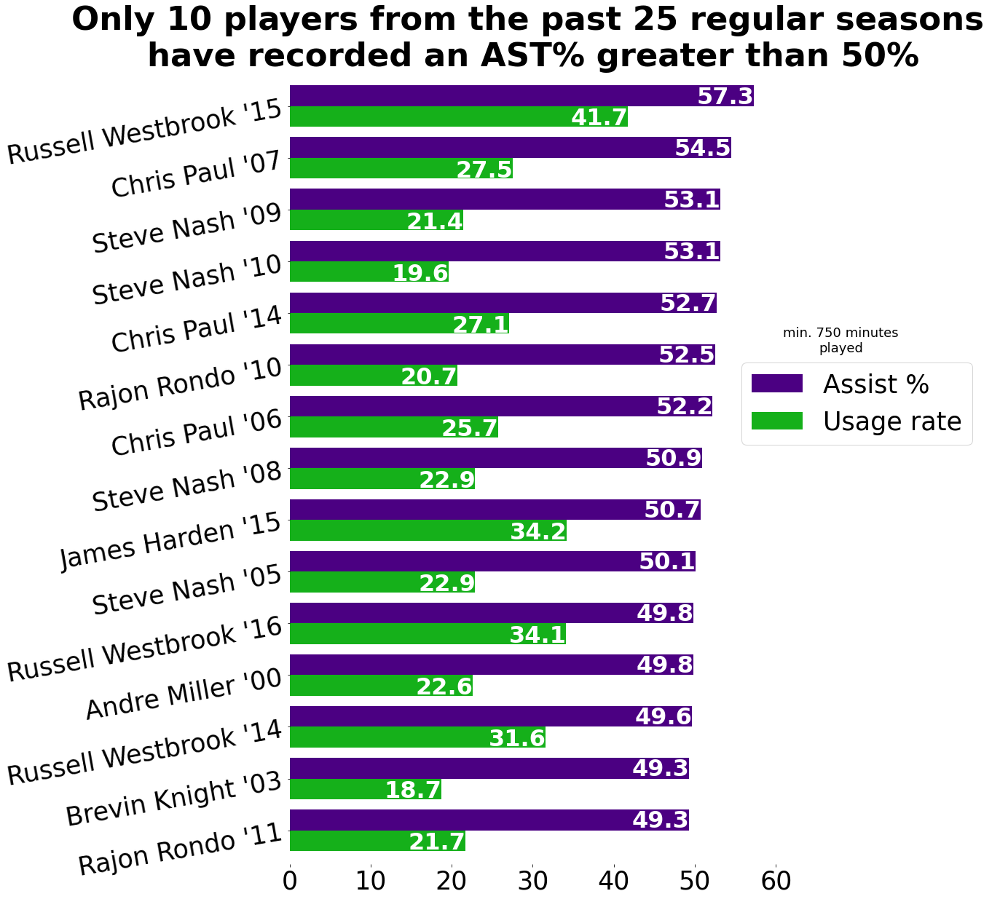

In [551]:
x = 2022
lst = []
for df in allADVANCED:
    variable = df[(df['AST%'] >= 47) & (df['MP'] >= 750)][['USG%', 'AST%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'].astype(str) + ' \''+ str(x)[-2:]
    x -= 1
    lst.append(variable)

new_advanced = [lst[i] for i in range(len(lst))]
new_advanced

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_advanced)
collect = []
for i in range(len(new.index)):
    collect.append(new.iloc[i,0].replace('*', ''))

new['PLAYER'] = collect
df1 = new.sort_values('AST%', ascending=False)
df1.set_index('PLAYER',inplace=True)


df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), title = 
'''Only 10 players from the past 25 regular seasons 
have recorded an AST% greater than 50%''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10,
           upperbarshiftup=.05, lowerbarshiftdown=.37, shiftupperbarleft=3.5, shiftlowerbarleft=3.5,
           textbarfontsize=32, textbarcolor='white', legend_labels= ['Usage rate', 'Assist %'],
           legend_order=[1,0], legend_pos=[.9,.65], legend_size=35, color=['xkcd:green', 'indigo'], width=.8
          )
plt.text(68, 9.25, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar AST% past 25 years.pdf', bbox_inches='tight')
plt.show()

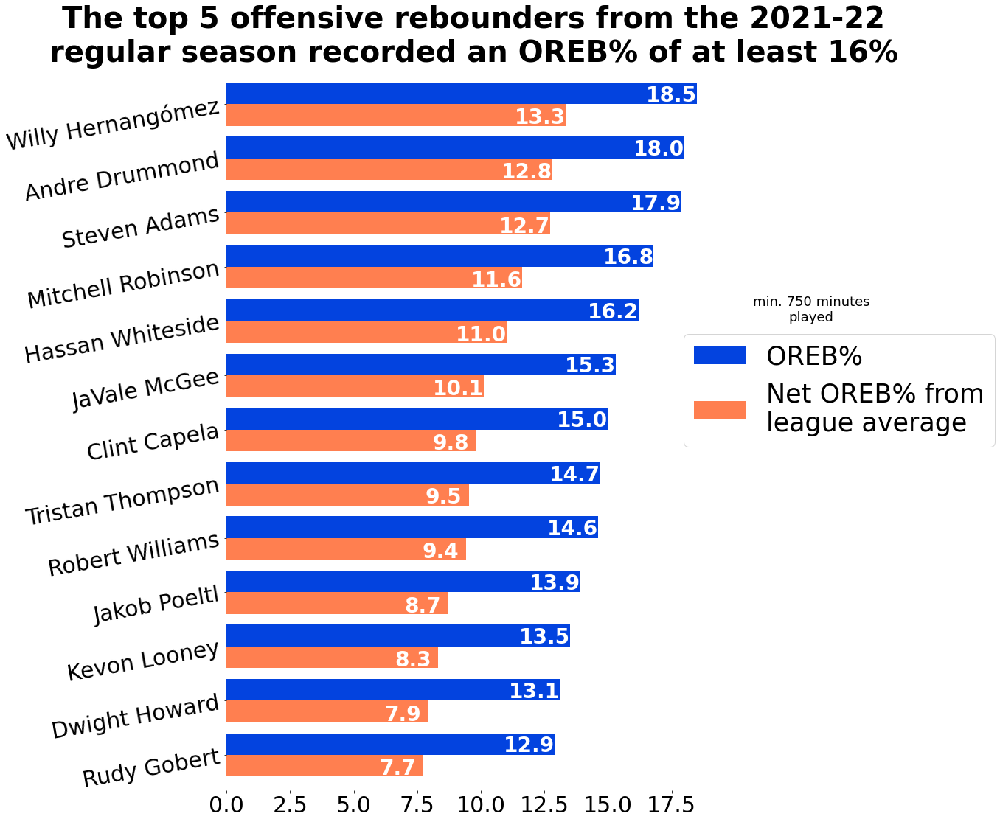

In [576]:
df = df_players_advanced21[(df_players_advanced21['ORB%']>=12) & (df_players_advanced21['MP']>=750)][['ORB%']]
df['Net ORB% from league average'] = df['ORB%'] - df_players_advanced21['ORB%'].mean()
df.sort_values('ORB%', ascending=False, inplace=True)
df1 = df[['Net ORB% from league average', 'ORB%']].head(13)

CreateBarH(df1, figsize=(12,18), title = 
'''The top 5 offensive rebounders from the 2021-22
regular season recorded an OREB% of at least 16%''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, upperbarshiftup=.05, lowerbarshiftdown=.37,
shiftupperbarleft=1, shiftlowerbarleft=1, textbarfontsize=28, textbarcolor='white', legend_labels= 
['''Net OREB% from
league average''', 'OREB%'], legend_order=[1,0], legend_pos=[.9,.65], legend_size=35, width=.8,
           color=['coral', 'xkcd:blue']
          
          )
plt.text(23, 8, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar ORB% 2021-22 reg.pdf', bbox_inches='tight')
plt.show()

In [577]:
df_players_advanced21[(df_players_advanced21['DRB%']>=29.4) & (df_players_advanced21['MP']>=750)][['DRB%']].shape

(13, 1)

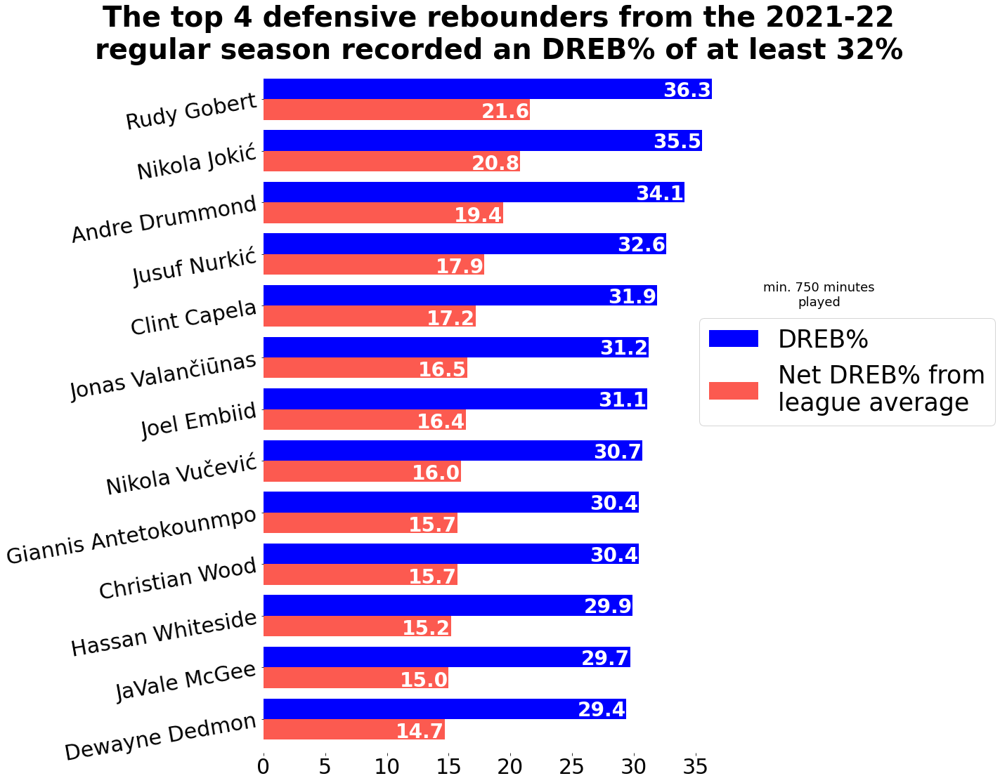

In [583]:
df = df_players_advanced21[(df_players_advanced21['DRB%']>=29.4) & (df_players_advanced21['MP']>=750)][['DRB%']]
df['Net DRB% from league average'] = df['DRB%'] - df_players_advanced21['DRB%'].mean()
df.sort_values('DRB%', ascending=False, inplace=True)
df1 = df[['Net DRB% from league average', 'DRB%']].head(13)

CreateBarH(df1, figsize=(12,18), title = 
'''The top 4 defensive rebounders from the 2021-22
regular season recorded an DREB% of at least 32%''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, 
           upperbarshiftup=.05, lowerbarshiftdown=.37,
shiftupperbarleft=2, shiftlowerbarleft=2, textbarfontsize=28, textbarcolor='white', legend_labels= 
['''Net DREB% from
league average''', 'DREB%'], legend_order=[1,0], legend_pos=[.9,.65], legend_size=35, width=.8,
           color=['xkcd:coral', 'blue']
          
          )
plt.text(45, 8, '''min. 750 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar DRB% 2021-22 reg.pdf', bbox_inches='tight')
plt.show()